In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
import seaborn as sns
import matplotlib.pyplot as plt
try:
#     plt.style.use('belle2')
    #plt.style.use('belle2_serif')
    plt.style.use('belle2_modern')
except OSError:
    print("Please install belle2 matplotlib style")   

px = 1/plt.rcParams['figure.dpi']
# plt.figure(figsize=(576*px, 396*px))

In [2]:
import os
import pandas as pd
from pandas import HDFStore
from os import path
from yaml import safe_load

from hist.get_data import get_data
from hist.bkg_stack import generic_ntuple, get_data_in_module
from read_yaml_to_dict import read_yaml_to_dict
from src.sample_name import sample_name
from src.combine_cuts import combine_cuts
print(os.getcwd())

Welcome to JupyROOT 6.26/04
For optimal usage set `plt.style.use('belle2')`
['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'belle2', 'belle2_modern', 'belle2_serif', 'belle2_wg1', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn', 'seaborn-bright', 'seaborn-colorblind', 'seaborn-dark', 'seaborn-dark-palette', 'seaborn-darkgrid', 'seaborn-deep', 'seaborn-muted', 'seaborn-notebook', 'seaborn-paper', 'seaborn-pastel', 'seaborn-poster', 'seaborn-talk', 'seaborn-ticks', 'seaborn-white', 'seaborn-whitegrid', 'tableau-colorblind10']
/home/jykim/workspace/DRAW/read_yaml_to_dict.py
/home/jykim/workspace/DRAW
/home/jykim/workspace/DRAW


In [3]:

from hist.draw_stack import draw_stack_include_signal
from hist.draw_stack import draw_stack_except_signal,draw_stack_no_signal

In [4]:
location='lab_ssd'
option = 'train_v2_extraction_pi0veto_sig_bkg'
sample_info = read_yaml_to_dict("samples")

In [5]:
sample_info

{'pid_0_5': {'ccbar': '/ccbar/pid_0_5_ccbar_recon_output_0*.root',
  'charged': '/charged/pid_0_5_charged_recon_output_0*.root',
  'mixed': '/mixed/pid_0_5_mixed_recon_output_0*.root',
  'uubar': '/uubar/pid_0_5_uubar_recon_output_0*.root',
  'ddbar': '/ddbar/pid_0_5_ddbar_recon_output_0*.root',
  'ssbar': '/ssbar/pid_0_5_ssbar_recon_output_0*.root',
  'taupair': '/taupair/pid_0_5_taupair_recon_output_0*.root'},
 'pid_0_5_no_signal': {'ccbar': '/ccbar/pid_0_5_no_signal_ccbar_recon_output_0*.root',
  'charged': '/charged/pid_0_5_charged_recon_output_0*.root',
  'mixed': '/mixed/pid_0_5_mixed_recon_output_0*.root',
  'uubar': '/uubar/pid_0_5_uubar_recon_output_0*.root',
  'ddbar': '/ddbar/pid_0_5_ddbar_recon_output_0*.root',
  'ssbar': '/ssbar/pid_0_5_ssbar_recon_output_0*.root',
  'taupair': '/taupair/pid_0_5_taupair_recon_output_0*.root'},
 'location': {'kekcc': '/group/belle/users/jaeyoung/storage/01_recon/merge_generic_bkg',
  'lab_nas': '/home/jykim/nas/storage/01_recon/merge_generi

In [6]:
sample_loc=sample_name(option=option, location=location, sample_info=sample_info) 
#sample_loc=sample_name(option='pid_0_5_no_signal', location=location) 
print(sample_loc )

{'ccbar': '/media/jykim/ssd_T5/storage/01_recon/merge_generic_bkg/ccbar/train_v2_extraction_pi0veto_sig_bkg_ccbar_recon_output_0*.root', 'charged': '/media/jykim/ssd_T5/storage/01_recon/merge_generic_bkg/charged/train_v2_extraction_pi0veto_sig_bkg_charged_recon_output_0*.root', 'mixed': '/media/jykim/ssd_T5/storage/01_recon/merge_generic_bkg/mixed/train_v2_extraction_pi0veto_sig_bkg_mixed_recon_output_0*.root', 'uubar': '/media/jykim/ssd_T5/storage/01_recon/merge_generic_bkg/uubar/train_v2_extraction_pi0veto_sig_bkg_uubar_recon_output_0*.root', 'ddbar': '/media/jykim/ssd_T5/storage/01_recon/merge_generic_bkg/ddbar/train_v2_extraction_pi0veto_sig_bkg_ddbar_recon_output_0*.root', 'ssbar': '/media/jykim/ssd_T5/storage/01_recon/merge_generic_bkg/ssbar/train_v2_extraction_pi0veto_sig_bkg_ssbar_recon_output_0*.root', 'taupair': '/media/jykim/ssd_T5/storage/01_recon/merge_generic_bkg/taupair/train_v2_extraction_pi0veto_sig_bkg_taupair_recon_output_0*.root'}


In [7]:
List = ['phi', 'antiKstar', 'rho', 'omega']
extract_variables = "plot_variables"

In [8]:
plot_variables = read_yaml_to_dict(extract_variables )

In [9]:
plot_variables

{'vars': ['D0_M',
  'Dstarp_Q',
  'D0_cosHel_0',
  'Dstarp_CMS_p',
  'gamma_E',
  'gamma_clusterSecondMoment',
  '__ncandidates__',
  '__experiment__',
  '__run__',
  '__event__',
  'Dstarp_isSignal',
  'D0_isSignal']}

In [12]:
for mode in List:
    if mode == 'phi':
        plot_variables = read_yaml_to_dict(extract_variables )
        plot_variables['vars'].append('Pi0_Prob')
        plot_variables['vars'].append('Eta_Prob')
        plot_variables['vars'].append('Pis_charge')
        pd_phi = generic_ntuple(vector=mode, variables_dict=plot_variables,sample_location=sample_loc)
    elif mode == 'antiKstar':
        plot_variables = read_yaml_to_dict(extract_variables )
        plot_variables['vars'].append('Pi0_Prob')
        plot_variables['vars'].append('Eta_Prob')
        plot_variables['vars'].append('Pis_charge')
        pd_antiKstar = generic_ntuple(vector=mode, variables_dict=plot_variables,sample_location=sample_loc)
    elif mode == 'rho':
        plot_variables = read_yaml_to_dict(extract_variables )
        plot_variables['vars'].append('Pi0_Prob')
        plot_variables['vars'].append('Eta_Prob')
        plot_variables['vars'].append('Pis_charge')
        pd_rho = generic_ntuple(vector=mode, variables_dict=plot_variables,sample_location=sample_loc)
    elif mode == 'omega':
        plot_variables = read_yaml_to_dict(extract_variables )
        plot_variables['vars'].append('Pi0_Prob')
        plot_variables['vars'].append('Eta_Prob')
        plot_variables['vars'].append('Pis_charge')
        pd_omega = generic_ntuple(vector=mode, variables_dict=plot_variables,sample_location=sample_loc)
        

['D0_M', 'Dstarp_Q', 'D0_cosHel_0', 'Dstarp_CMS_p', 'gamma_E', 'gamma_clusterSecondMoment', '__ncandidates__', '__experiment__', '__run__', '__event__', 'Dstarp_isSignal', 'D0_isSignal', 'Pi0_Prob', 'Eta_Prob', 'Pis_charge', 'Phi_InvM', 'D0_cosHel_0']
['D0_M', 'Dstarp_Q', 'D0_cosHel_0', 'Dstarp_CMS_p', 'gamma_E', 'gamma_clusterSecondMoment', '__ncandidates__', '__experiment__', '__run__', '__event__', 'Dstarp_isSignal', 'D0_isSignal', 'Pi0_Prob', 'Eta_Prob', 'Pis_charge', 'antiKstar_InvM', 'D0_cosHel_0']
['D0_M', 'Dstarp_Q', 'D0_cosHel_0', 'Dstarp_CMS_p', 'gamma_E', 'gamma_clusterSecondMoment', '__ncandidates__', '__experiment__', '__run__', '__event__', 'Dstarp_isSignal', 'D0_isSignal', 'Pi0_Prob', 'Eta_Prob', 'Pis_charge', 'Rho_InvM', 'D0_cosHel_0']
['D0_M', 'Dstarp_Q', 'D0_cosHel_0', 'Dstarp_CMS_p', 'gamma_E', 'gamma_clusterSecondMoment', '__ncandidates__', '__experiment__', '__run__', '__event__', 'Dstarp_isSignal', 'D0_isSignal', 'Pi0_Prob', 'Eta_Prob', 'Pis_charge', 'D0_cosHel_2'

In [ ]:
mode = 'phi'
half_1M_1_phi = get_data(file=phi_file, tree='phi', base_filter=None,variables=variables)
dataset = half_1M_1_phi['D0_M']

# Watch variation according to signal extraction

In [11]:
# print(var_name_phi)

In [12]:
Watching_vars = ['D0_M','Dstarp_CMS_p','Dstarp_Q','class','Pi0_Prob']

## phi

In [13]:
pd_phi.Dstarp_Q.max()

0.020428746938705444

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


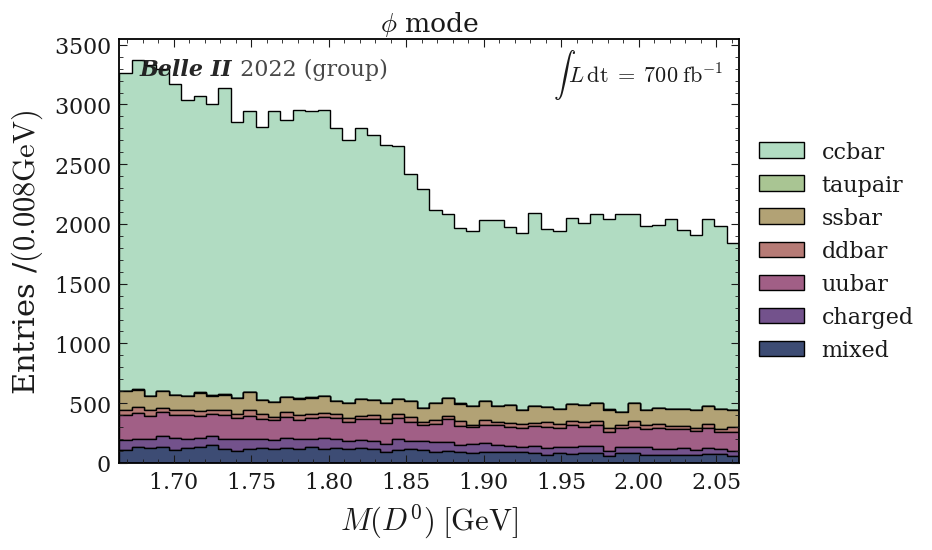

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


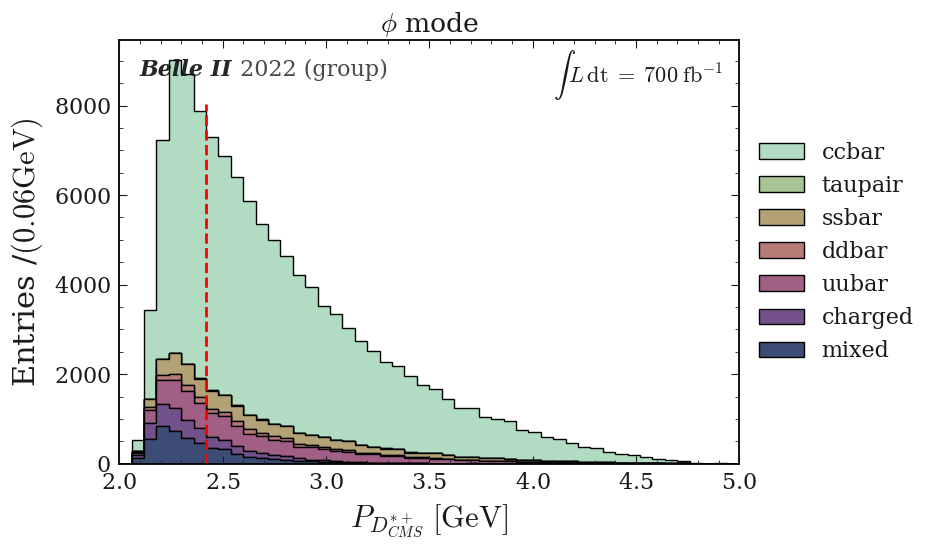

Q
$Q \; [\mathrm{GeV}]$


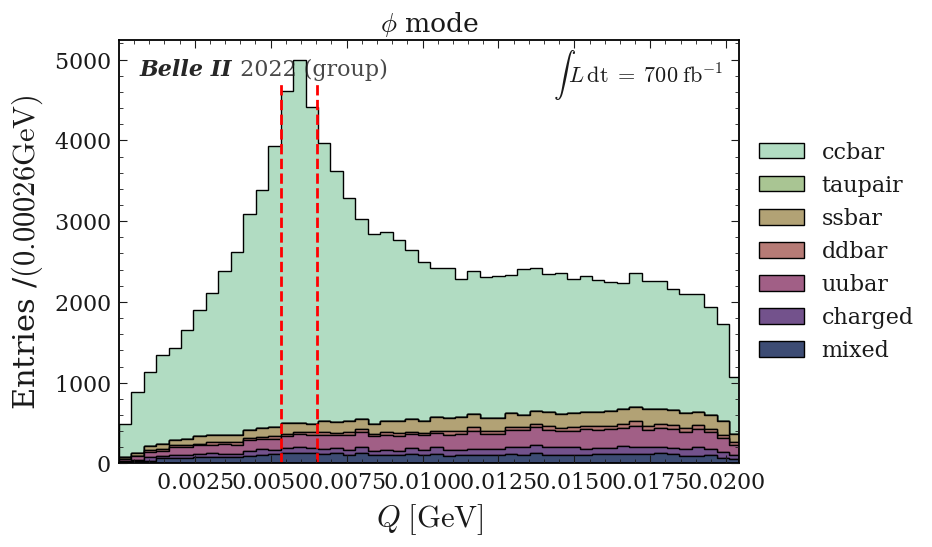

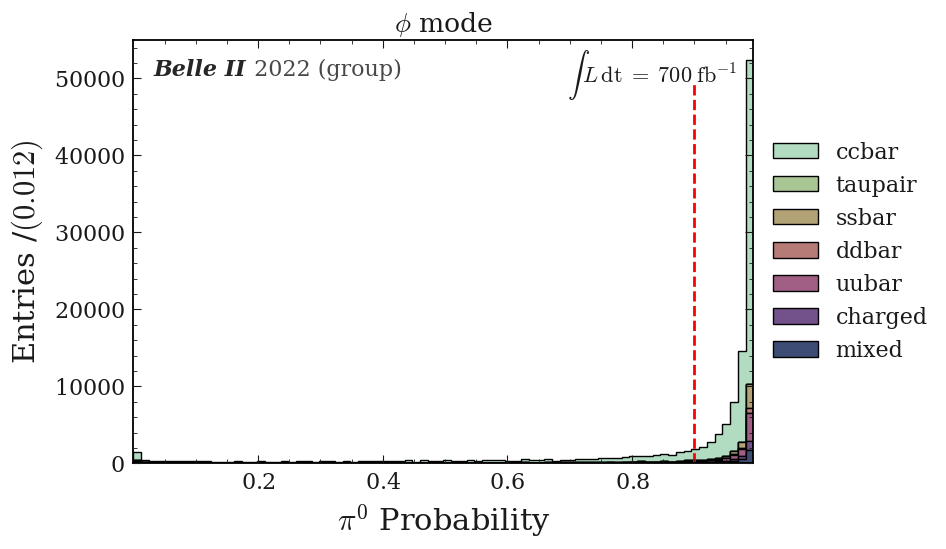

M(\phi)
$M(\phi) \; [\mathrm{GeV}]$


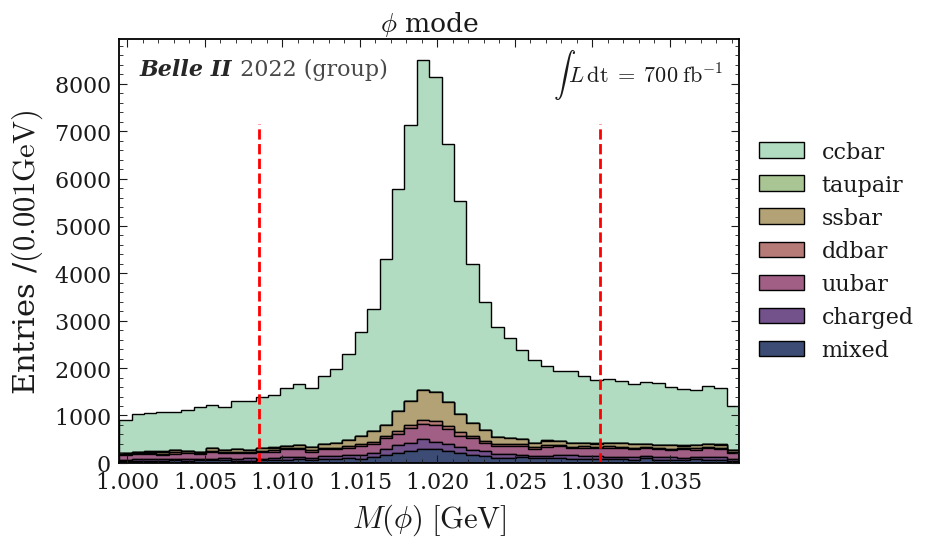

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [14]:
Phi_watching_vars = Watching_vars + ['Phi_InvM']
plot_title = r'$\phi$ mode'
var_unit_phi = read_yaml_to_dict("vars_name_units")
var_unit_phi = var_unit_phi['units']

var_name_phi = read_yaml_to_dict("vars_name_units")
var_name_phi = var_name_phi['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"

pd_phi = pd_phi.query("(Phi_InvM < 1.0195+0.02) and (Phi_InvM > 1.0195-0.02)")
draw_stack_no_signal(figname='Before_0_No_cut', df=pd_phi,bins=80, vector='phi', draw_variables=Phi_watching_vars,var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi);            

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


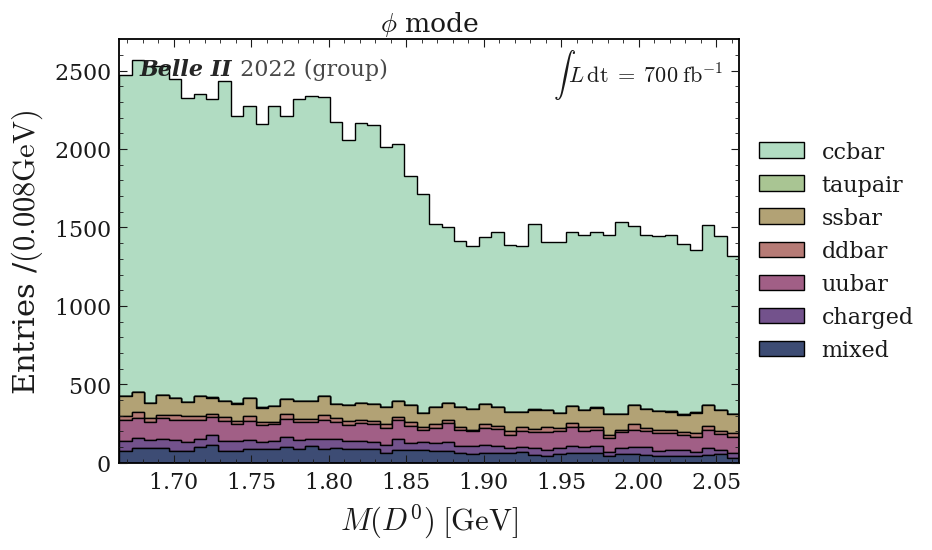

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


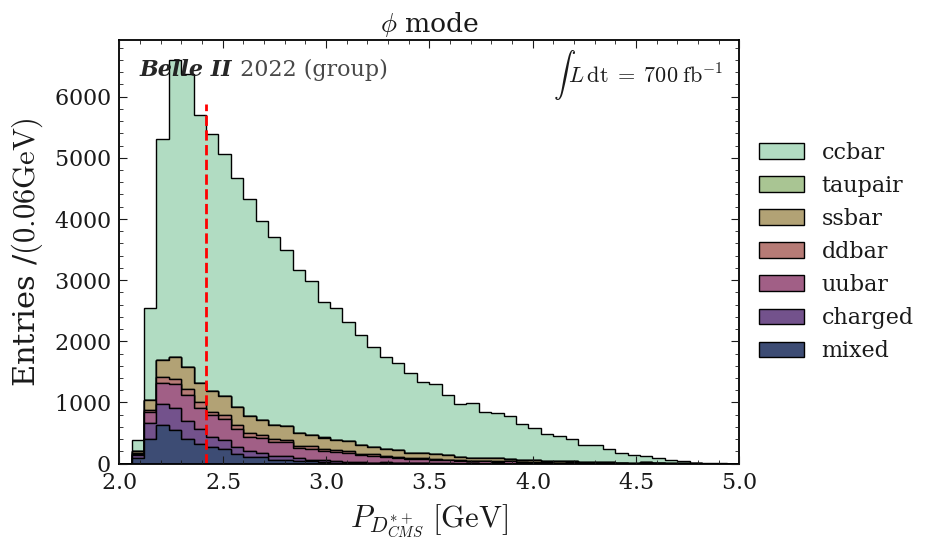

Q
$Q \; [\mathrm{GeV}]$


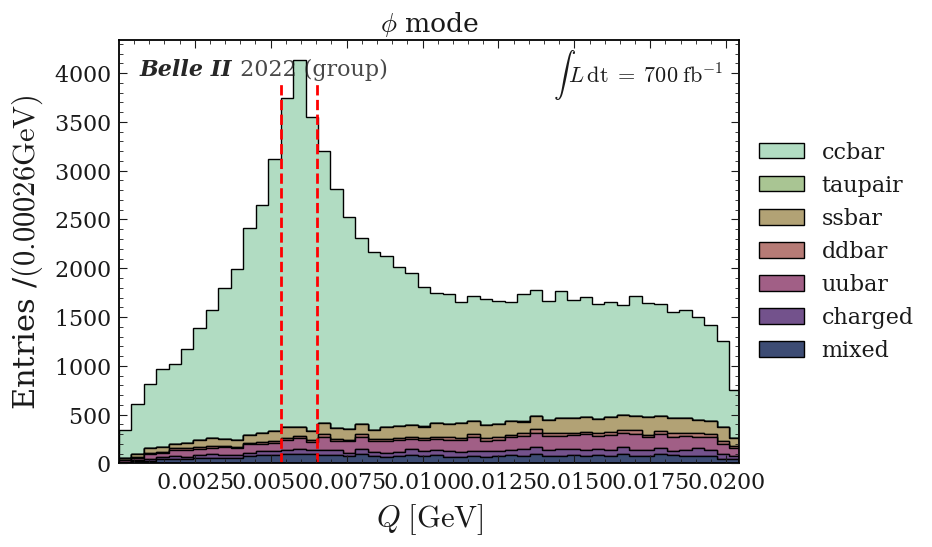

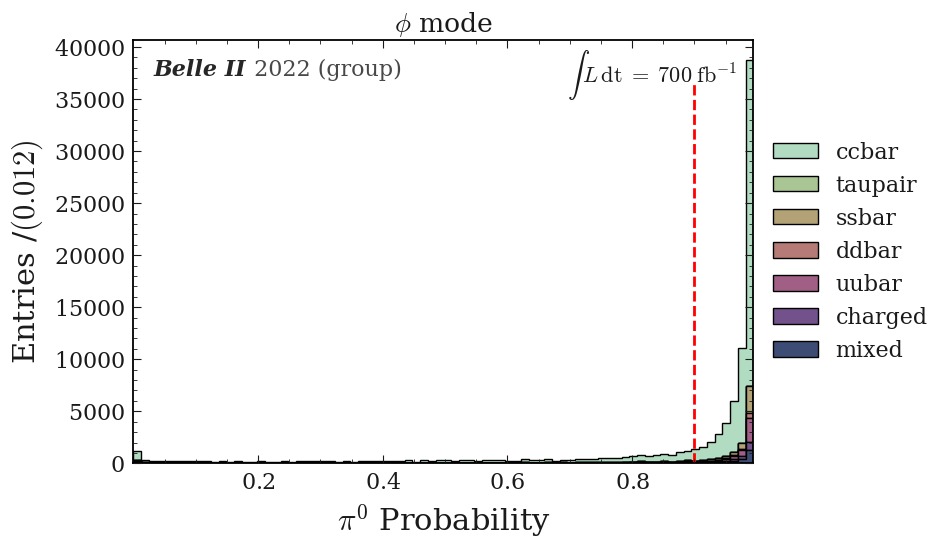

M(\phi)
$M(\phi) \; [\mathrm{GeV}]$


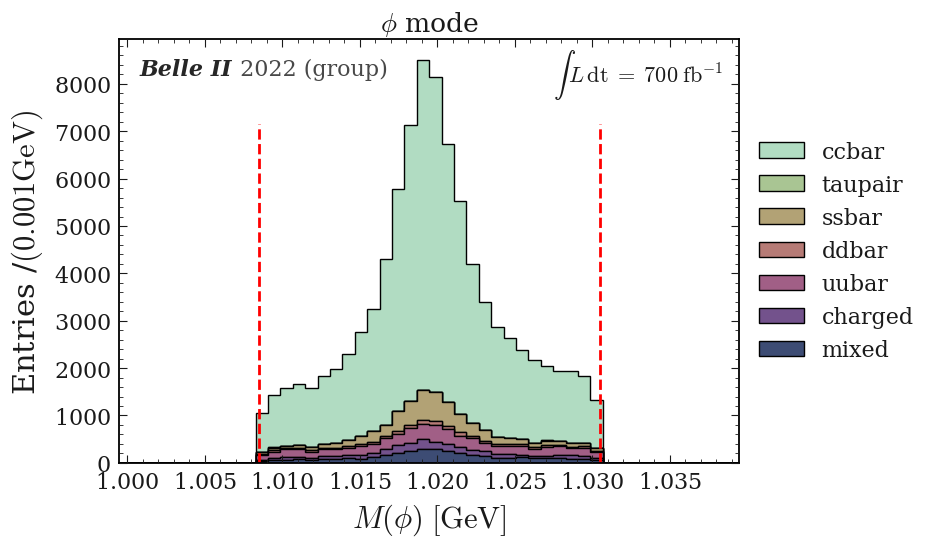

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [15]:
Phi_watching_vars = Watching_vars + ['Phi_InvM']
plot_title = r'$\phi$ mode'
var_unit_phi = read_yaml_to_dict("vars_name_units")
var_unit_phi = var_unit_phi['units']

var_name_phi = read_yaml_to_dict("vars_name_units")
var_name_phi = var_name_phi['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"

pd_phi_cut1 = pd_phi.query("(Phi_InvM < 1.0195+0.011) and (Phi_InvM > 1.0195-0.011)")
draw_stack_no_signal(figname='1_vector_cut', df=pd_phi_cut1,bins=80, vector='phi', draw_variables=Phi_watching_vars,var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi);            

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


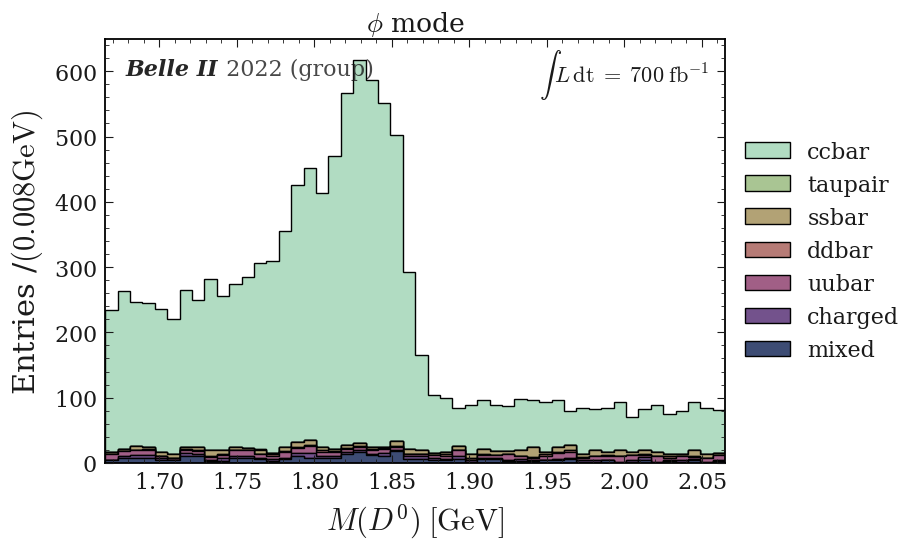

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


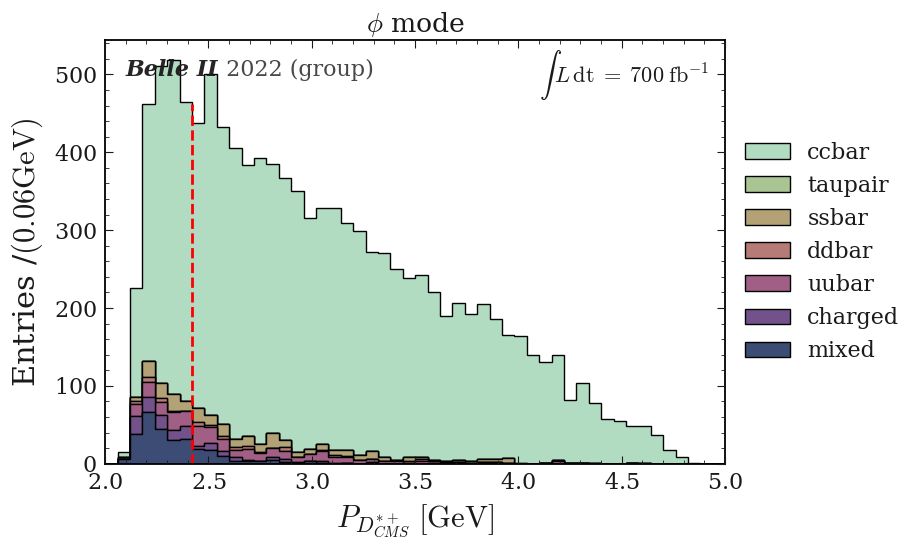

Q
$Q \; [\mathrm{GeV}]$


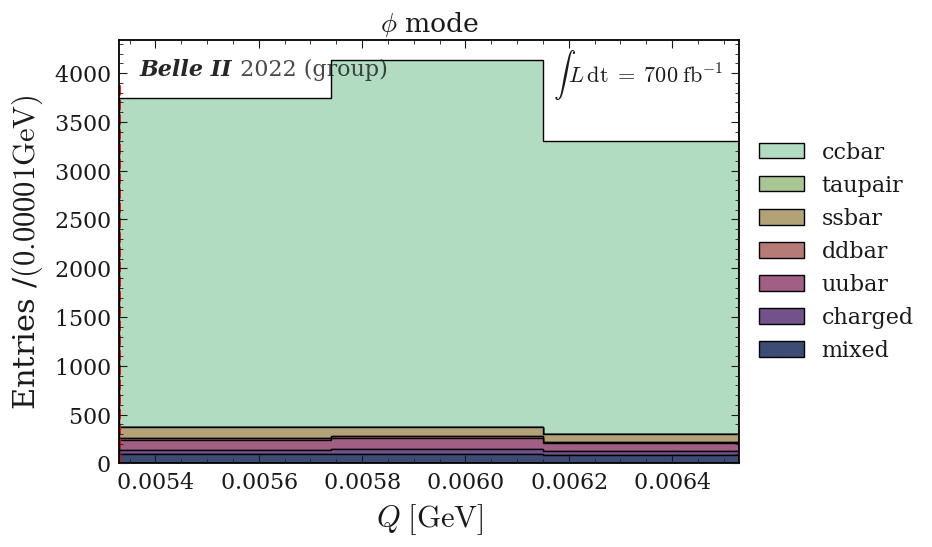

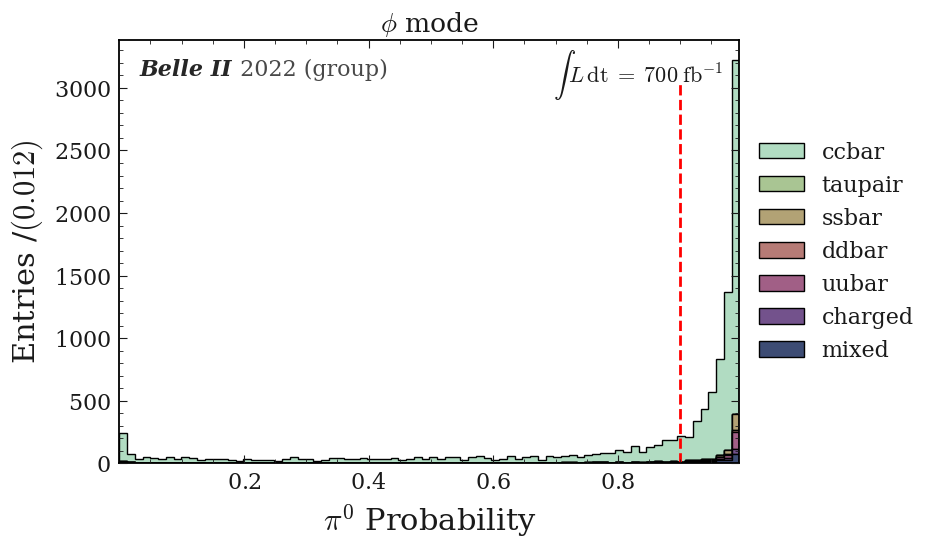

M(\phi)
$M(\phi) \; [\mathrm{GeV}]$


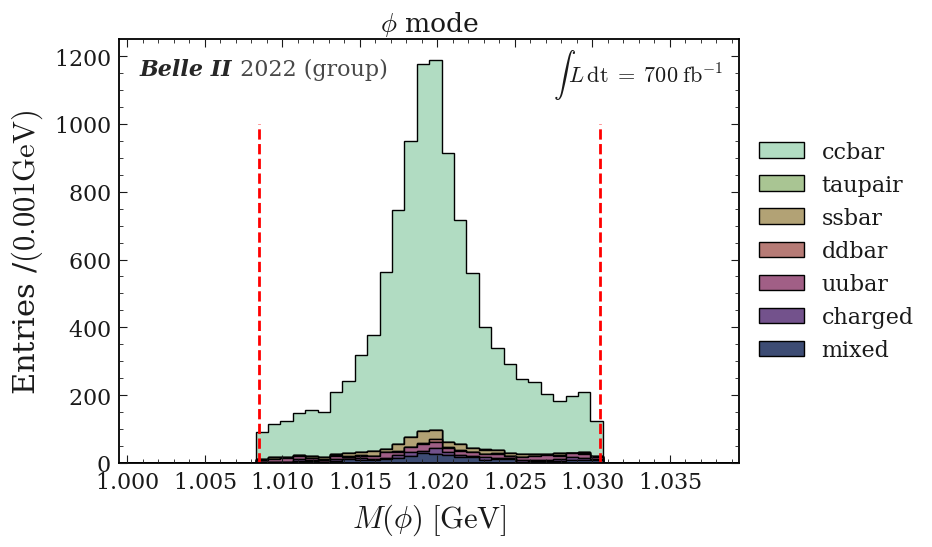

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [16]:
Phi_watching_vars = Watching_vars + ['Phi_InvM']
plot_title = r'$\phi$ mode'
var_unit_phi = read_yaml_to_dict("vars_name_units")
var_unit_phi = var_unit_phi['units']

var_name_phi = read_yaml_to_dict("vars_name_units")
var_name_phi = var_name_phi['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"

pd_phi_cut2 = pd_phi_cut1.query("abs(Dstarp_Q - 0.00593)<0.0006")
draw_stack_no_signal(figname='2_Q_cut', df=pd_phi_cut2,bins=80, vector='phi', draw_variables=Phi_watching_vars,var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi);            

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


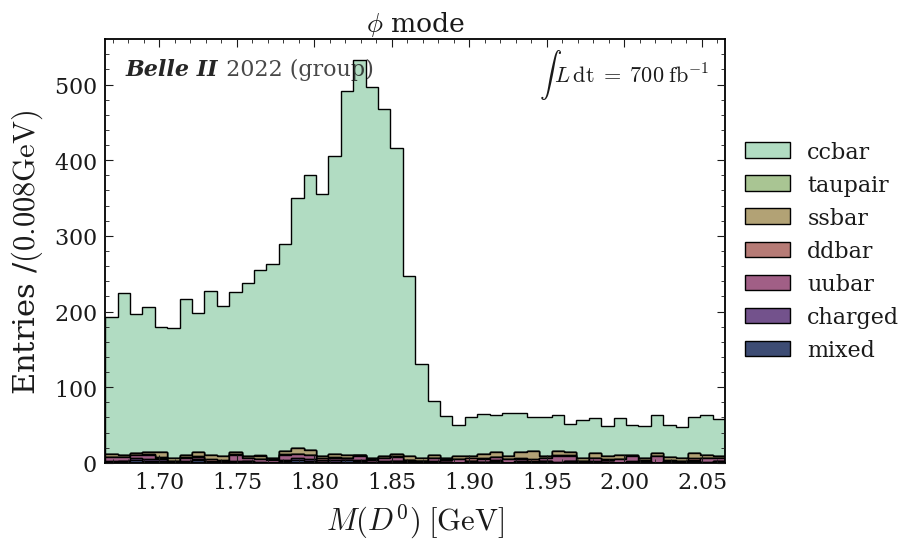

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


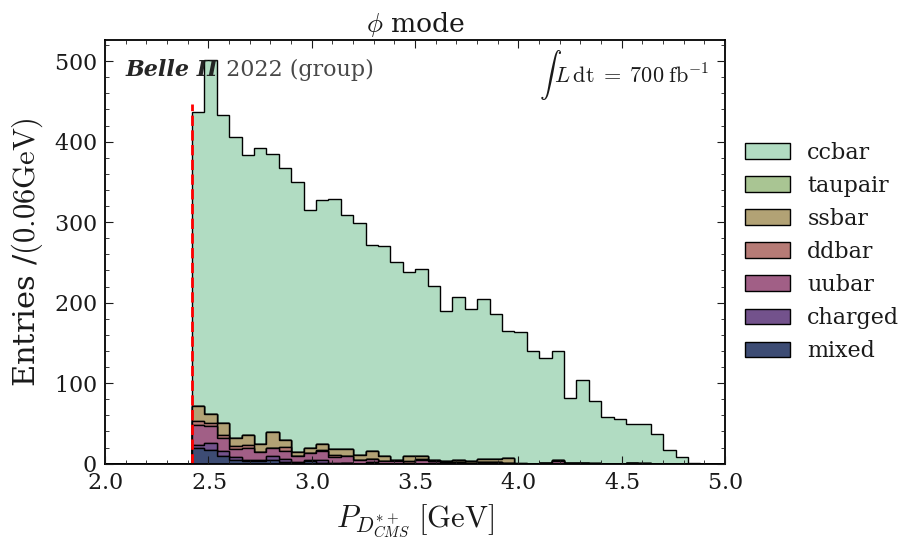

Q
$Q \; [\mathrm{GeV}]$


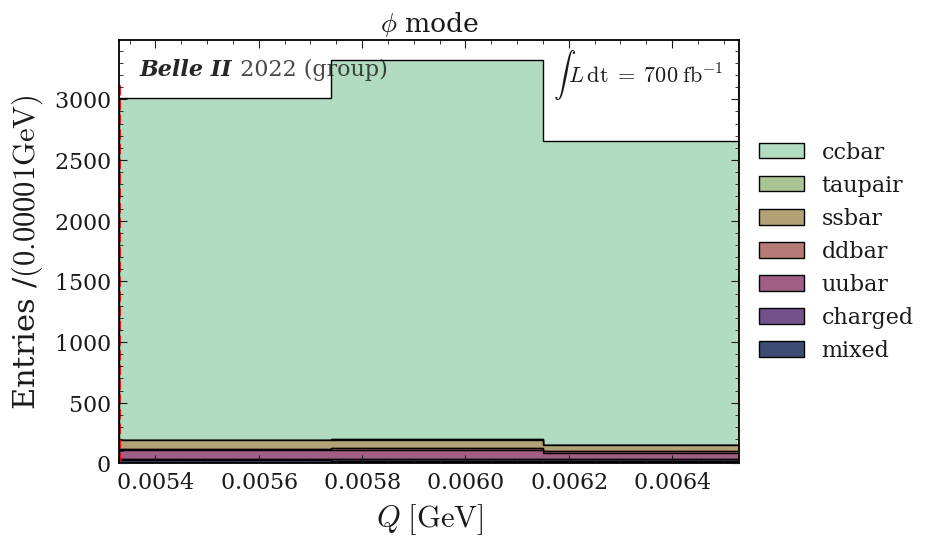

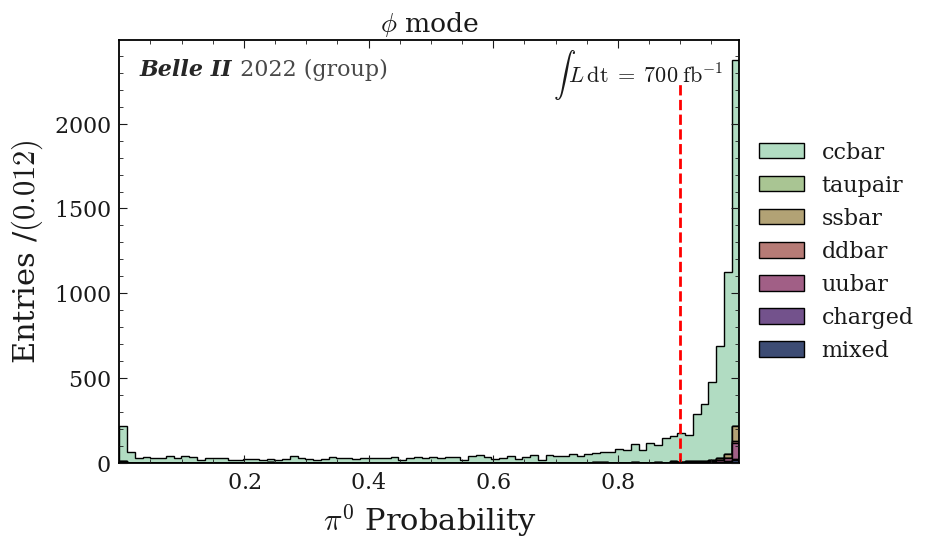

M(\phi)
$M(\phi) \; [\mathrm{GeV}]$


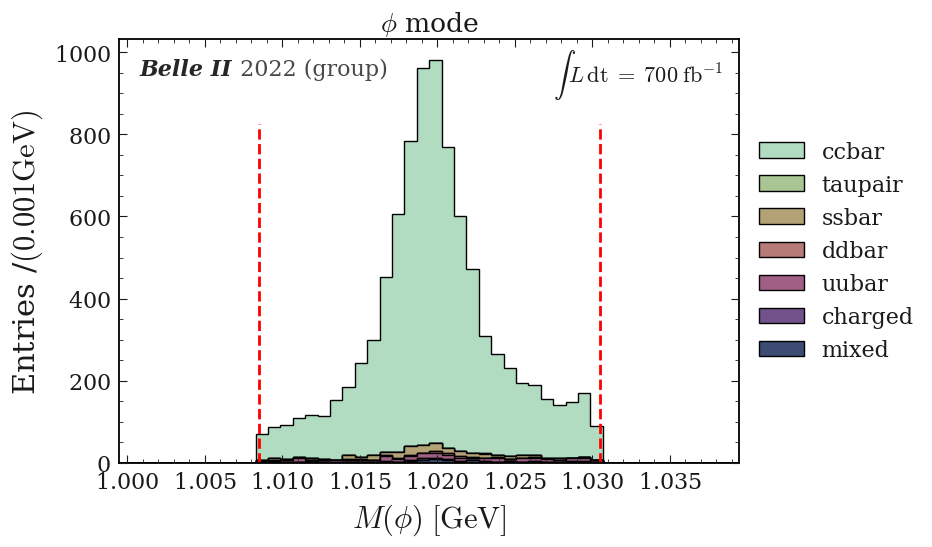

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [17]:
Phi_watching_vars = Watching_vars + ['Phi_InvM']
plot_title = r'$\phi$ mode'
var_unit_phi = read_yaml_to_dict("vars_name_units")
var_unit_phi = var_unit_phi['units']

var_name_phi = read_yaml_to_dict("vars_name_units")
var_name_phi = var_name_phi['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"

pd_phi_cut3 = pd_phi_cut2.query("Dstarp_CMS_p > 2.42")
draw_stack_no_signal(figname='3_Dst_CMS_p_cut', df=pd_phi_cut3,bins=80, vector='phi', draw_variables=Phi_watching_vars,var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi);            

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


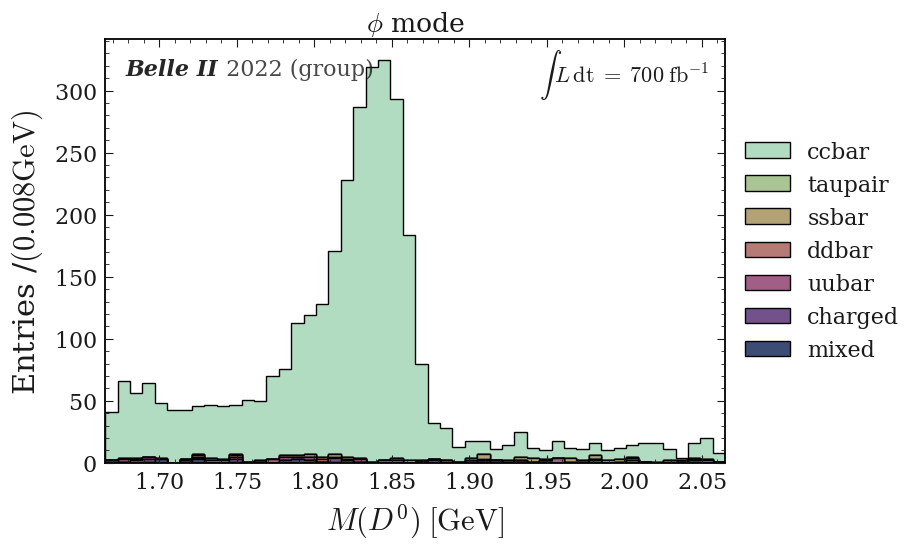

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


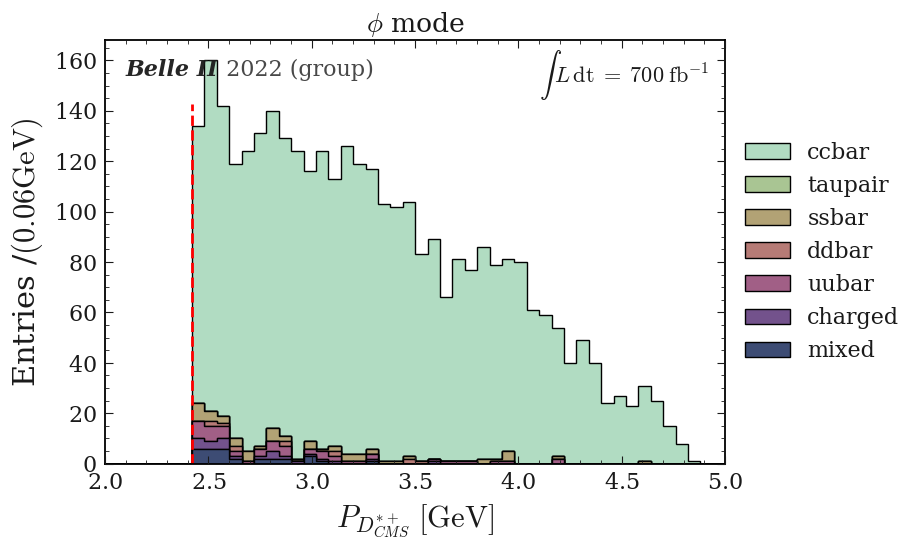

Q
$Q \; [\mathrm{GeV}]$


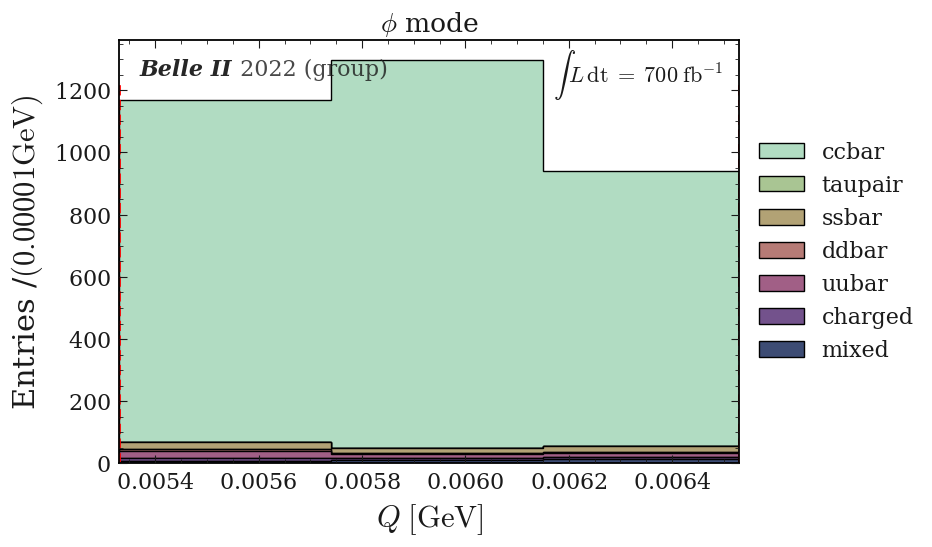

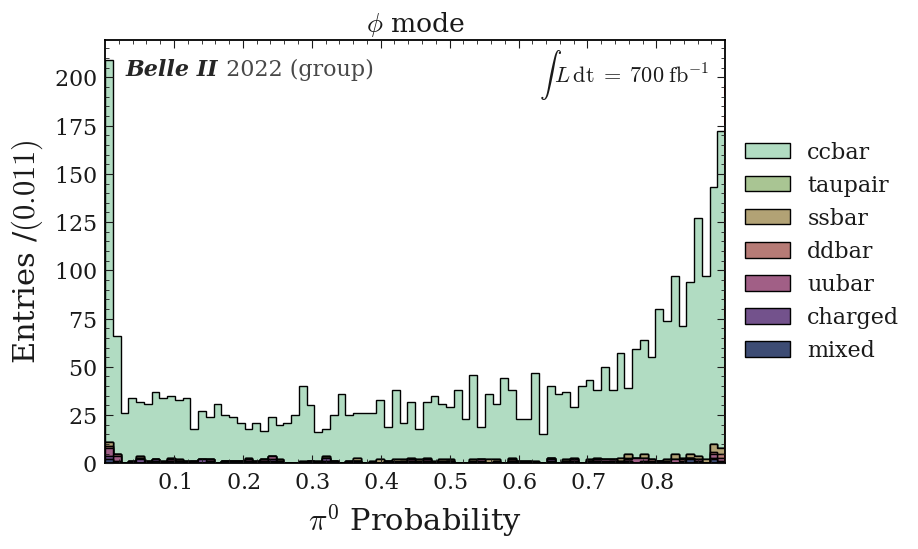

M(\phi)
$M(\phi) \; [\mathrm{GeV}]$


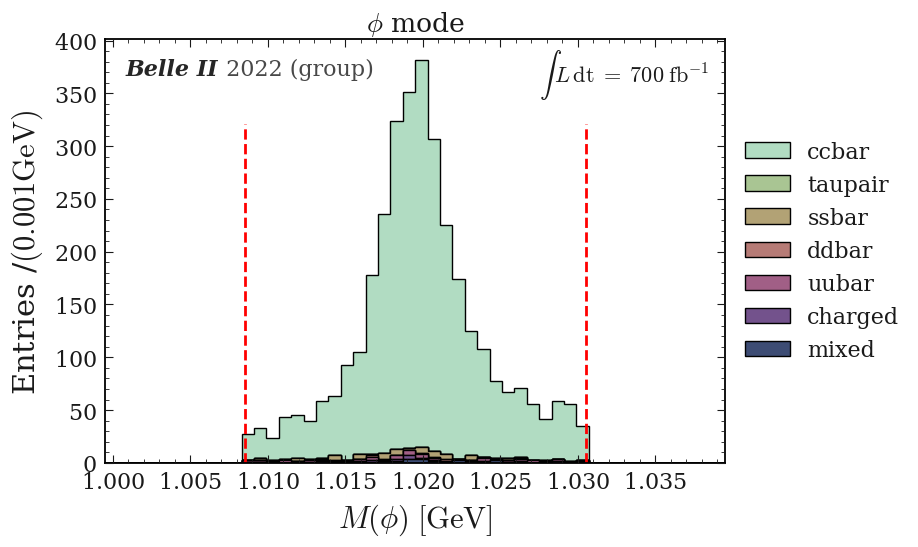

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [38]:
Phi_watching_vars = Watching_vars + ['Phi_InvM']
plot_title = r'$\phi$ mode'
var_unit_phi = read_yaml_to_dict("vars_name_units")
var_unit_phi = var_unit_phi['units']

var_name_phi = read_yaml_to_dict("vars_name_units")
var_name_phi = var_name_phi['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"

pd_phi_cut_pi0veto = pd_phi_cut3.query("Pi0_Prob<0.9")
draw_stack_no_signal(figname='4_pi0_veto_cut', df=pd_phi_cut_pi0veto,bins=80, vector='phi', draw_variables=Phi_watching_vars,var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi);            

## rho

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


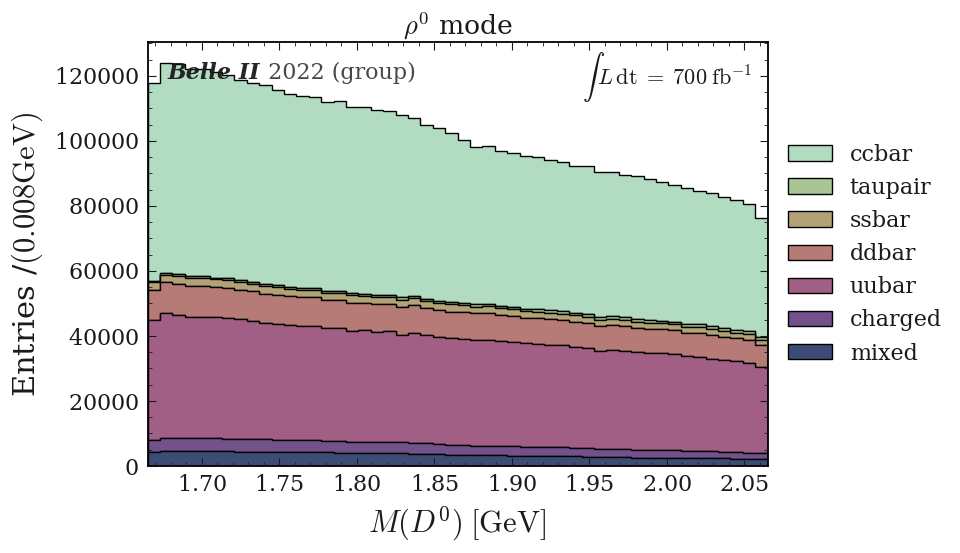

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


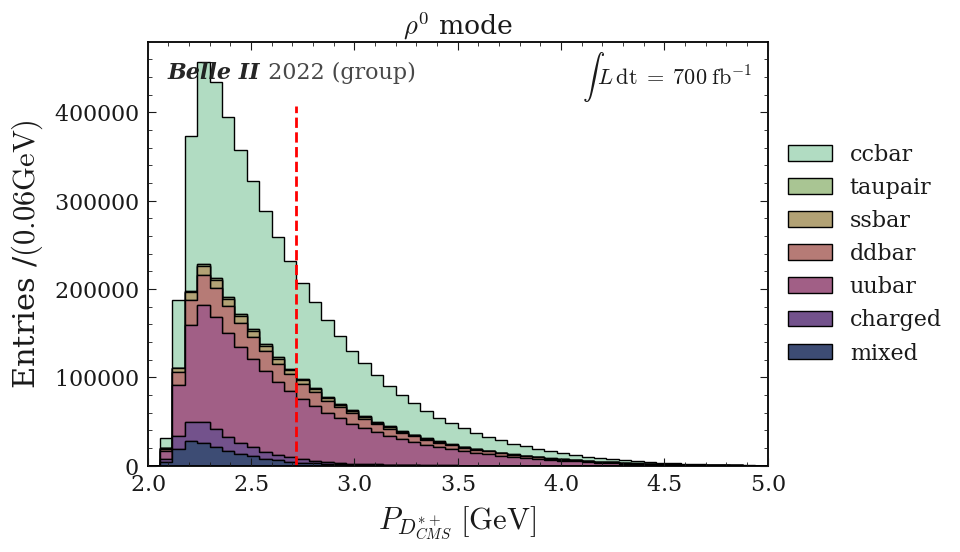

Q
$Q \; [\mathrm{GeV}]$


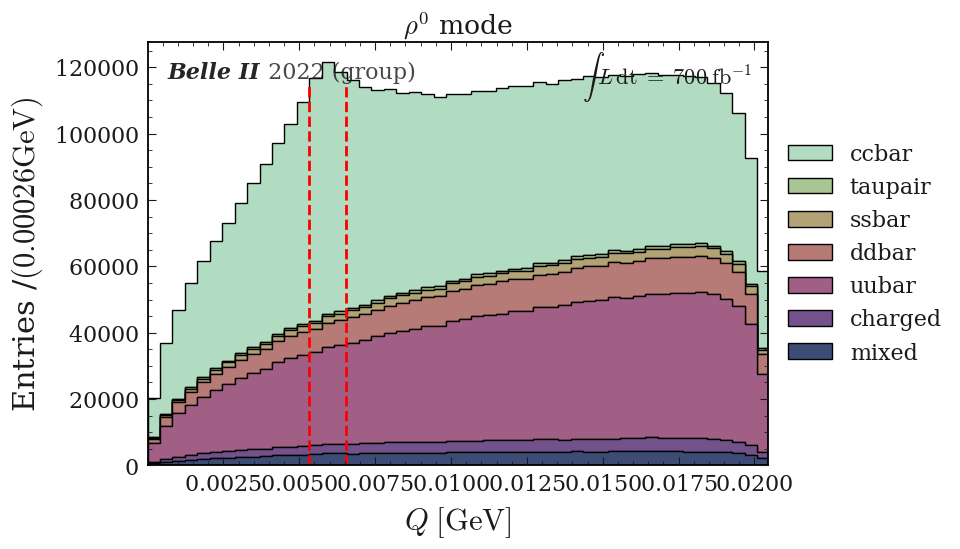

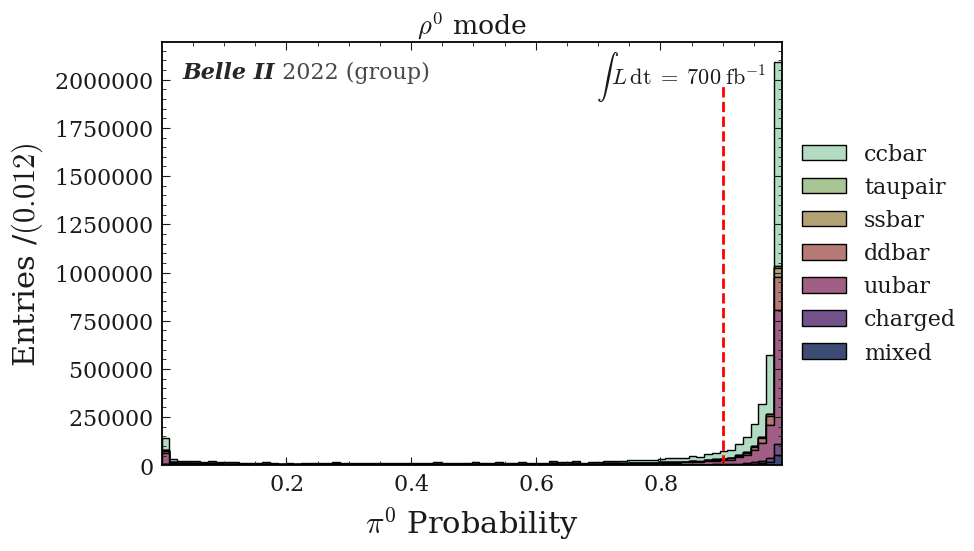

M(rho^0)
$M(\rho^0) \; [\mathrm{GeV}]$


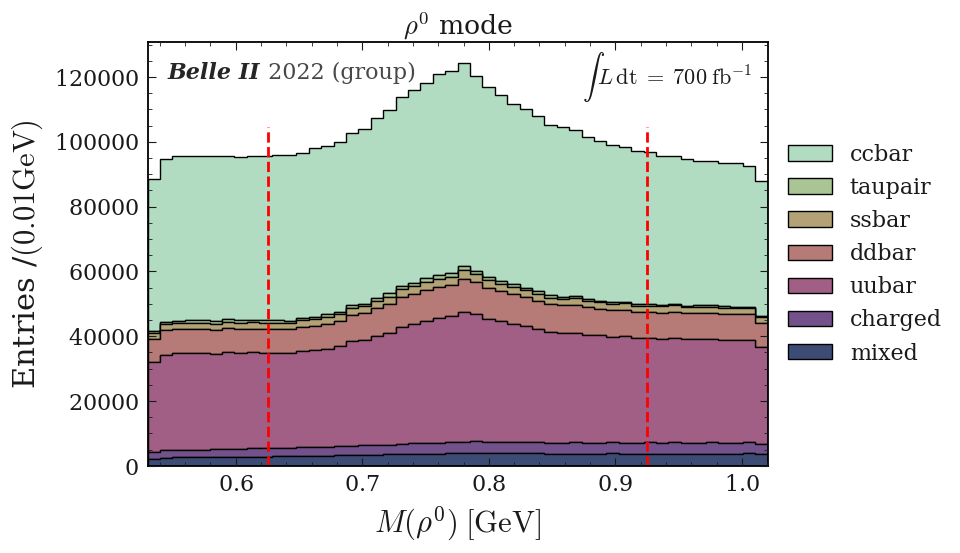

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [19]:
Rho_watching_vars = Watching_vars + ['Rho_InvM']

plot_title = r'$\rho^0$ mode'
var_unit = read_yaml_to_dict("vars_name_units")
var_unit = var_unit['units']

var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"

pd_rho = pd_rho.query("(Rho_InvM < 0.77526+0.245) and (Rho_InvM > 0.77526-0.245)")
draw_stack_no_signal(figname='Before_0_No_cut',df=pd_rho,bins=80, vector='rho', draw_variables=Rho_watching_vars,var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


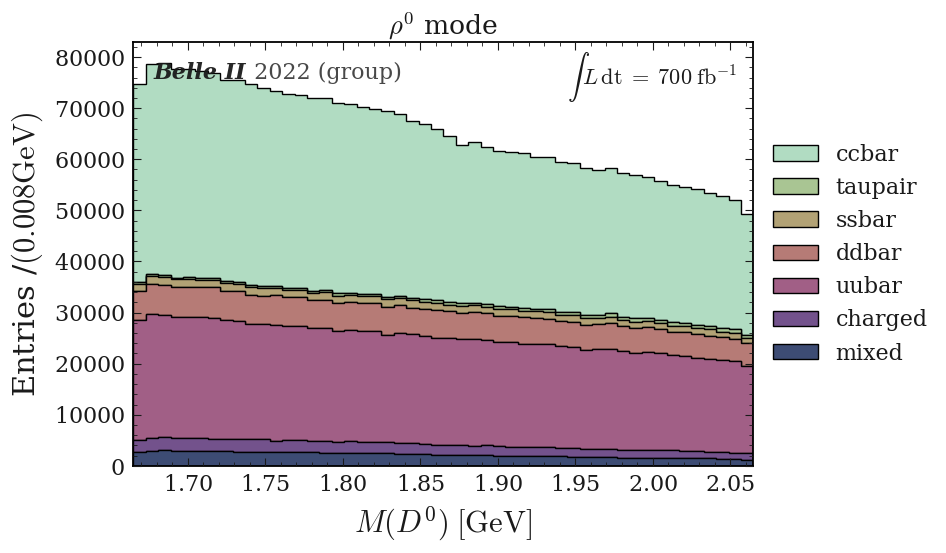

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


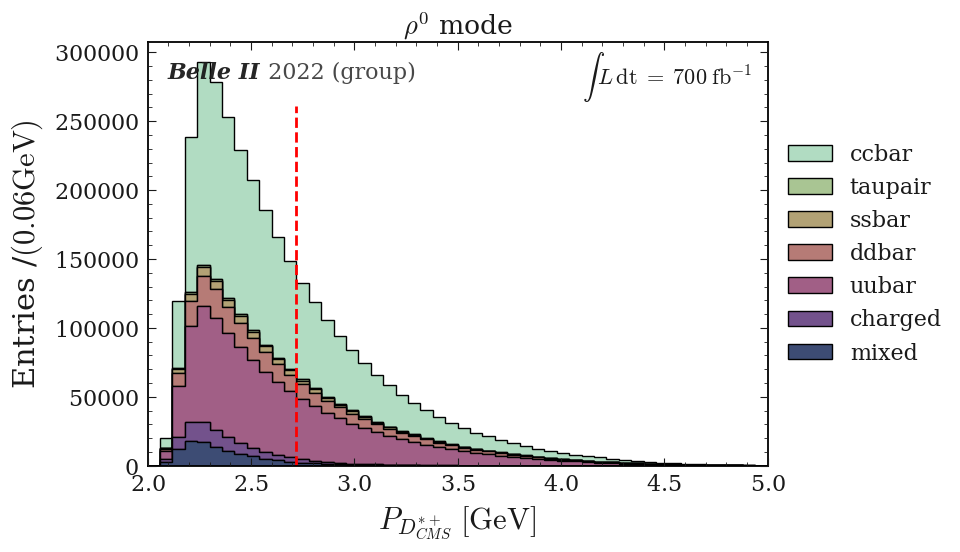

Q
$Q \; [\mathrm{GeV}]$


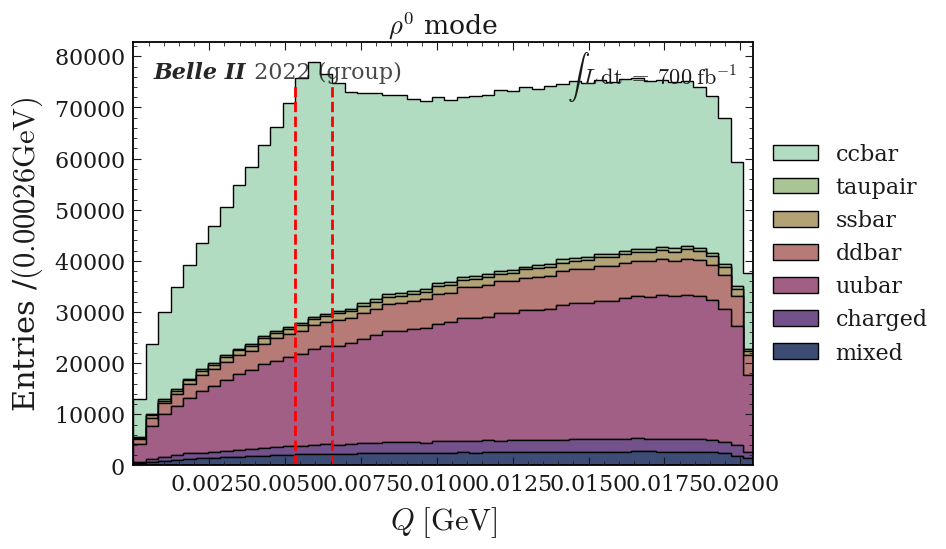

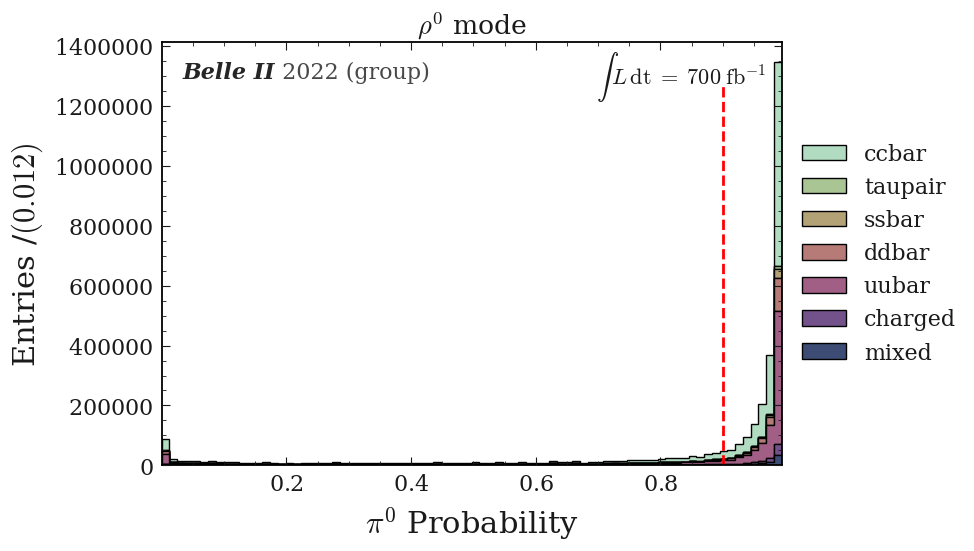

M(rho^0)
$M(\rho^0) \; [\mathrm{GeV}]$


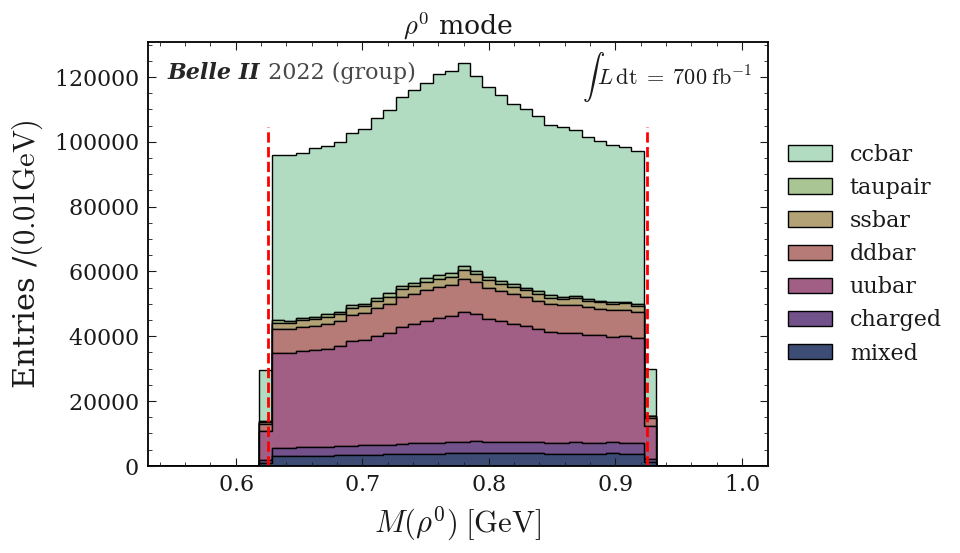

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [20]:
Rho_watching_vars = Watching_vars + ['Rho_InvM']

var_unit = read_yaml_to_dict("vars_name_units")
var_unit = var_unit['units']
var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']

pd_rho_cut1 = pd_rho.query("abs(Rho_InvM - 0.77526)<0.150")
draw_stack_no_signal(figname='1_vector_cut',df=pd_rho_cut1,bins=80, vector='rho', draw_variables=Rho_watching_vars,var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


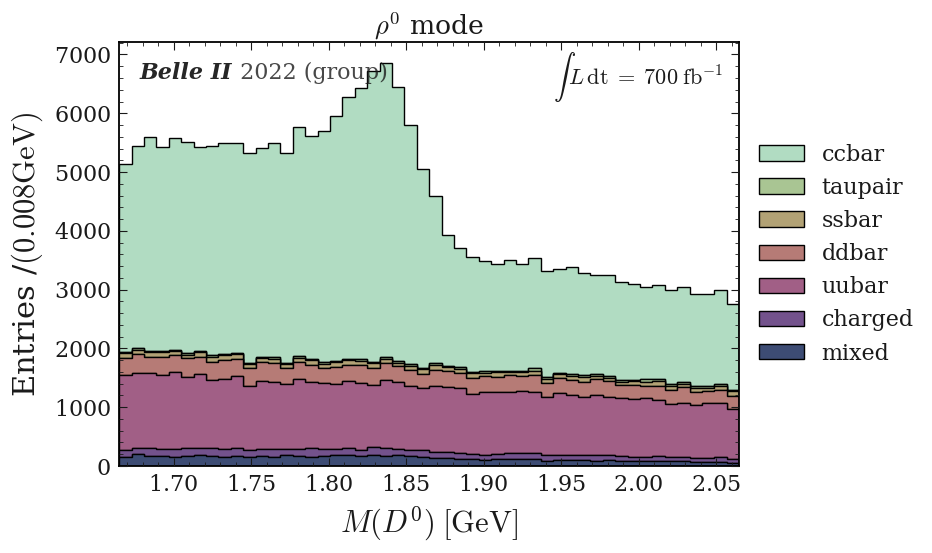

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


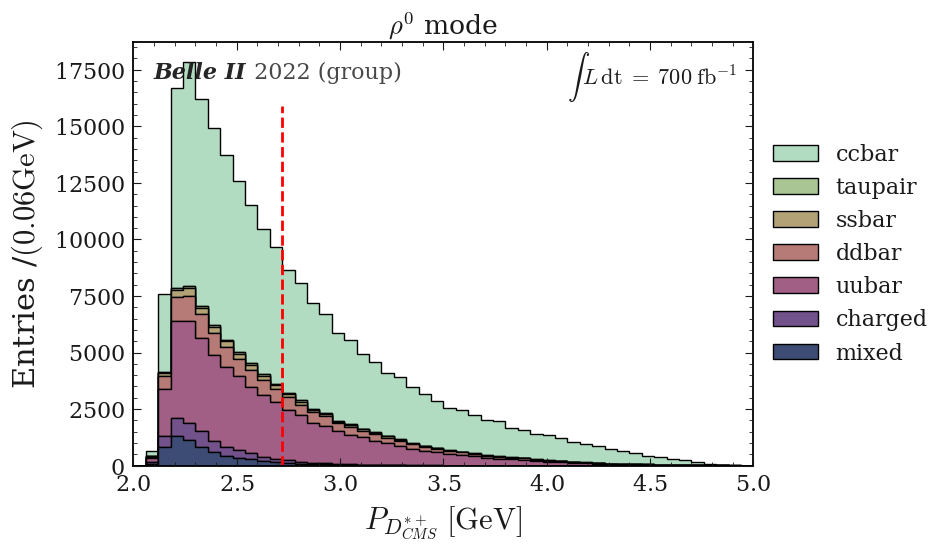

Q
$Q \; [\mathrm{GeV}]$


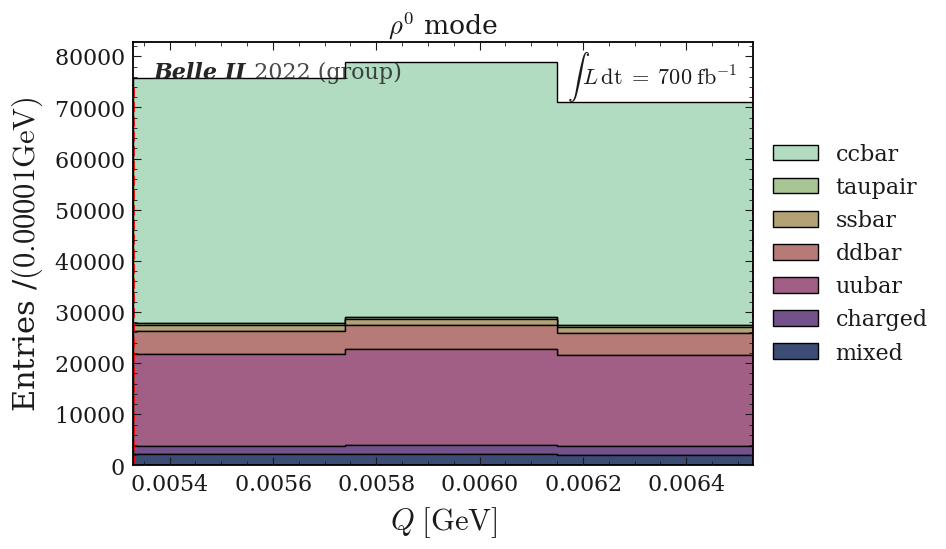

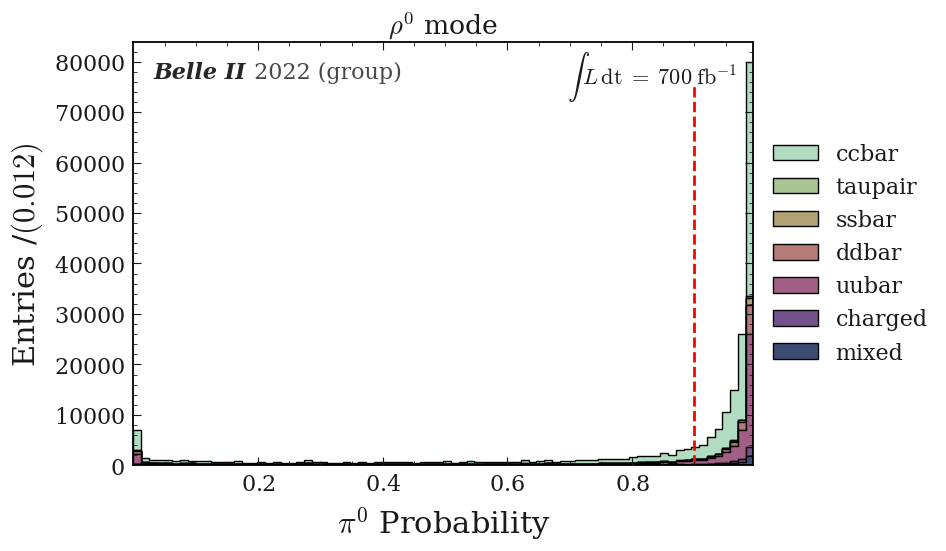

M(rho^0)
$M(\rho^0) \; [\mathrm{GeV}]$


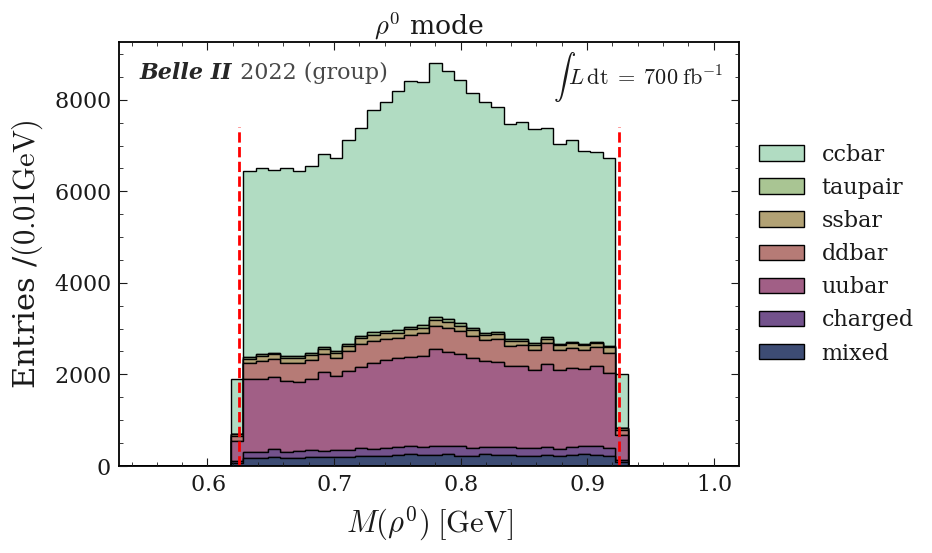

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [21]:
Rho_watching_vars = Watching_vars + ['Rho_InvM']

var_unit = read_yaml_to_dict("vars_name_units")
var_unit = var_unit['units']
var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']

pd_rho_cut2 = pd_rho_cut1.query("abs(Dstarp_Q - 0.00593)<0.0006")
draw_stack_no_signal(figname='2_Q_cut',df=pd_rho_cut2,bins=80, vector='rho', draw_variables=Rho_watching_vars,var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


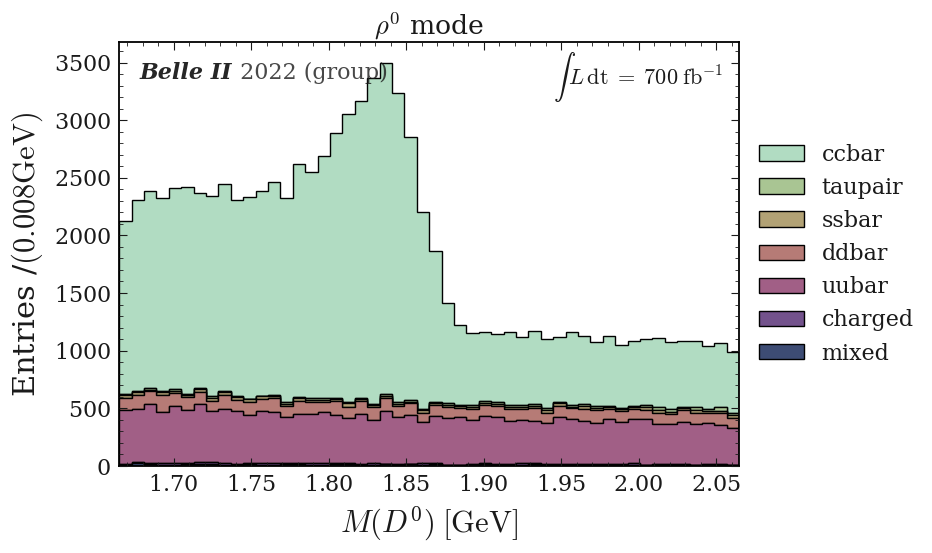

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


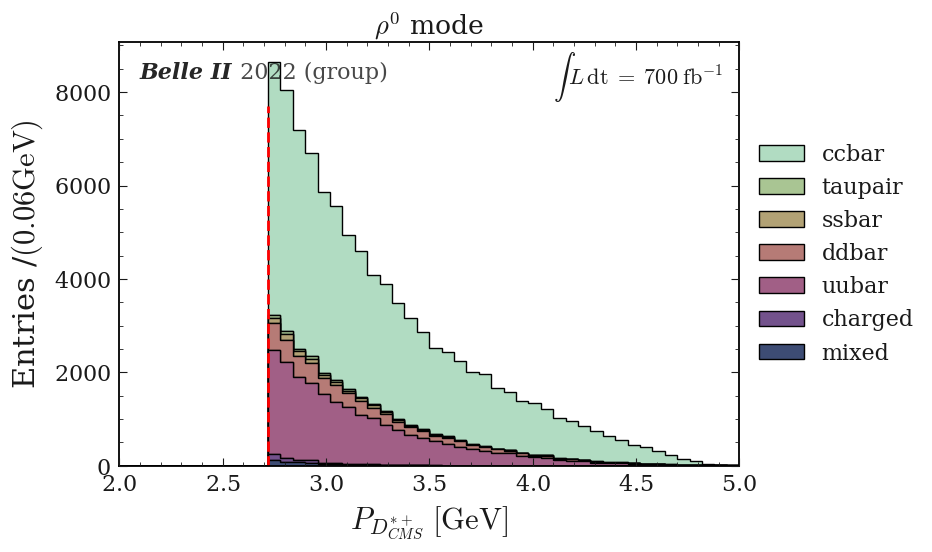

Q
$Q \; [\mathrm{GeV}]$


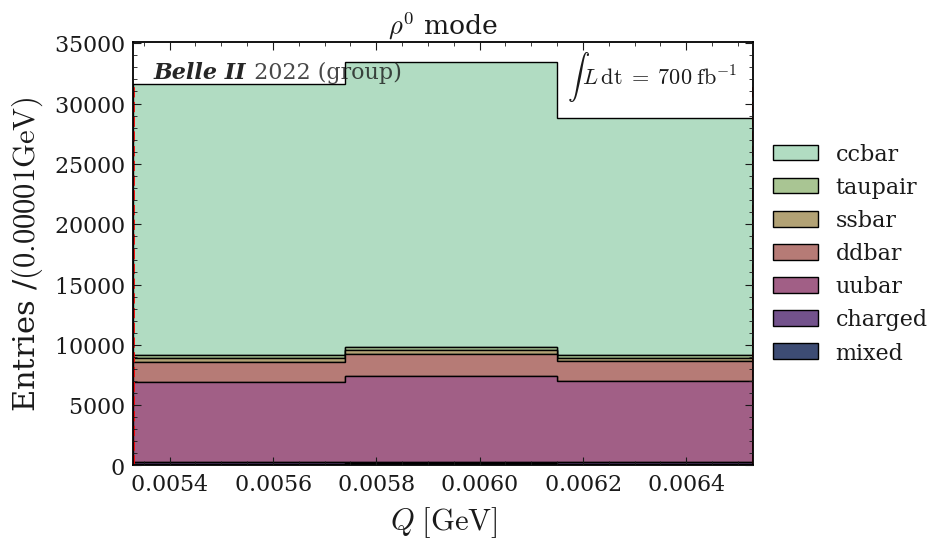

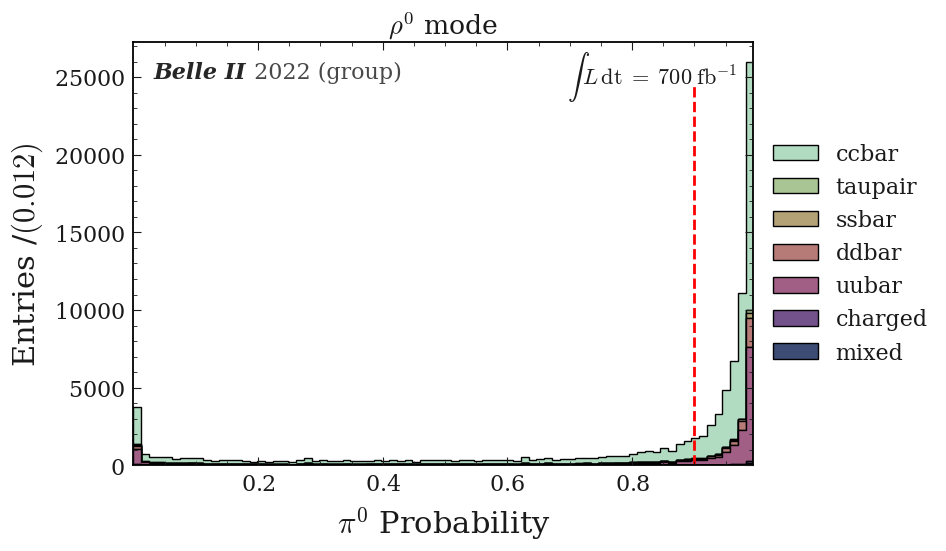

M(rho^0)
$M(\rho^0) \; [\mathrm{GeV}]$


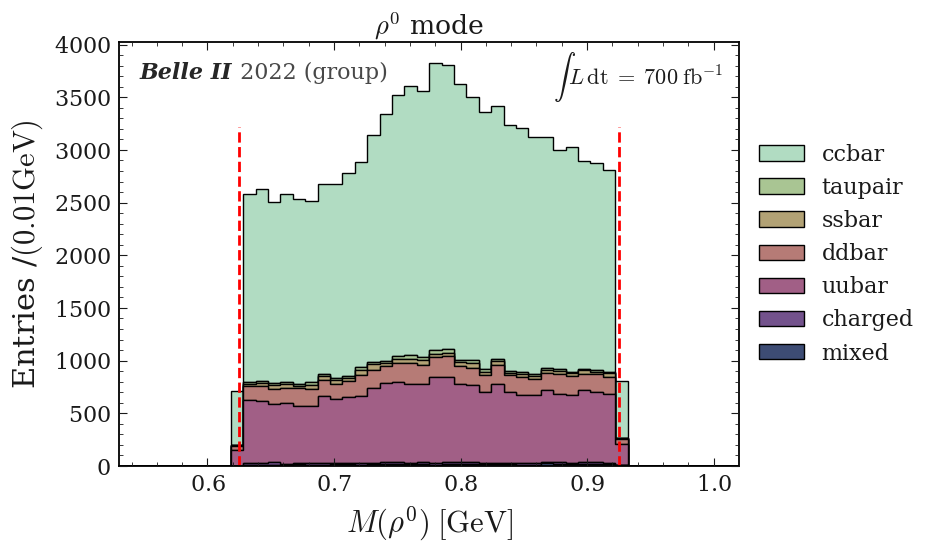

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [22]:
Rho_watching_vars = Watching_vars + ['Rho_InvM']

var_unit = read_yaml_to_dict("vars_name_units")
var_unit = var_unit['units']
var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']

pd_rho_cut3 = pd_rho_cut2.query("Dstarp_CMS_p > 2.72")
draw_stack_no_signal(figname='3_CMS_p_cut',df=pd_rho_cut3,bins=80, vector='rho', draw_variables=Rho_watching_vars,var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


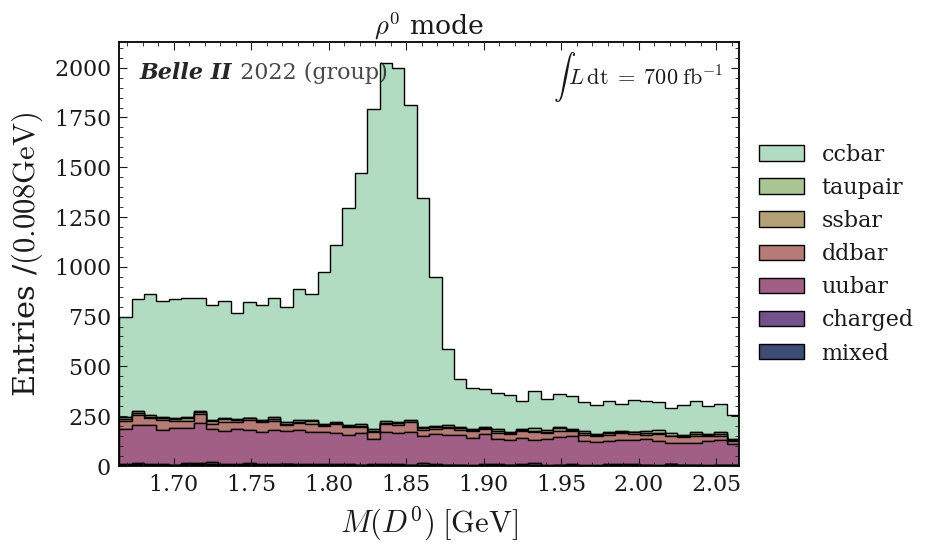

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


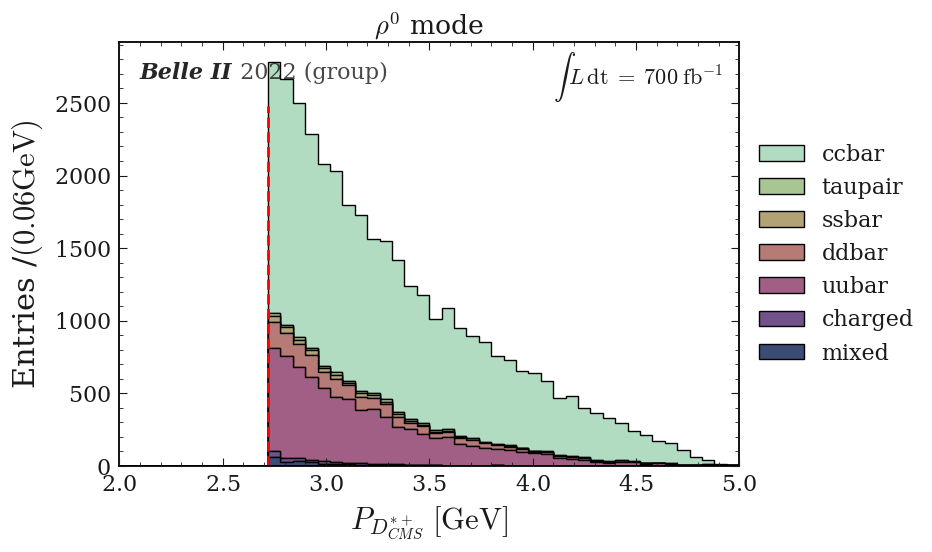

Q
$Q \; [\mathrm{GeV}]$


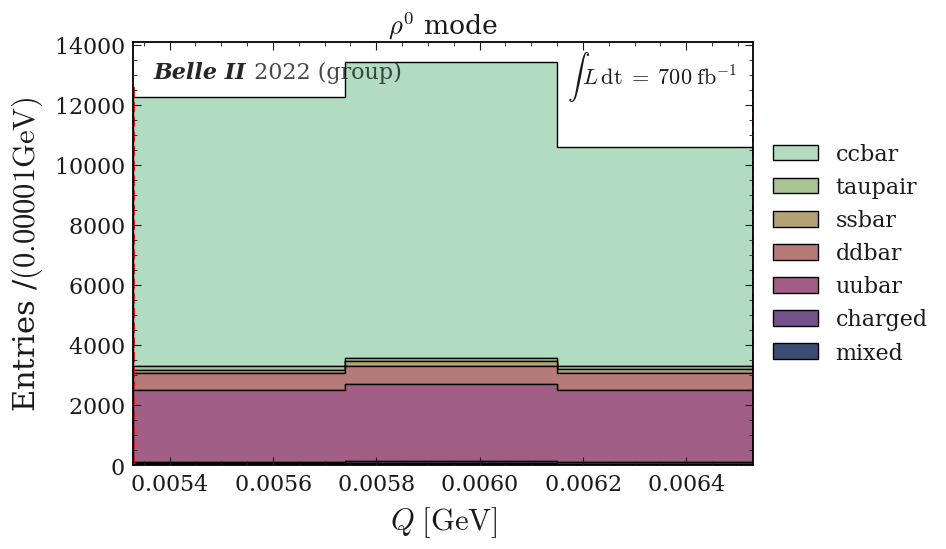

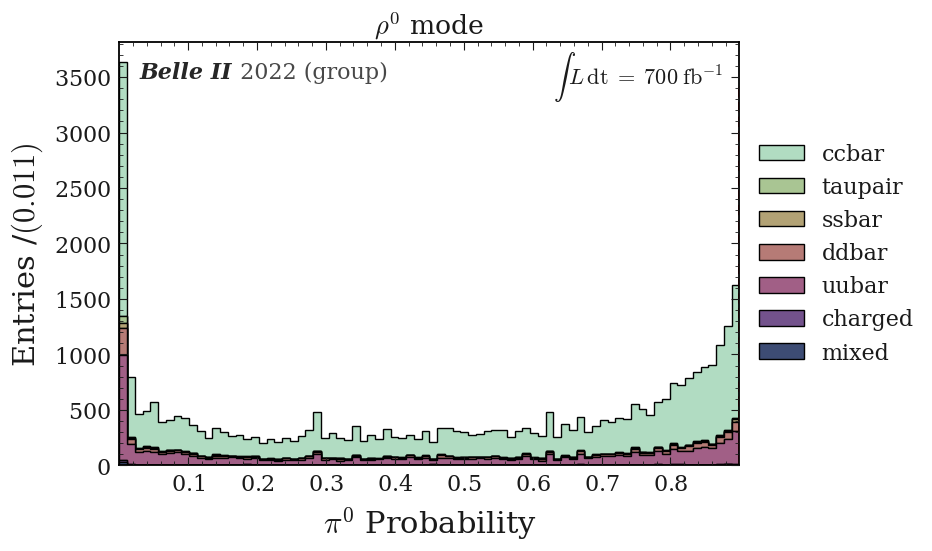

M(rho^0)
$M(\rho^0) \; [\mathrm{GeV}]$


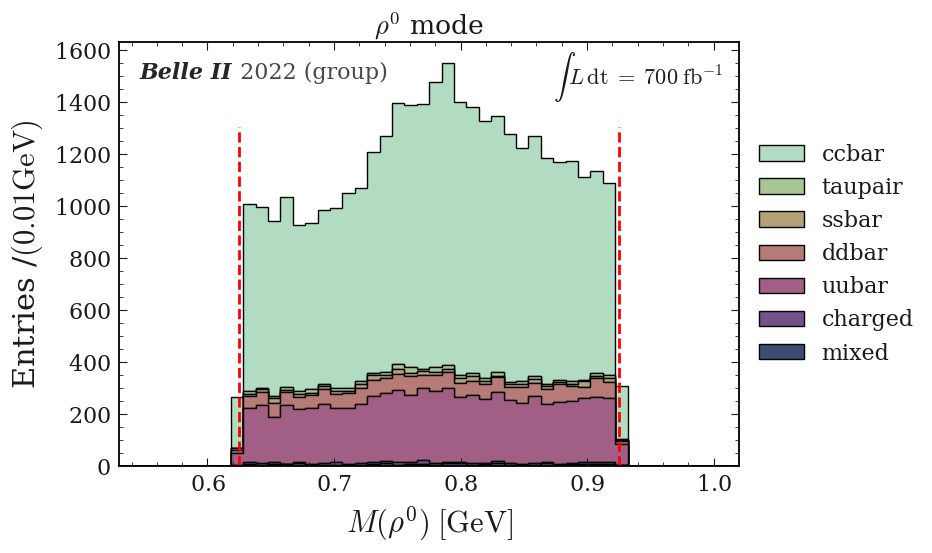

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [23]:
Rho_watching_vars = Watching_vars + ['Rho_InvM']

var_unit = read_yaml_to_dict("vars_name_units")
var_unit = var_unit['units']
var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']

pd_rho_cut_pi0veto = pd_rho_cut3.query("Pi0_Prob<0.9")
draw_stack_no_signal(figname='Final_4_pi0_veto_cut',df=pd_rho_cut_pi0veto,bins=80, vector='rho', draw_variables=Rho_watching_vars,var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            

In [24]:
pd_rho_cut_pi0veto.describe()

,D0_M,Dstarp_Q,D0_cosHel_0,Dstarp_CMS_p,gamma_E,gamma_clusterSecondMoment,__ncandidates__,__experiment__,__run__,__event__,Dstarp_isSignal,D0_isSignal,Pi0_Prob,Eta_Prob,Rho_InvM
count,36296.000000,36296.000000,36296.000000,36296.000000,36296.000000,36296.000000,36296.000000,36296.0,36296.0,3.629600e+04,33518.0,33842.000000,3.629600e+04,36280.000000,36296.000000
mean,1.825293,0.005923,-0.001419,3.332002,1.595384,0.982294,1.537001,1003.0,0.0,1.377066e+08,0.0,0.000059,4.802652e-01,0.553885,0.780877
std,0.095027,0.000335,0.683680,0.488227,0.930330,0.195184,1.009178,0.0,0.0,8.200556e+07,0.0,0.007687,3.194263e-01,0.311937,0.082203
min,1.665003,0.005330,-0.999986,2.720005,0.298135,0.039062,1.000000,1003.0,0.0,4.280000e+02,0.0,0.000000,4.094405e-07,0.000049,0.625264
25%,1.753661,0.005643,-0.683956,2.928890,0.704710,0.859375,1.000000,1003.0,0.0,6.540302e+07,0.0,0.000000,1.527533e-01,0.277299,0.715985
50%,1.825460,0.005920,-0.003466,3.211049,1.574091,0.976562,1.000000,1003.0,0.0,1.378872e+08,0.0,0.000000,5.285198e-01,0.558884,0.783941
75%,1.866294,0.006202,0.682690,3.639264,2.324294,1.093750,2.000000,1003.0,0.0,2.069303e+08,0.0,0.000000,7.956067e-01,0.860081,0.848477
max,2.064874,0.006530,0.999983,6.481069,6.019554,1.484375,19.000000,1003.0,0.0,3.209958e+08,0.0,1.000000,8.999141e-01,0.999809,0.925236


## antiKstar

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


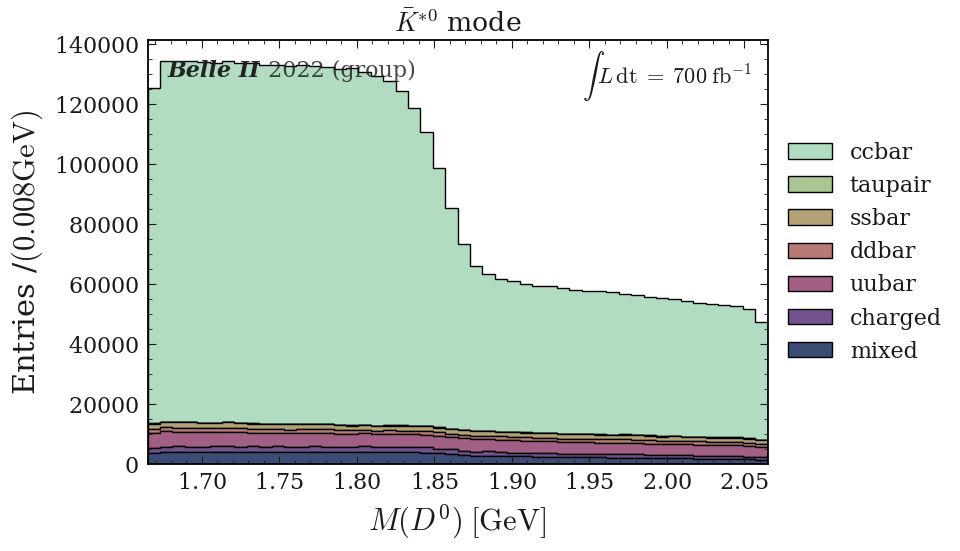

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


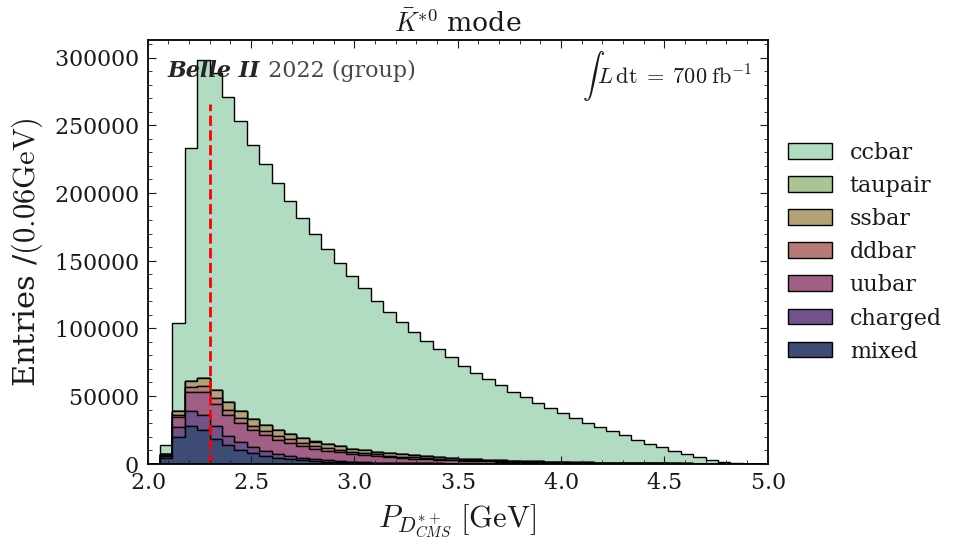

Q
$Q \; [\mathrm{GeV}]$


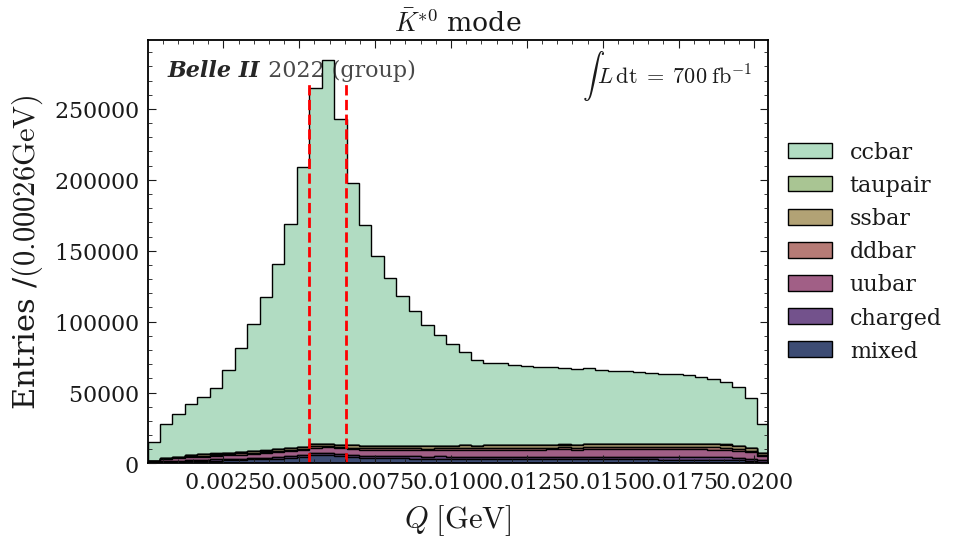

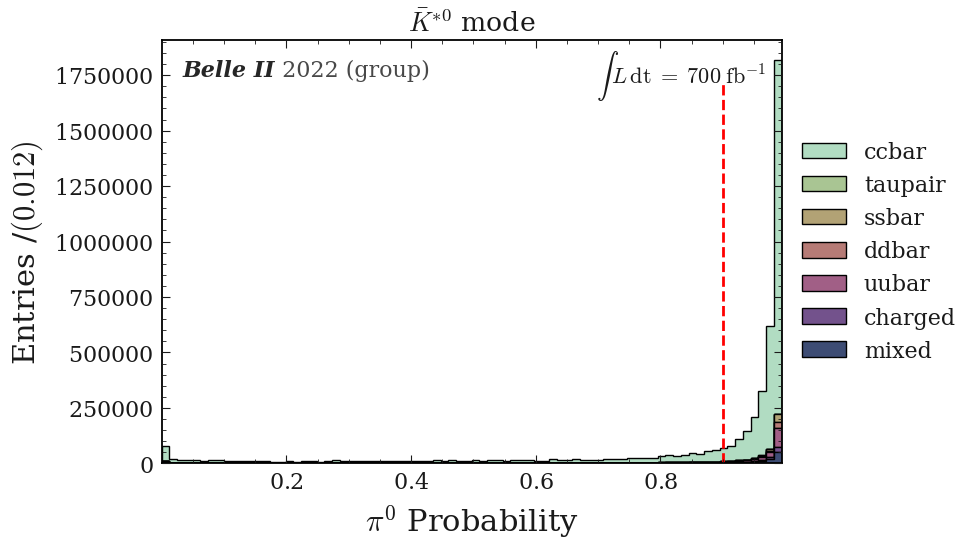

M(bar{K}^{*0})
$M(\bar{K}^{*0}) \; [\mathrm{GeV}]$


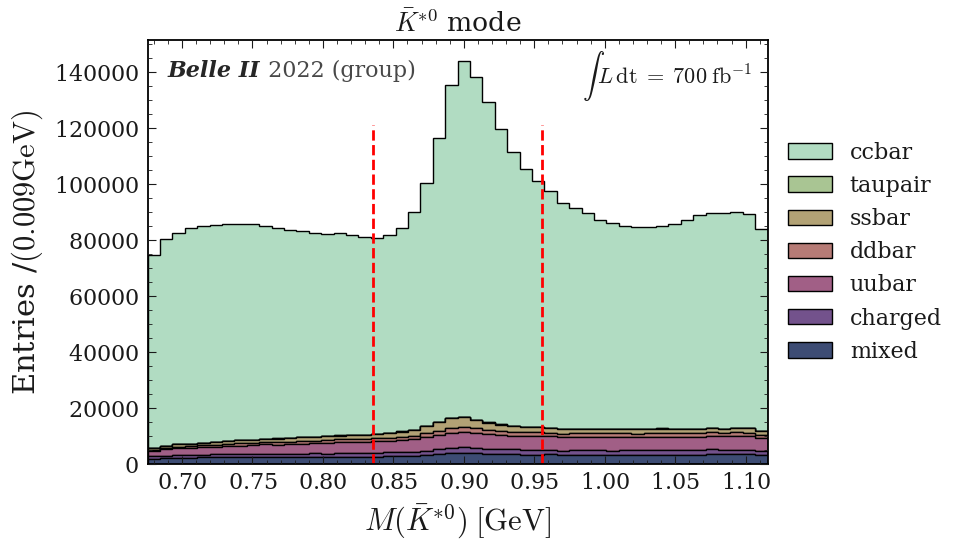

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [25]:
AntiKstar_watching_vars = Watching_vars + ['antiKstar_InvM']

plot_title = r'$\bar{K}^{*0}$ mode'
var_unit = read_yaml_to_dict("vars_name_units")

var_unit = var_unit['units']

var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']
# var_name['antiKstar_InvM'] = r"M(\bar{K^{*0})"
# print(var_name['antiKstar_InvM'])

total_lumi="$700\; \mathrm{fb}^{-1}$"
# draw_stack_no_signal(df=pd_antiKstar[pd_antiKstar['Pi0_Prob']<0.9 ],bins=80, vector='antiKstar', var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi)            

pd_antiKstar = pd_antiKstar.query("(antiKstar_InvM < 0.89555+0.220) and (antiKstar_InvM > 0.89555-0.220)")
draw_stack_no_signal(figname="0_No_cut",df=pd_antiKstar,bins=80, vector='antiKstar', draw_variables=AntiKstar_watching_vars,var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            


(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


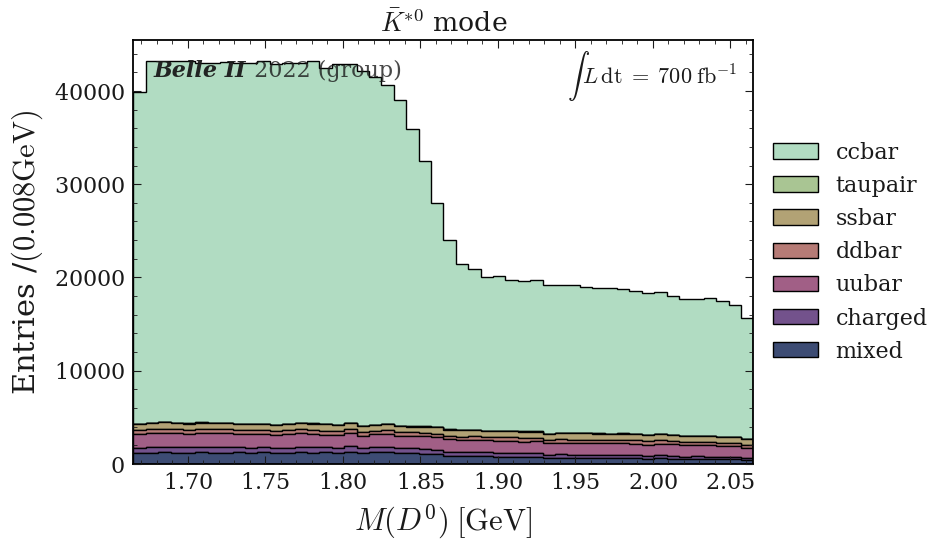

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


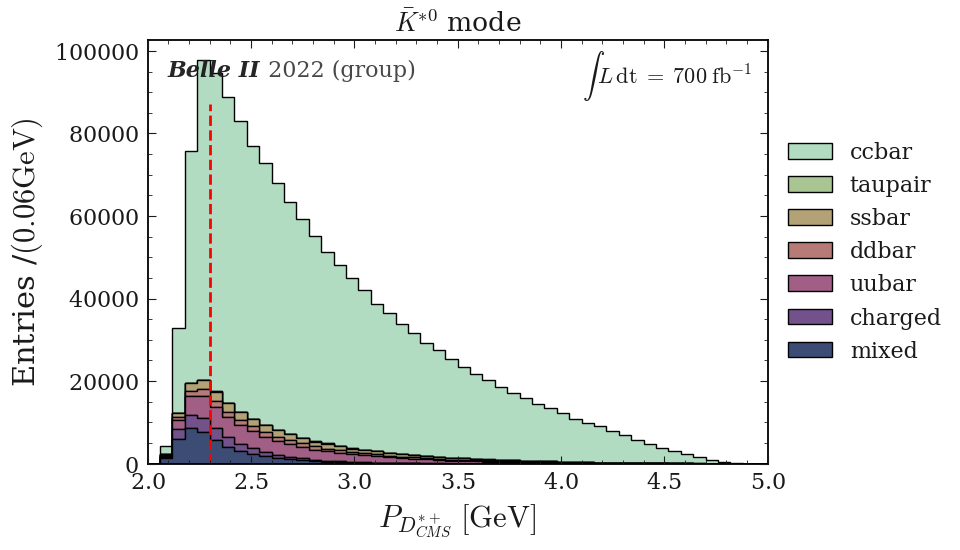

Q
$Q \; [\mathrm{GeV}]$


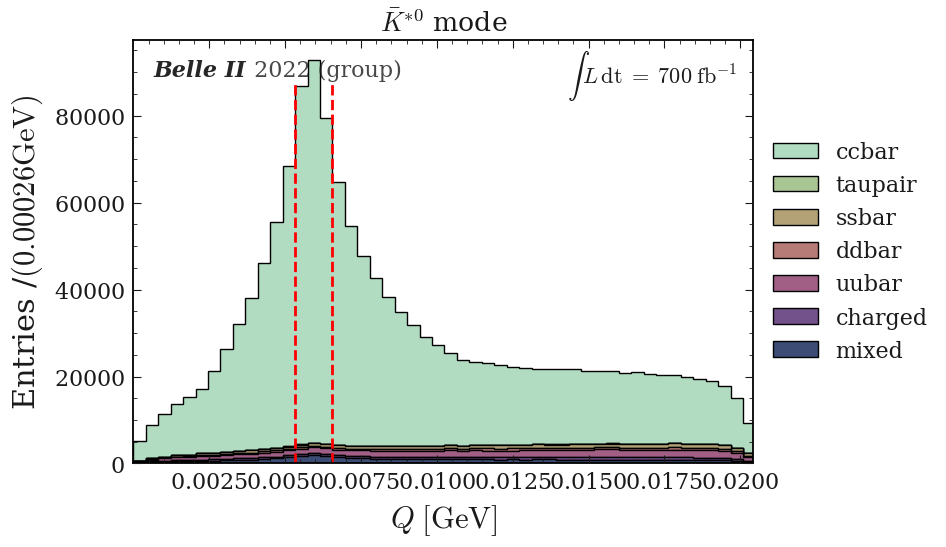

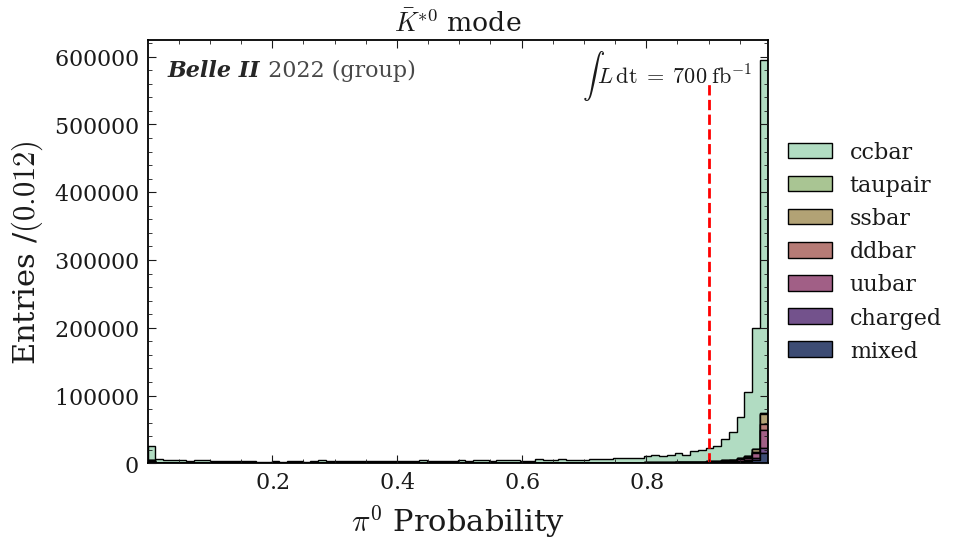

M(bar{K}^{*0})
$M(\bar{K}^{*0}) \; [\mathrm{GeV}]$


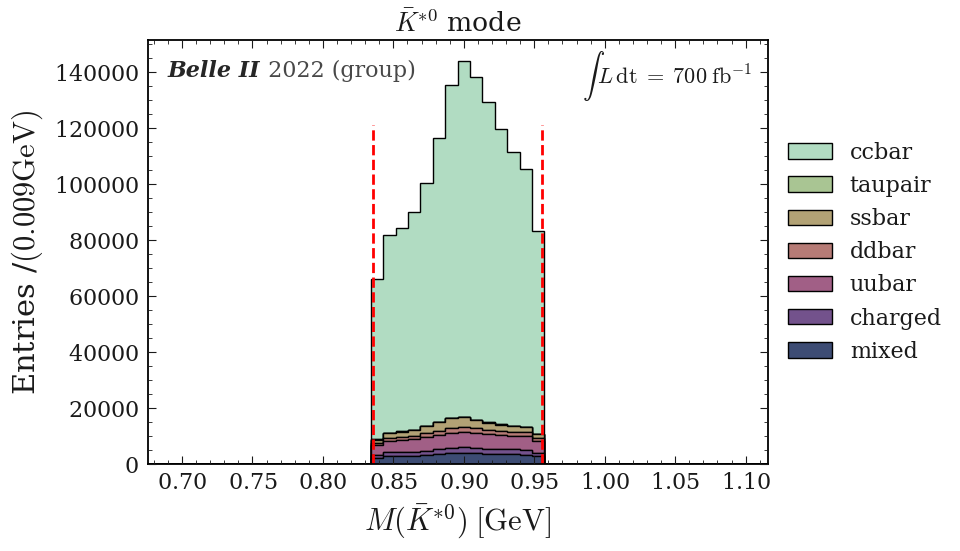

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [26]:
AntiKstar_watching_vars = Watching_vars + ['antiKstar_InvM']

plot_title = r'$\bar{K}^{*0}$ mode'
var_unit = read_yaml_to_dict("vars_name_units")

var_unit = var_unit['units']

var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']
# var_name['antiKstar_InvM'] = r"M(\bar{K^{*0})"
# print(var_name['antiKstar_InvM'])

total_lumi="$700\; \mathrm{fb}^{-1}$"
# draw_stack_no_signal(df=pd_antiKstar[pd_antiKstar['Pi0_Prob']<0.9 ],bins=80, vector='antiKstar', var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi)            

pd_antiKstar1 = pd_antiKstar.query("(antiKstar_InvM < 0.89555+0.06) and (antiKstar_InvM > 0.89555-0.06)")
draw_stack_no_signal(figname="1_vector_cut",df=pd_antiKstar1,bins=80, vector='antiKstar', draw_variables=AntiKstar_watching_vars,var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            


(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


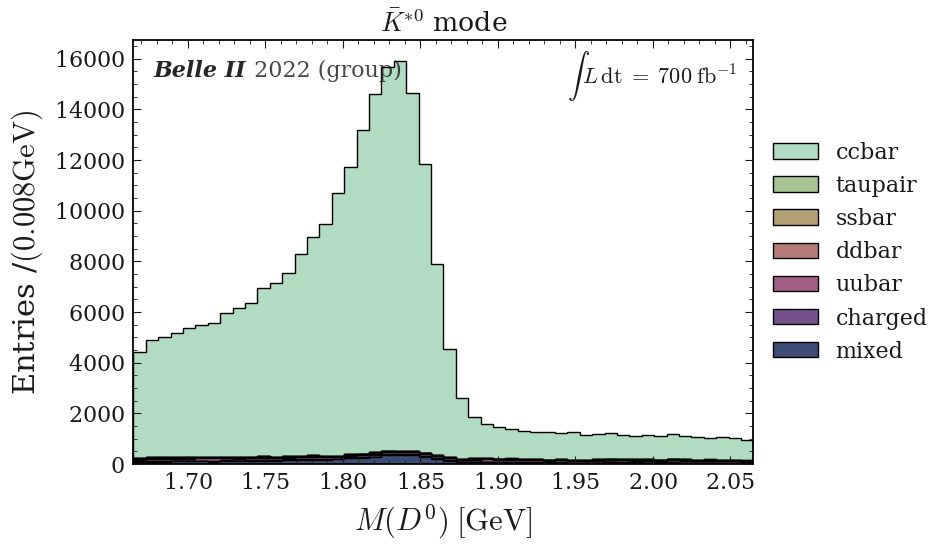

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


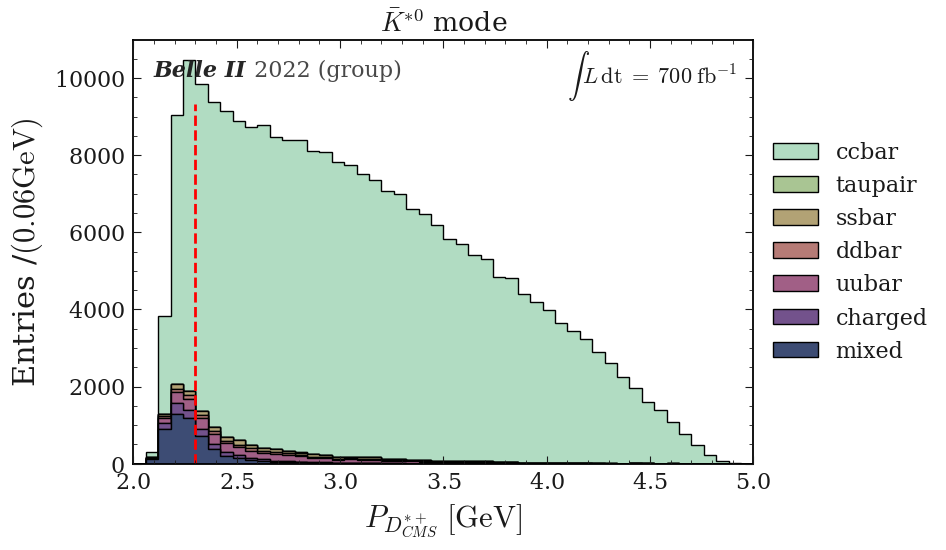

Q
$Q \; [\mathrm{GeV}]$


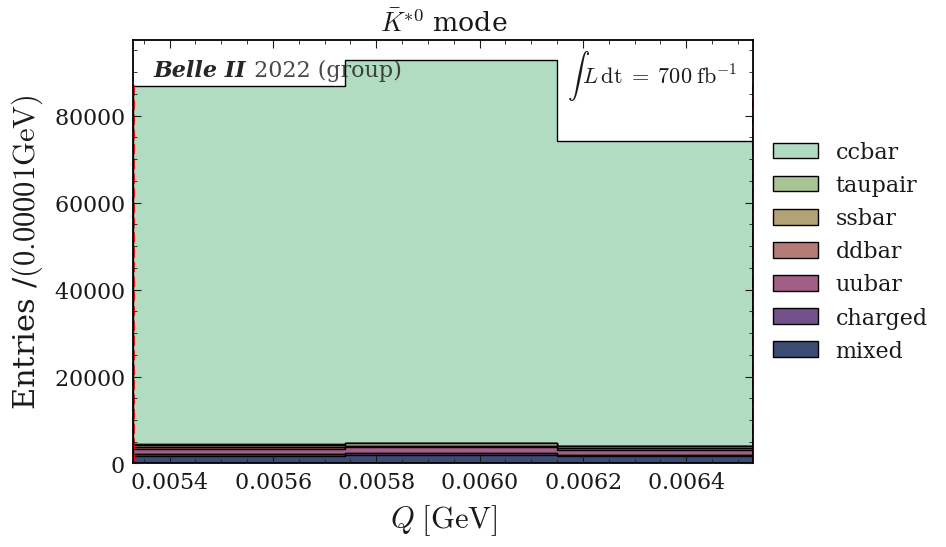

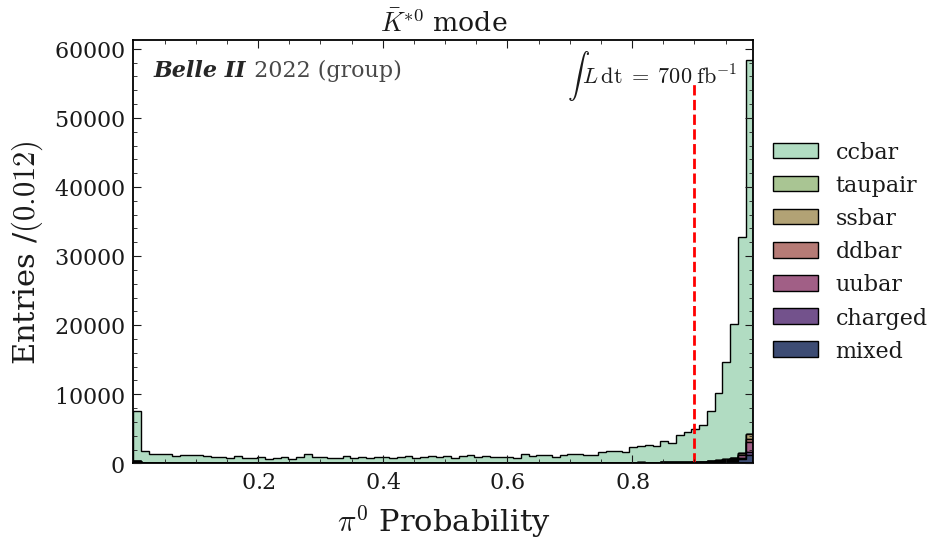

M(bar{K}^{*0})
$M(\bar{K}^{*0}) \; [\mathrm{GeV}]$


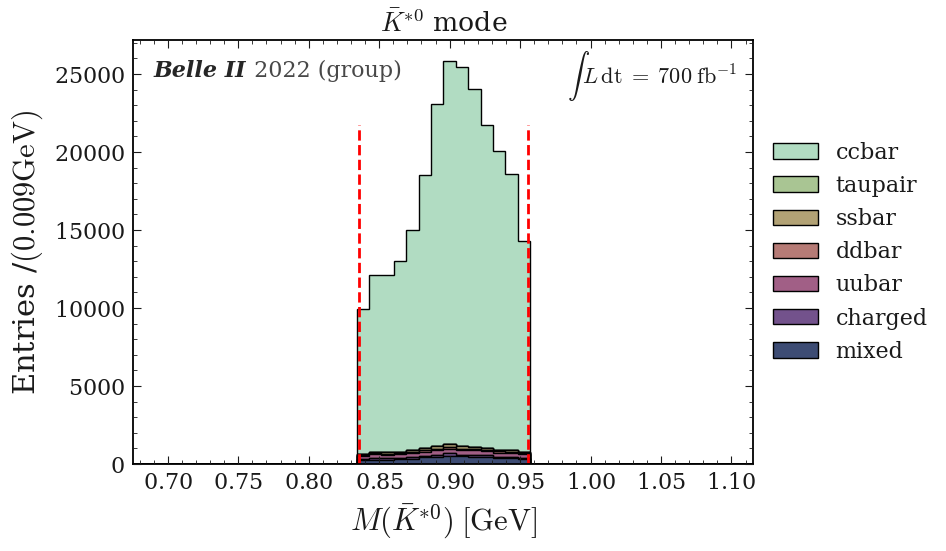

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [27]:
AntiKstar_watching_vars = Watching_vars + ['antiKstar_InvM']
plot_title = r'$\bar{K}^{*0}$ mode'
var_unit = read_yaml_to_dict("vars_name_units")
var_unit = var_unit['units']
var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']


total_lumi="$700\; \mathrm{fb}^{-1}$"

pd_antiKstar2 = pd_antiKstar1.query("abs(Dstarp_Q - 0.00593)<0.0006")
draw_stack_no_signal(figname="2_Q_cut",df=pd_antiKstar2,bins=80, vector='antiKstar', draw_variables=AntiKstar_watching_vars,var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            


(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


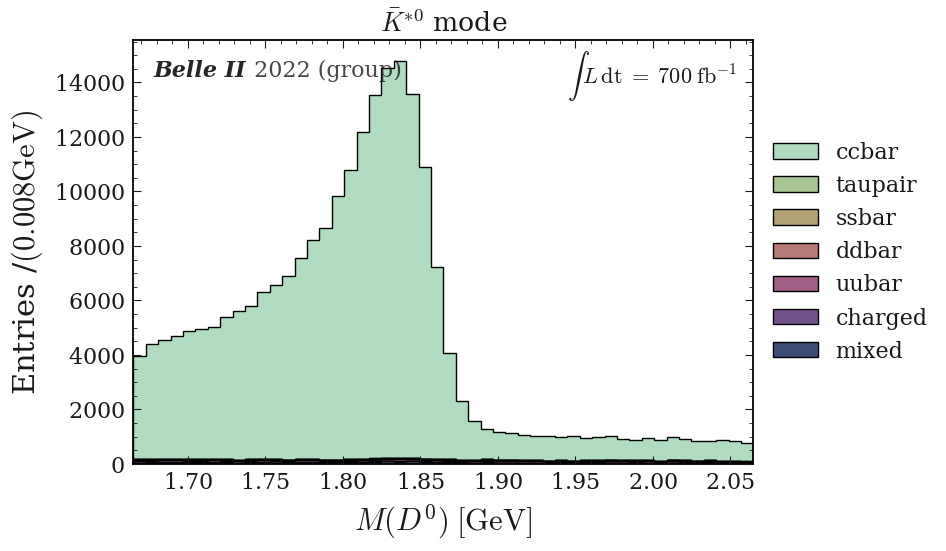

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


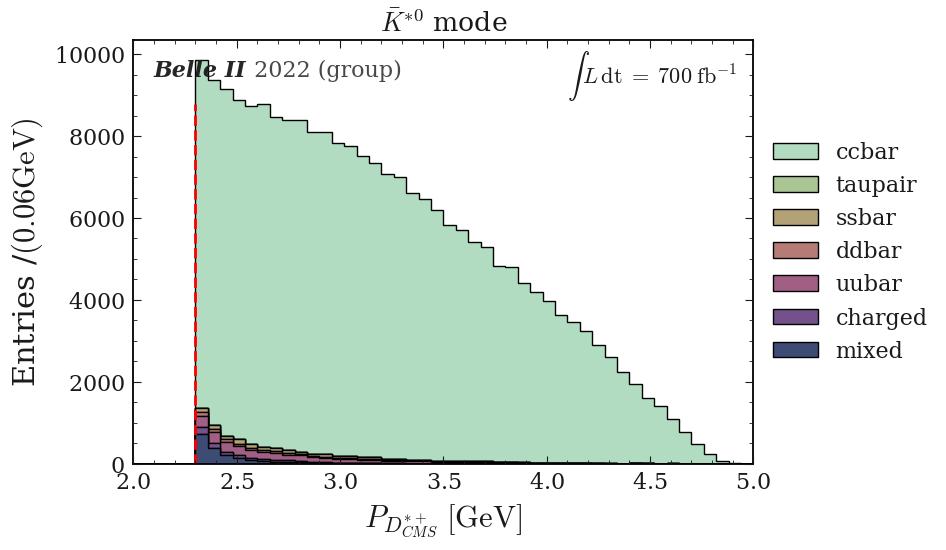

Q
$Q \; [\mathrm{GeV}]$


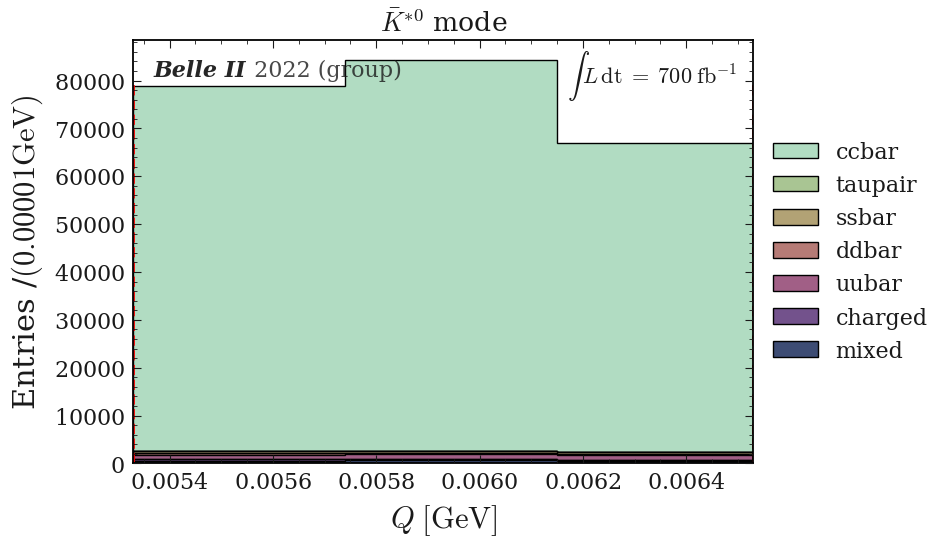

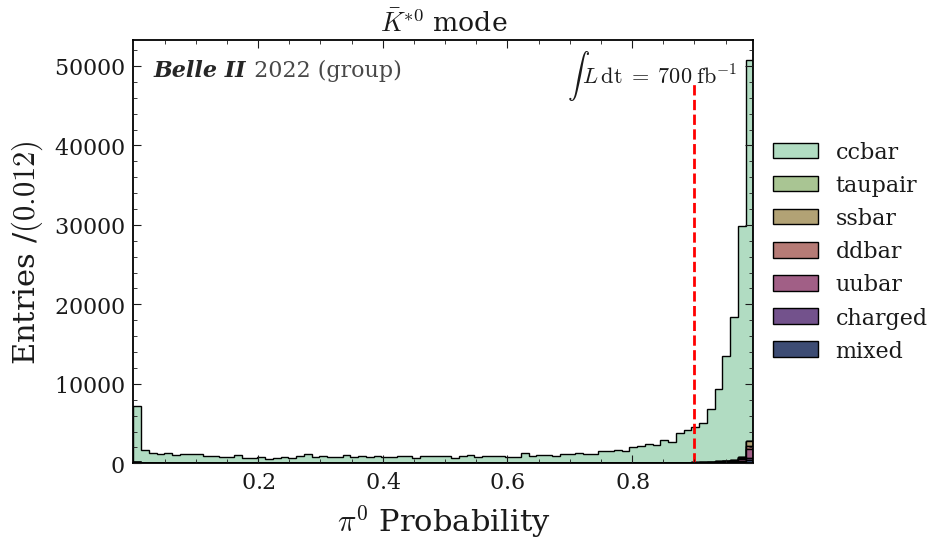

M(bar{K}^{*0})
$M(\bar{K}^{*0}) \; [\mathrm{GeV}]$


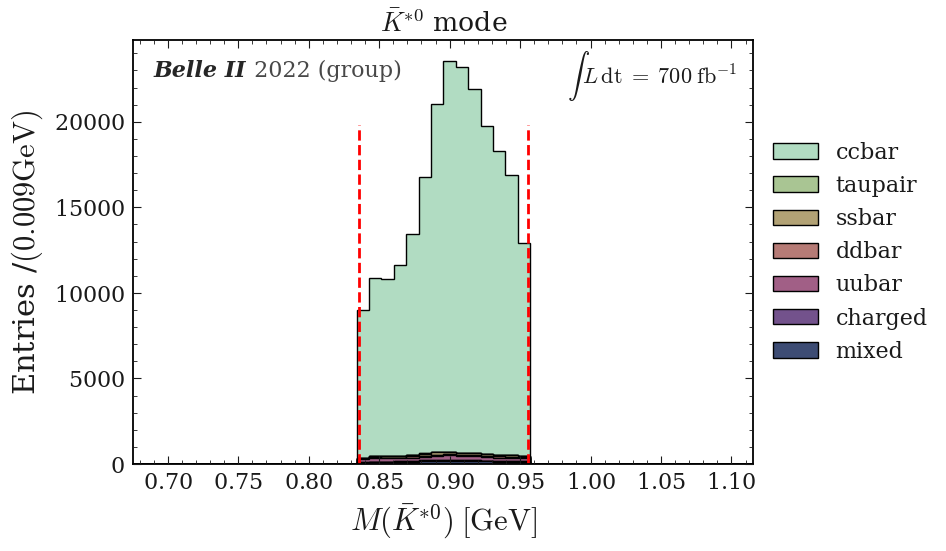

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [28]:
AntiKstar_watching_vars = Watching_vars + ['antiKstar_InvM']
plot_title = r'$\bar{K}^{*0}$ mode'
var_unit = read_yaml_to_dict("vars_name_units")
var_unit = var_unit['units']
var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']


total_lumi="$700\; \mathrm{fb}^{-1}$"

pd_antiKstar3 = pd_antiKstar2.query("Dstarp_CMS_p>2.3")
draw_stack_no_signal(figname="3_CMS_p_cut",df=pd_antiKstar3,bins=80, vector='antiKstar', draw_variables=AntiKstar_watching_vars,var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            


(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


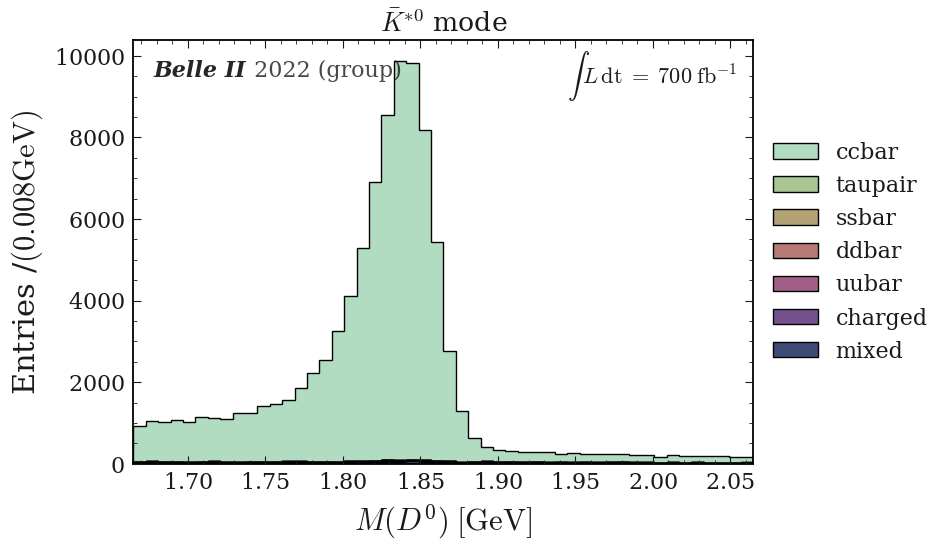

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


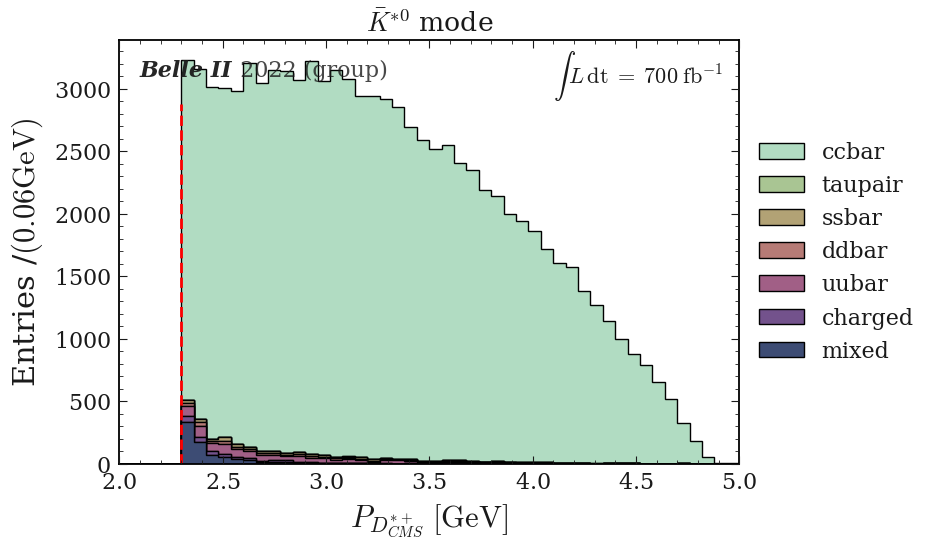

Q
$Q \; [\mathrm{GeV}]$


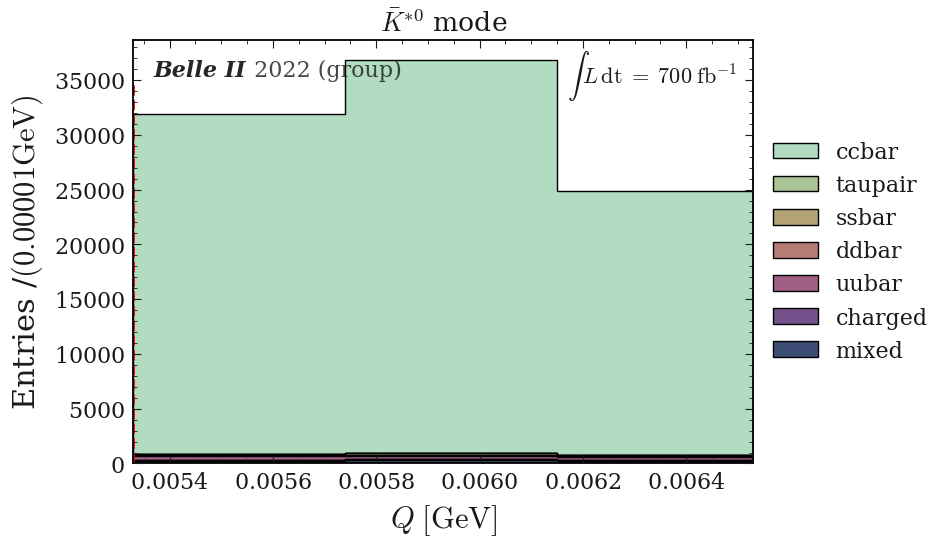

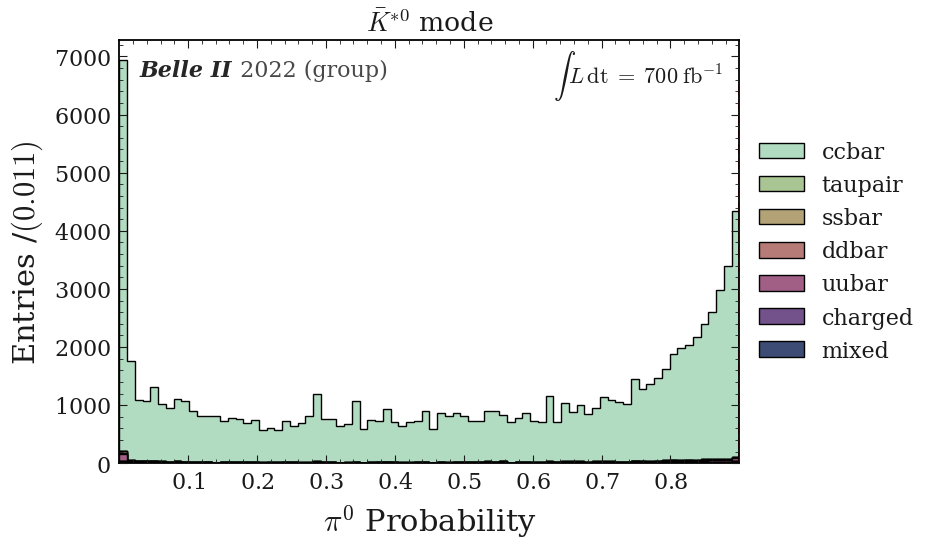

M(bar{K}^{*0})
$M(\bar{K}^{*0}) \; [\mathrm{GeV}]$


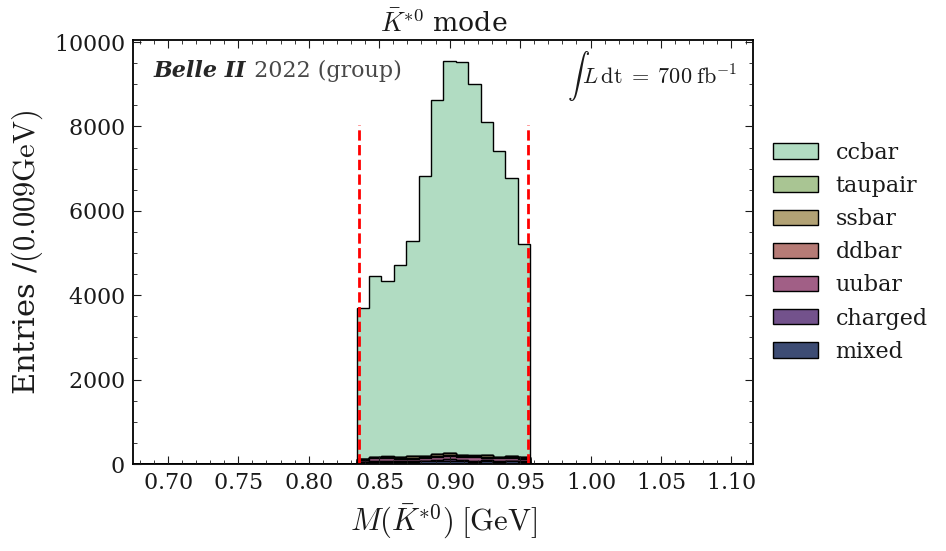

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [39]:
AntiKstar_watching_vars = Watching_vars + ['antiKstar_InvM']
plot_title = r'$\bar{K}^{*0}$ mode'
var_unit = read_yaml_to_dict("vars_name_units")
var_unit = var_unit['units']
var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']


total_lumi="$700\; \mathrm{fb}^{-1}$"

pd_antiKstar4 = pd_antiKstar3.query("Pi0_Prob<0.9")
draw_stack_no_signal(figname="4_pi0_veto_cut",df=pd_antiKstar4,bins=80, vector='antiKstar', draw_variables=AntiKstar_watching_vars,var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            


## omega

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


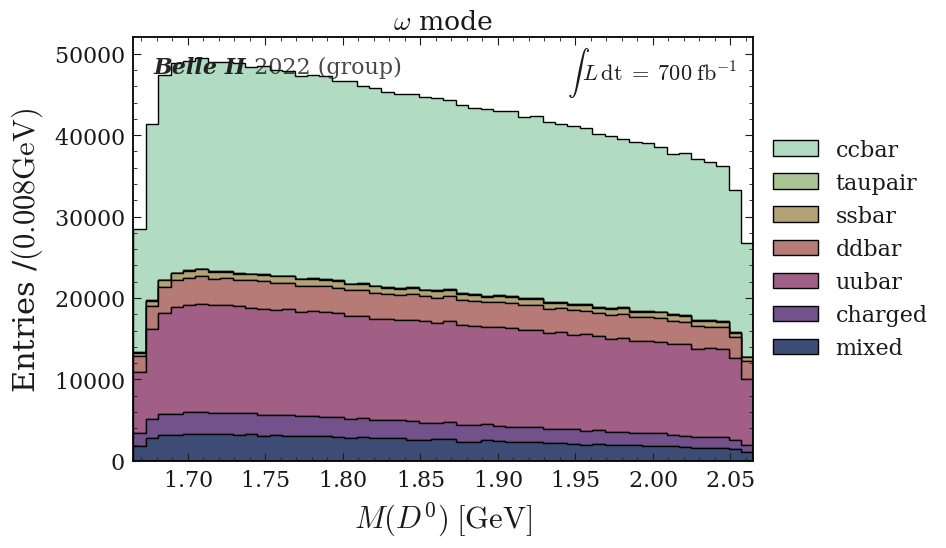

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


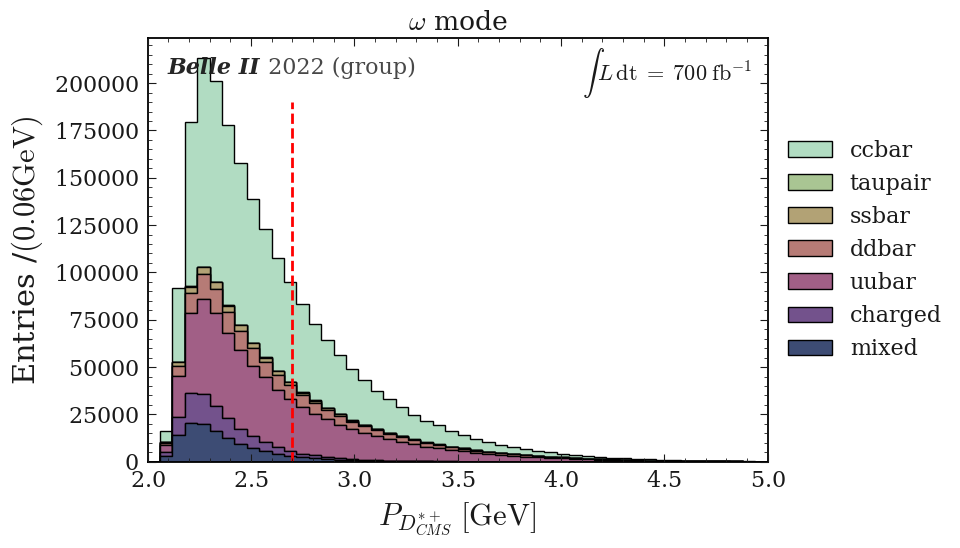

Q
$Q \; [\mathrm{GeV}]$


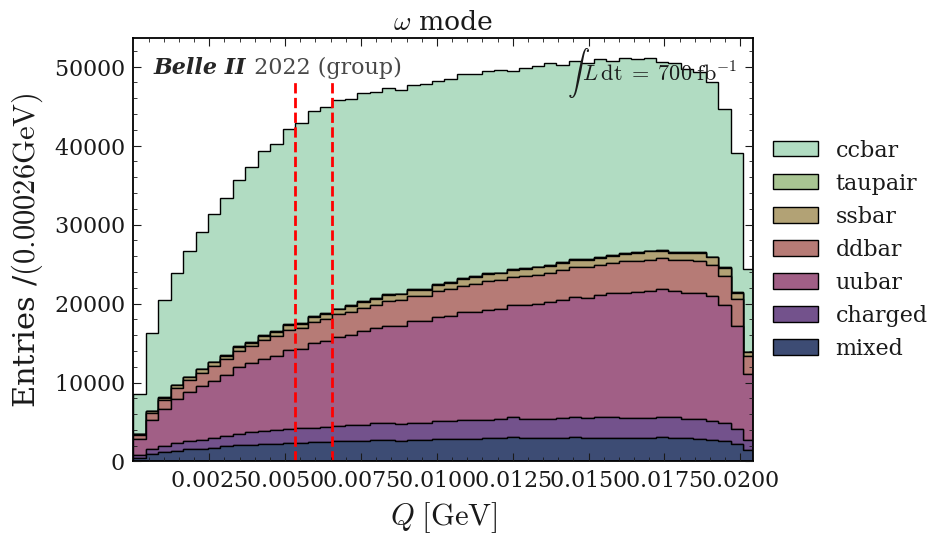

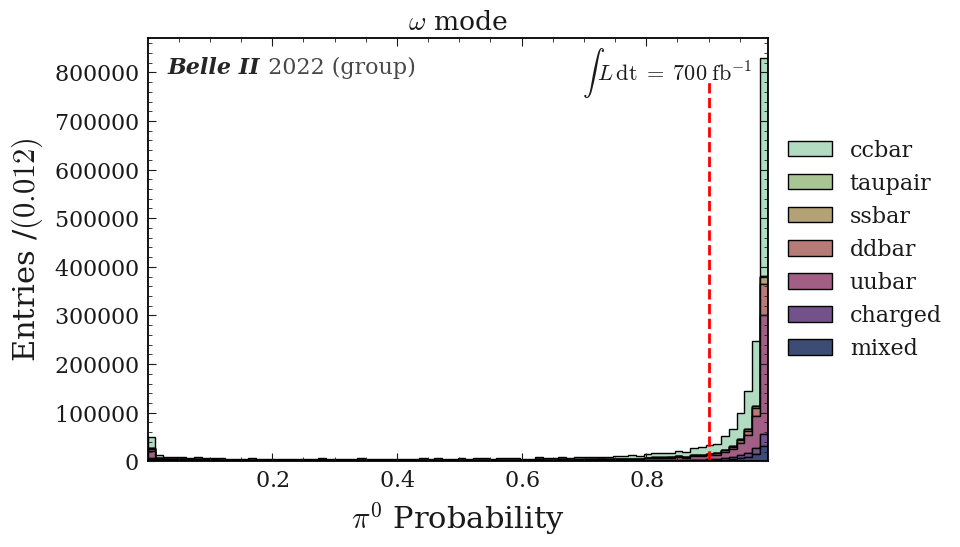

M(\omega)
$M(\omega) \; [\mathrm{GeV}]$


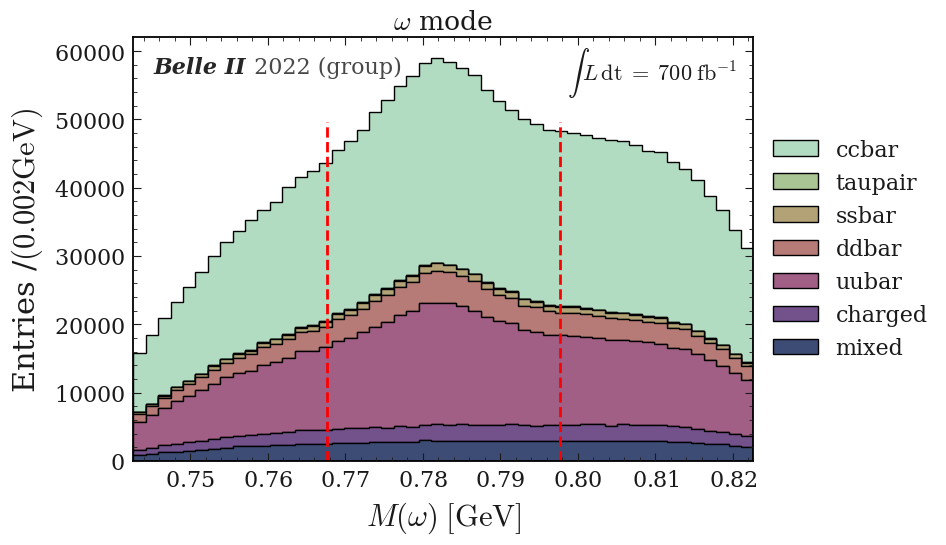

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [33]:
Omega_watching_vars = Watching_vars + ['Omega_InvM']

plot_title = r'$\omega$ mode'
var_unit = read_yaml_to_dict("vars_name_units")

var_unit = var_unit['units']

var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"

pd_omega = pd_omega.query("abs(Omega_InvM - 0.78265)<0.04")
draw_stack_no_signal(figname="0_No_cut",df=pd_omega,bins=80, draw_variables = Omega_watching_vars,vector='omega', var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            


(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


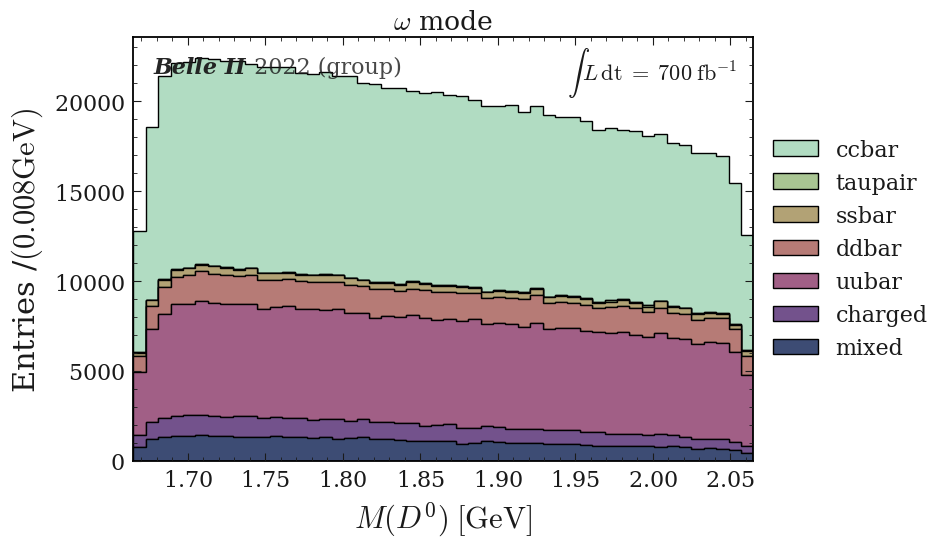

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


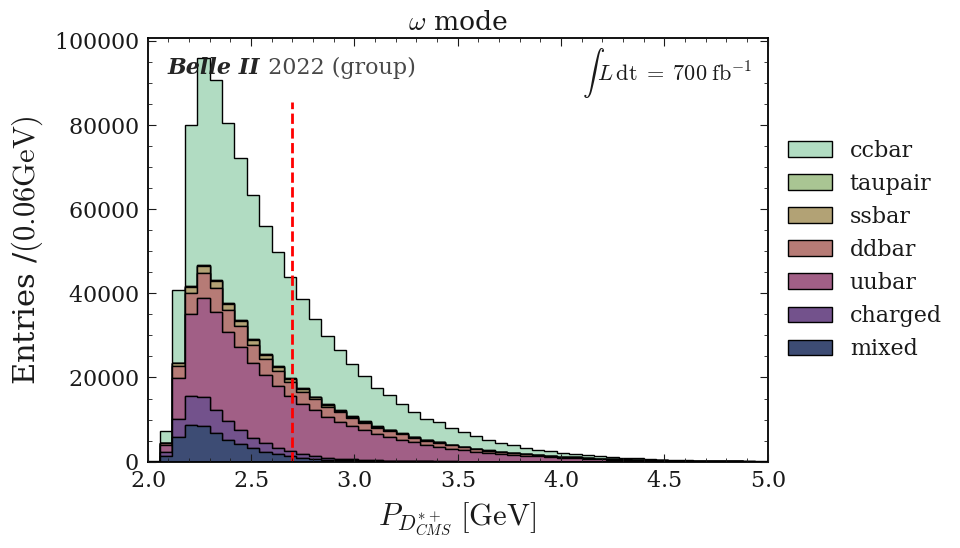

Q
$Q \; [\mathrm{GeV}]$


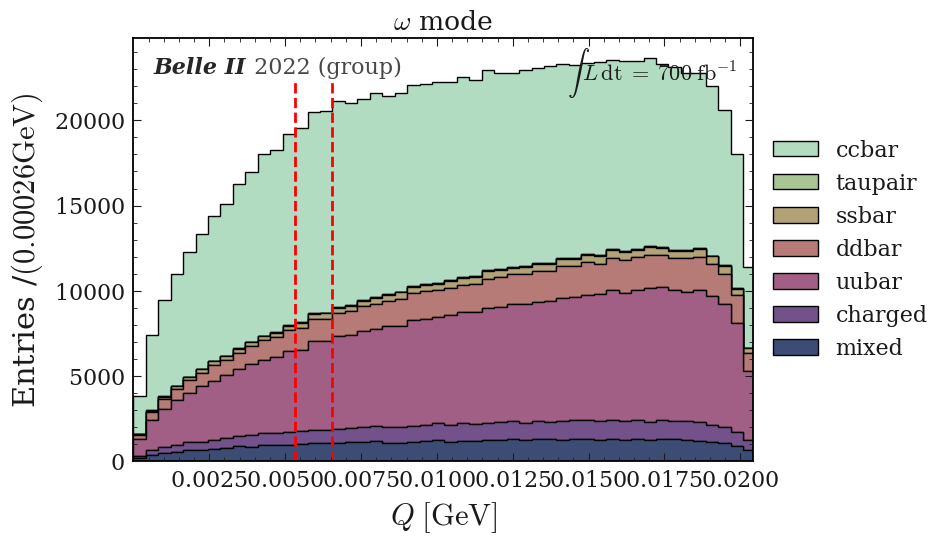

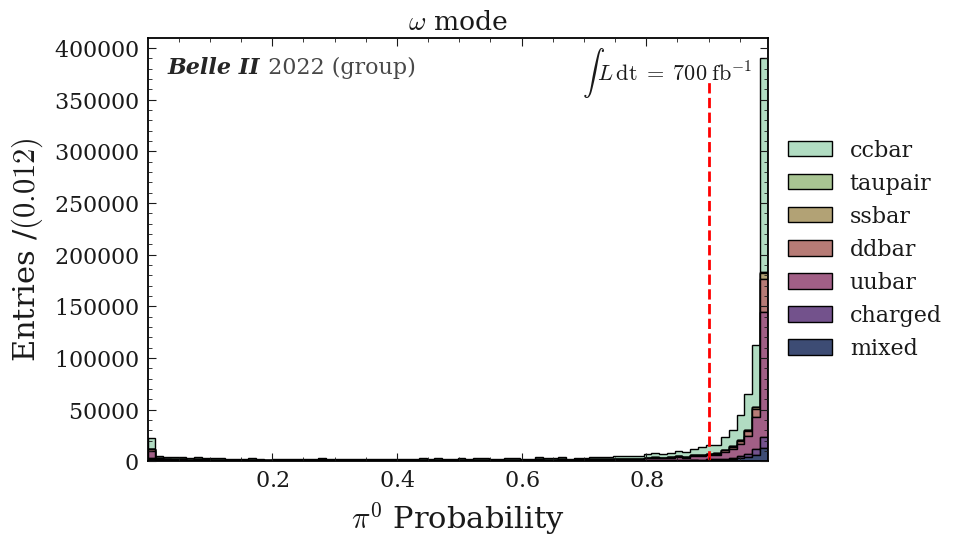

M(\omega)
$M(\omega) \; [\mathrm{GeV}]$


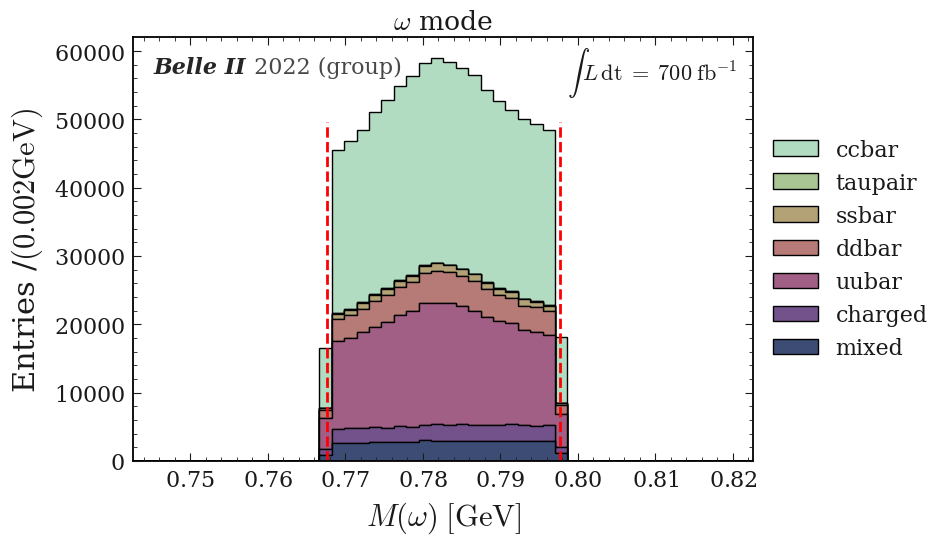

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [34]:
Omega_watching_vars = Watching_vars + ['Omega_InvM']

plot_title = r'$\omega$ mode'
var_unit = read_yaml_to_dict("vars_name_units")

var_unit = var_unit['units']

var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"

pd_omega1 = pd_omega.query("abs(Omega_InvM - 0.78265)<0.015")
draw_stack_no_signal(figname="1_vector_cut", df=pd_omega1,bins=80, draw_variables = Omega_watching_vars,vector='omega', var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            


(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


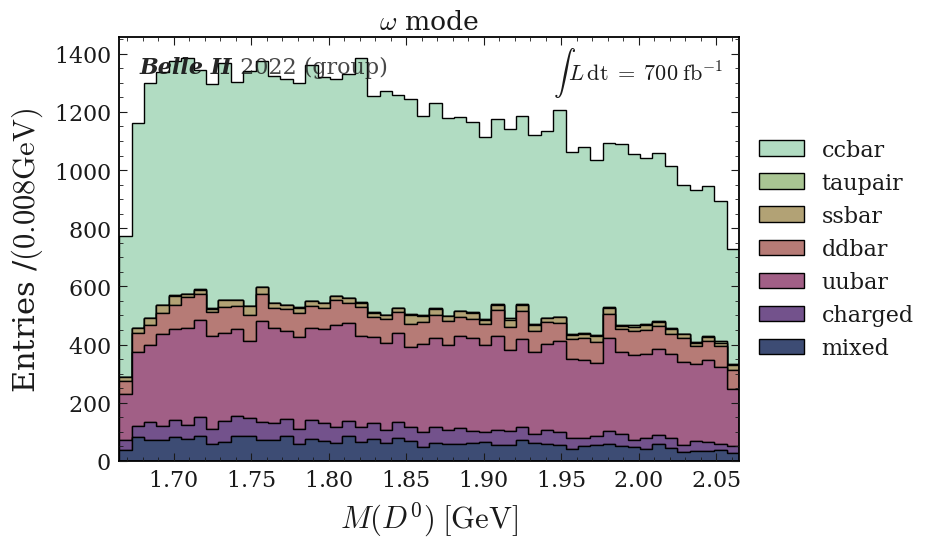

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


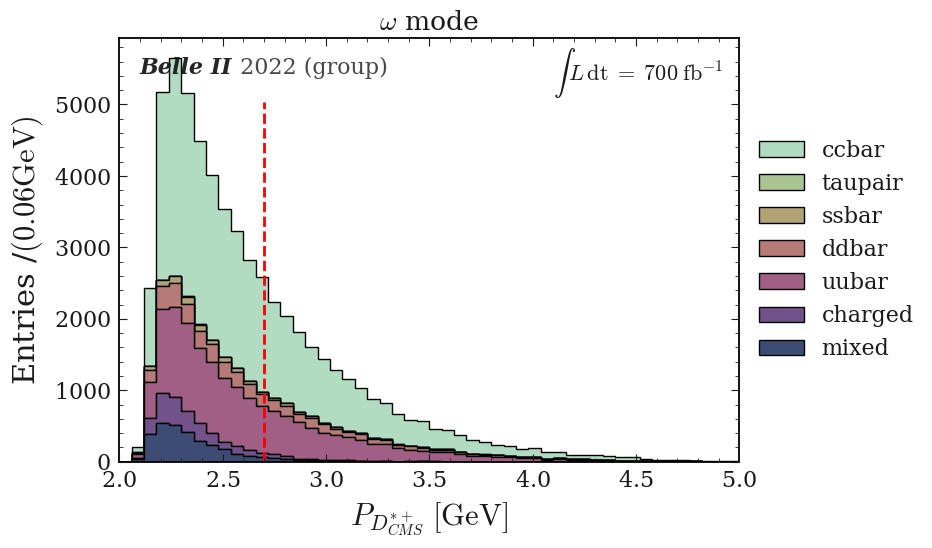

Q
$Q \; [\mathrm{GeV}]$


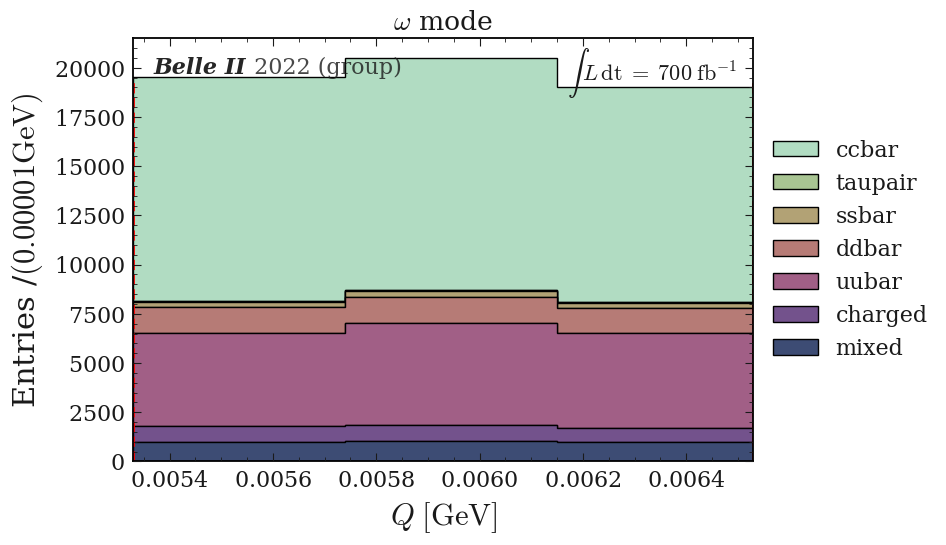

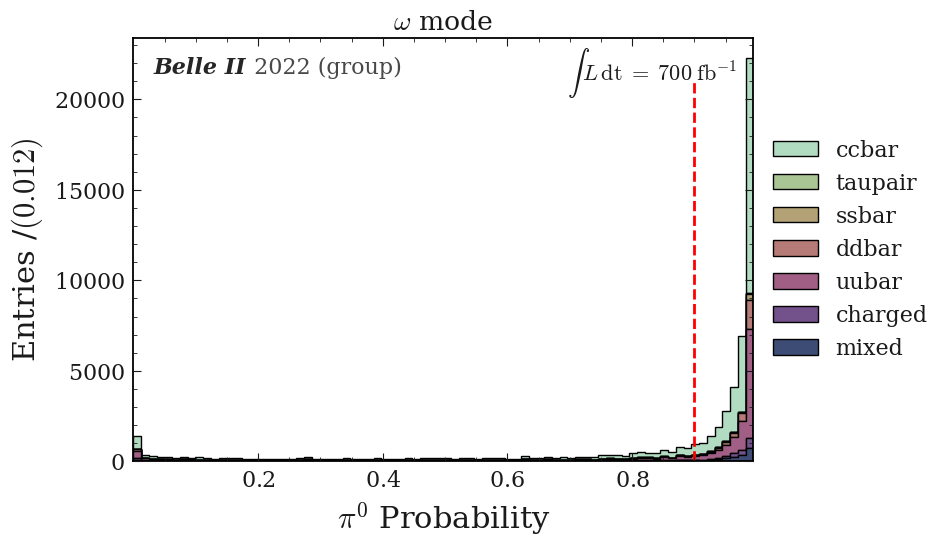

M(\omega)
$M(\omega) \; [\mathrm{GeV}]$


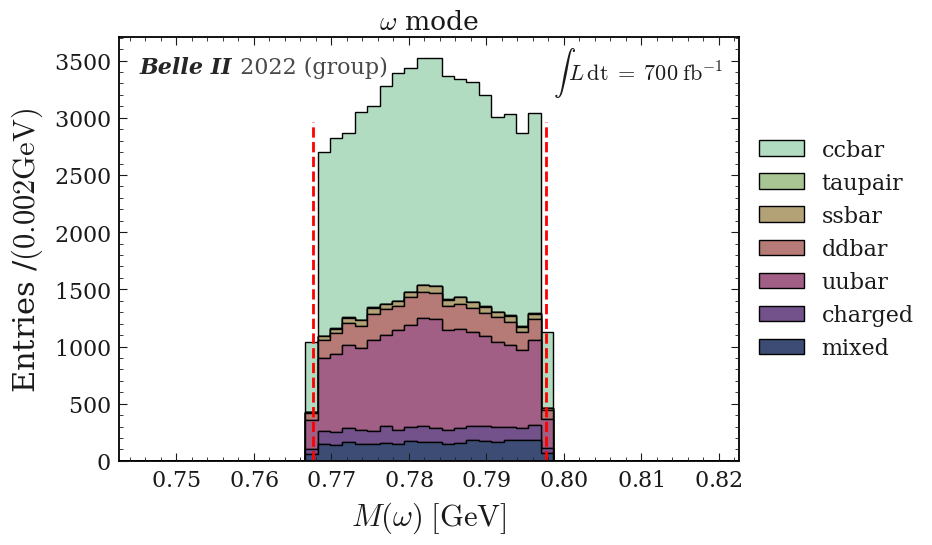

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [35]:
Omega_watching_vars = Watching_vars + ['Omega_InvM']

plot_title = r'$\omega$ mode'
var_unit = read_yaml_to_dict("vars_name_units")

var_unit = var_unit['units']

var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"

pd_omega2 = pd_omega1.query("abs(Dstarp_Q - 0.00593)<0.0006")
draw_stack_no_signal(figname="2_Q_cut", df=pd_omega2,bins=80, draw_variables = Omega_watching_vars,vector='omega', var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            


(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


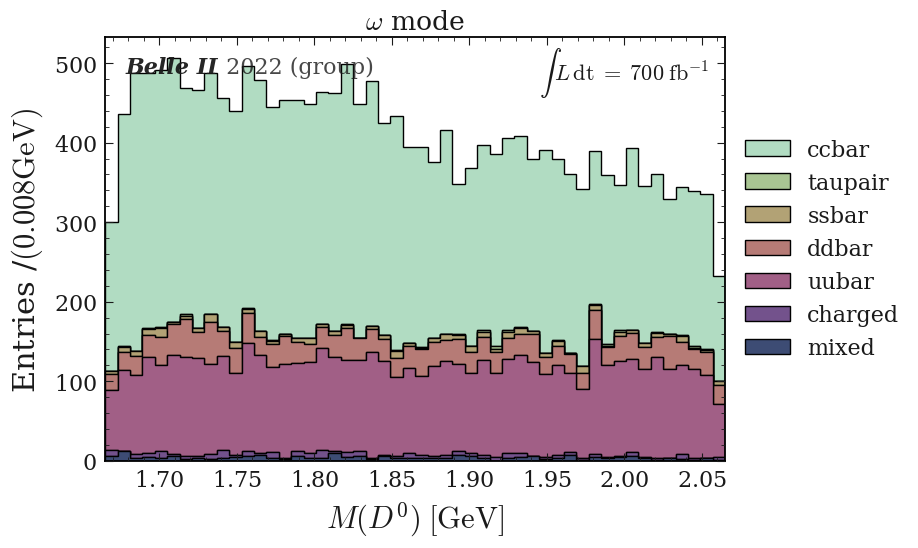

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


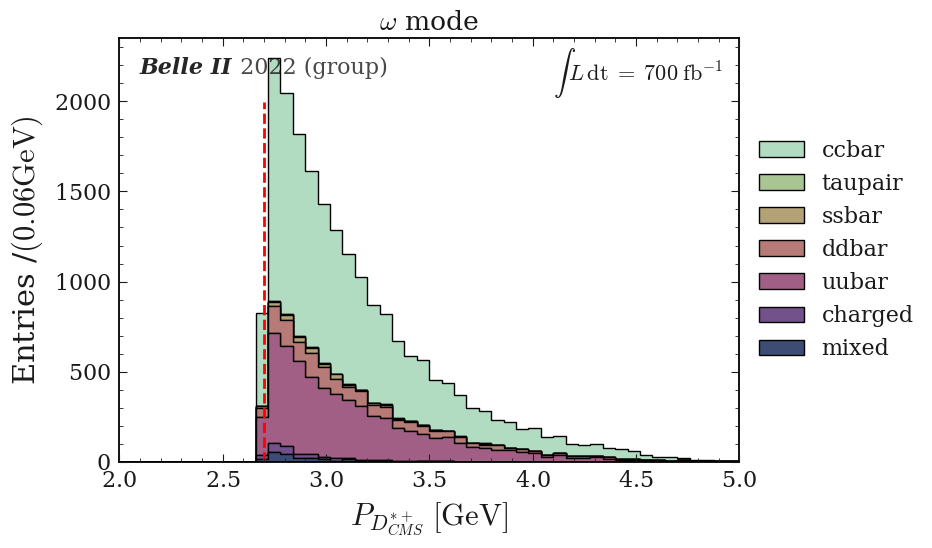

Q
$Q \; [\mathrm{GeV}]$


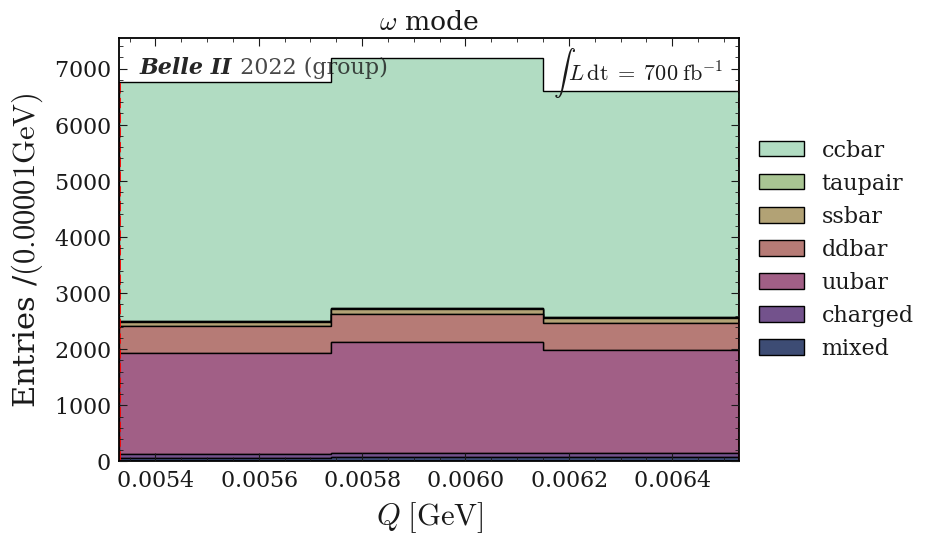

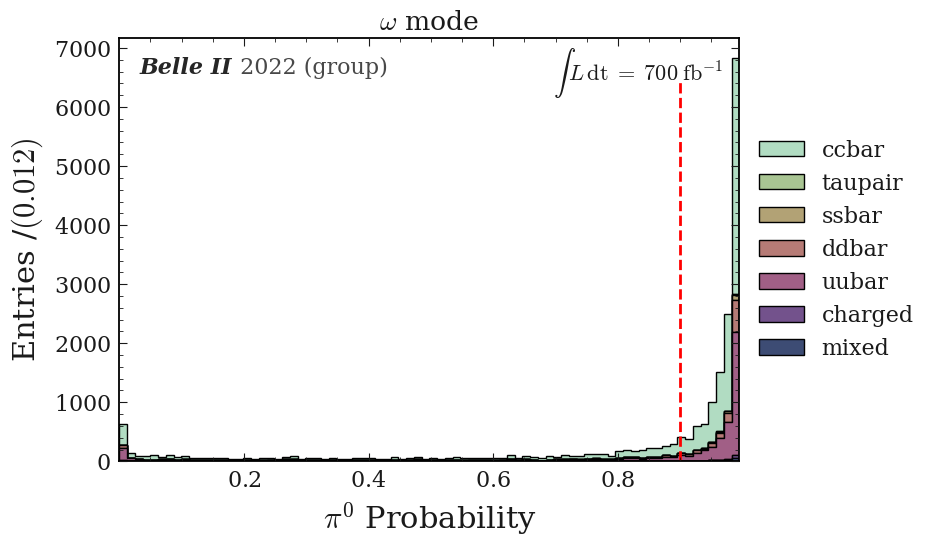

M(\omega)
$M(\omega) \; [\mathrm{GeV}]$


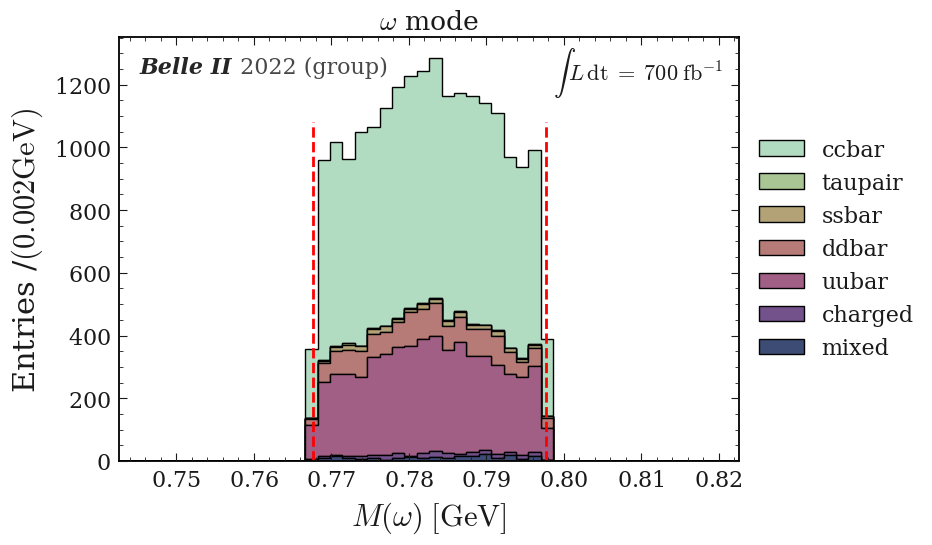

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [36]:
Omega_watching_vars = Watching_vars + ['Omega_InvM']

plot_title = r'$\omega$ mode'
var_unit = read_yaml_to_dict("vars_name_units")

var_unit = var_unit['units']

var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"

pd_omega3 = pd_omega2.query("Dstarp_CMS_p > 2.7")
draw_stack_no_signal(figname="3_Dst_CMS_p_cut", df=pd_omega3,bins=80, draw_variables = Omega_watching_vars,vector='omega', var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            


(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


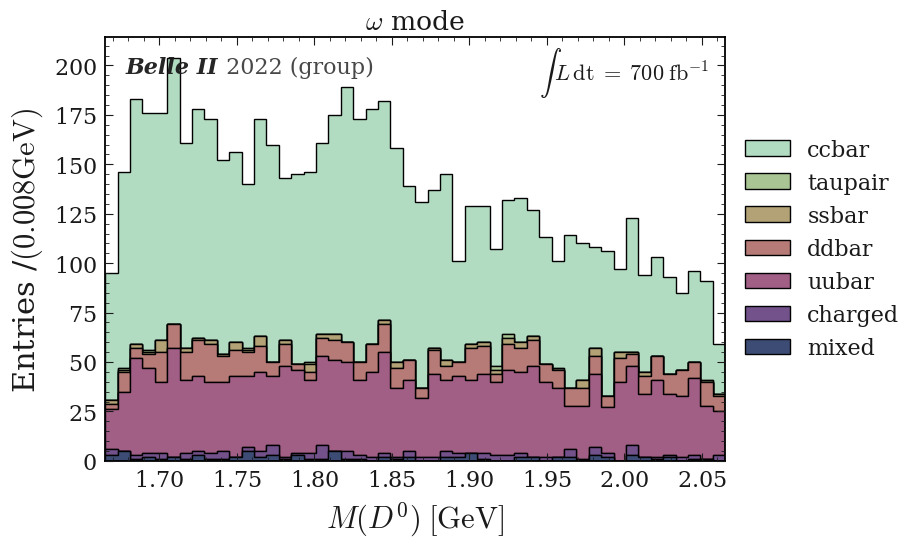

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


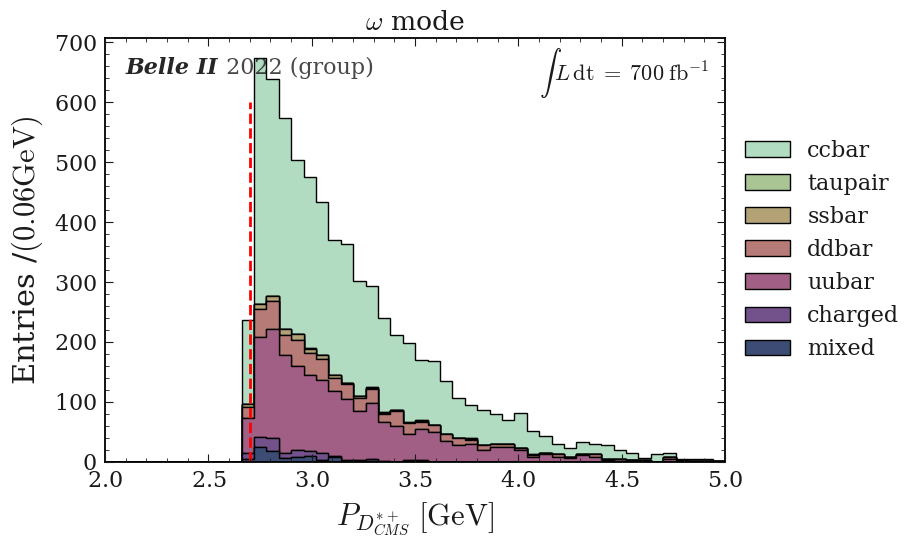

Q
$Q \; [\mathrm{GeV}]$


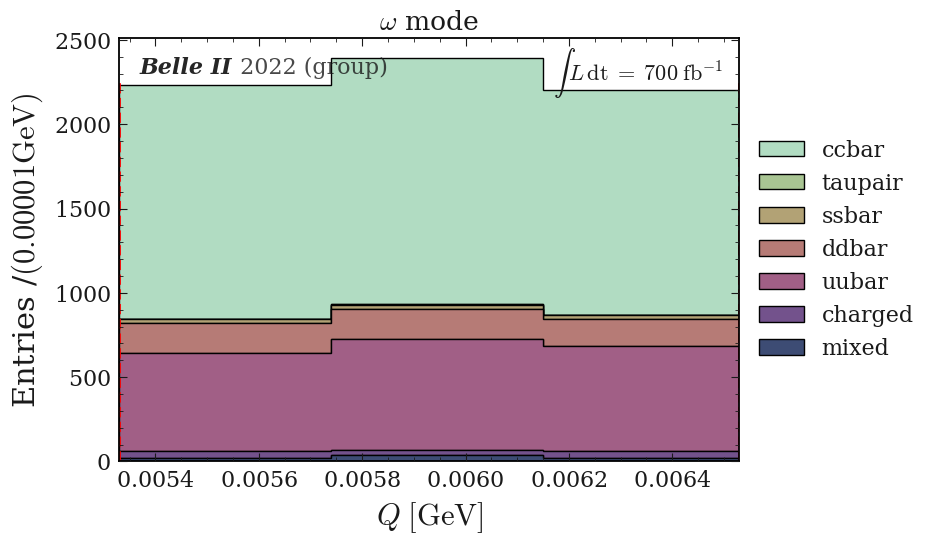

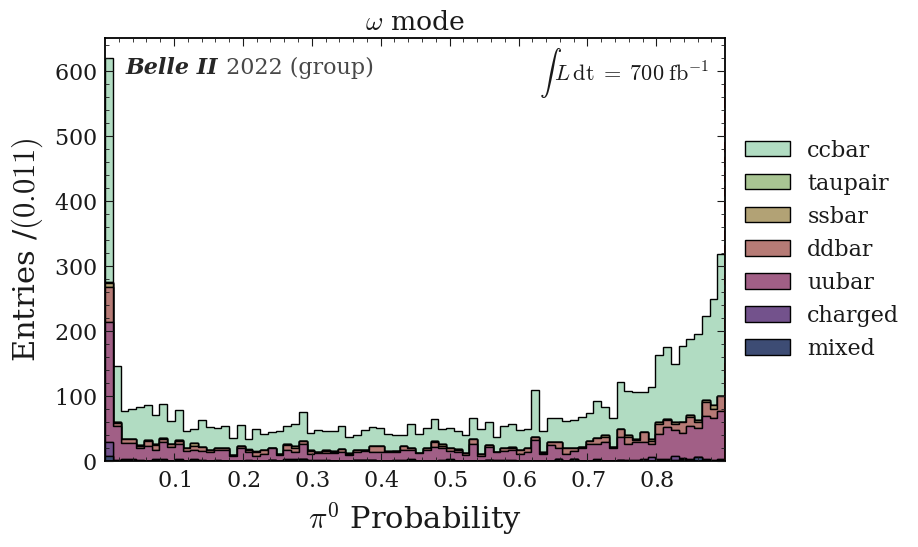

M(\omega)
$M(\omega) \; [\mathrm{GeV}]$


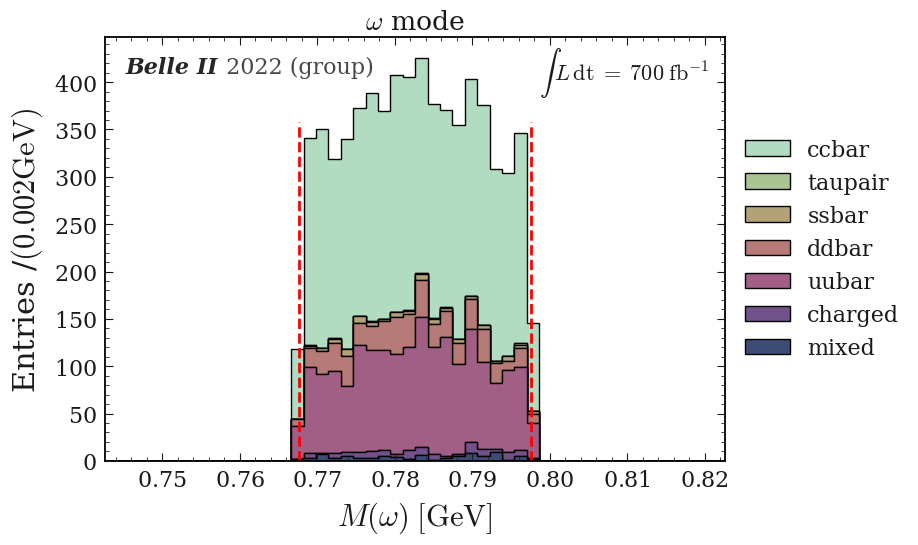

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [37]:
Omega_watching_vars = Watching_vars + ['Omega_InvM']

plot_title = r'$\omega$ mode'
var_unit = read_yaml_to_dict("vars_name_units")

var_unit = var_unit['units']

var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"

pd_omega4 = pd_omega3.query("Pi0_Prob<0.9")
draw_stack_no_signal(figname="4_pi0_veto_cut", df=pd_omega4,bins=80, draw_variables = Omega_watching_vars,vector='omega', var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            


# All variables

In [16]:
location='lab_ssd'
# option = 'train_v2_pre'
option='train_v2_extraction_pi0veto'
sample_info = read_yaml_to_dict("samples")

In [17]:
sample_info

{'pid_0_5': {'ccbar': '/ccbar/pid_0_5_ccbar_recon_output_0*.root',
  'charged': '/charged/pid_0_5_charged_recon_output_0*.root',
  'mixed': '/mixed/pid_0_5_mixed_recon_output_0*.root',
  'uubar': '/uubar/pid_0_5_uubar_recon_output_0*.root',
  'ddbar': '/ddbar/pid_0_5_ddbar_recon_output_0*.root',
  'ssbar': '/ssbar/pid_0_5_ssbar_recon_output_0*.root',
  'taupair': '/taupair/pid_0_5_taupair_recon_output_0*.root'},
 'pid_0_5_no_signal': {'ccbar': '/ccbar/pid_0_5_no_signal_ccbar_recon_output_0*.root',
  'charged': '/charged/pid_0_5_charged_recon_output_0*.root',
  'mixed': '/mixed/pid_0_5_mixed_recon_output_0*.root',
  'uubar': '/uubar/pid_0_5_uubar_recon_output_0*.root',
  'ddbar': '/ddbar/pid_0_5_ddbar_recon_output_0*.root',
  'ssbar': '/ssbar/pid_0_5_ssbar_recon_output_0*.root',
  'taupair': '/taupair/pid_0_5_taupair_recon_output_0*.root'},
 'location': {'kekcc': '/group/belle/users/jaeyoung/storage/01_recon/merge_generic_bkg',
  'lab_nas': '/home/jykim/nas/storage/01_recon/merge_generi

In [18]:
sample_loc=sample_name(option=option, location=location, sample_info=sample_info) 
#sample_loc=sample_name(option='pid_0_5_no_signal', location=location) 
print(sample_loc )

{'ccbar': '/media/jykim/ssd_T5/storage/01_recon/merge_generic_bkg/ccbar/train_v2_extraction_pi0veto_ccbar_recon_output_0*.root', 'charged': '/media/jykim/ssd_T5/storage/01_recon/merge_generic_bkg/charged/train_v2_extraction_pi0veto_charged_recon_output_0*.root', 'mixed': '/media/jykim/ssd_T5/storage/01_recon/merge_generic_bkg/mixed/train_v2_extraction_pi0veto_mixed_recon_output_0*.root', 'uubar': '/media/jykim/ssd_T5/storage/01_recon/merge_generic_bkg/uubar/train_v2_extraction_pi0veto_uubar_recon_output_0*.root', 'ddbar': '/media/jykim/ssd_T5/storage/01_recon/merge_generic_bkg/ddbar/train_v2_extraction_pi0veto_ddbar_recon_output_0*.root', 'ssbar': '/media/jykim/ssd_T5/storage/01_recon/merge_generic_bkg/ssbar/train_v2_extraction_pi0veto_ssbar_recon_output_0*.root', 'taupair': '/media/jykim/ssd_T5/storage/01_recon/merge_generic_bkg/taupair/train_v2_extraction_pi0veto_taupair_recon_output_0*.root'}


In [19]:
List = ['phi', 'antiKstar', 'rho', 'omega']
extract_variables = "plot_variables"

In [20]:
plot_variables = read_yaml_to_dict(extract_variables )

In [21]:
plot_variables

{'vars': ['D0_M',
  'Dstarp_Q',
  'D0_cosHel_0',
  'Dstarp_CMS_p',
  'gamma_E',
  'gamma_clusterSecondMoment',
  '__ncandidates__',
  '__experiment__',
  '__run__',
  '__event__',
  'Dstarp_isSignal',
  'D0_isSignal']}

In [22]:
for mode in List:
    if mode == 'phi':
        plot_variables = read_yaml_to_dict(extract_variables )
        plot_variables['vars'].append('Pi0_Prob')
        plot_variables['vars'].append('Eta_Prob')
        pd_phi = generic_ntuple(vector=mode, variables_dict=plot_variables,sample_location=sample_loc)
    elif mode == 'antiKstar':
        plot_variables = read_yaml_to_dict(extract_variables )
        plot_variables['vars'].append('Pi0_Prob')
        plot_variables['vars'].append('Eta_Prob')
        pd_antiKstar = generic_ntuple(vector=mode, variables_dict=plot_variables,sample_location=sample_loc)
    elif mode == 'rho':
        plot_variables = read_yaml_to_dict(extract_variables )
        plot_variables['vars'].append('Pi0_Prob')
        plot_variables['vars'].append('Eta_Prob')
        pd_rho = generic_ntuple(vector=mode, variables_dict=plot_variables,sample_location=sample_loc)
    elif mode == 'omega':
        plot_variables = read_yaml_to_dict(extract_variables )
        plot_variables['vars'].append('Pi0_Prob')
        plot_variables['vars'].append('Eta_Prob')
        pd_omega = generic_ntuple(vector=mode, variables_dict=plot_variables,sample_location=sample_loc)
        

['D0_M', 'Dstarp_Q', 'D0_cosHel_0', 'Dstarp_CMS_p', 'gamma_E', 'gamma_clusterSecondMoment', '__ncandidates__', '__experiment__', '__run__', '__event__', 'Dstarp_isSignal', 'D0_isSignal', 'Pi0_Prob', 'Eta_Prob', 'Phi_InvM', 'D0_cosHel_0']
['D0_M', 'Dstarp_Q', 'D0_cosHel_0', 'Dstarp_CMS_p', 'gamma_E', 'gamma_clusterSecondMoment', '__ncandidates__', '__experiment__', '__run__', '__event__', 'Dstarp_isSignal', 'D0_isSignal', 'Pi0_Prob', 'Eta_Prob', 'antiKstar_InvM', 'D0_cosHel_0']
['D0_M', 'Dstarp_Q', 'D0_cosHel_0', 'Dstarp_CMS_p', 'gamma_E', 'gamma_clusterSecondMoment', '__ncandidates__', '__experiment__', '__run__', '__event__', 'Dstarp_isSignal', 'D0_isSignal', 'Pi0_Prob', 'Eta_Prob', 'Rho_InvM', 'D0_cosHel_0']
['D0_M', 'Dstarp_Q', 'D0_cosHel_0', 'Dstarp_CMS_p', 'gamma_E', 'gamma_clusterSecondMoment', '__ncandidates__', '__experiment__', '__run__', '__event__', 'Dstarp_isSignal', 'D0_isSignal', 'Pi0_Prob', 'Eta_Prob', 'D0_cosHel_2', 'Omega_InvM']


## phi

In [13]:
# signal + bkg 
pd_phi_D0 = pd_phi[pd_phi["Pis_charge"]==1]

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


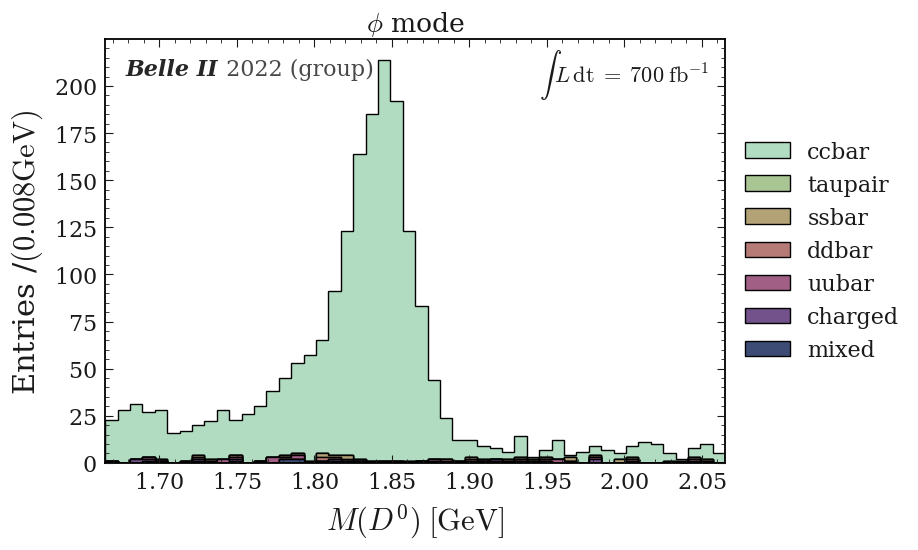

Q
$Q \; [\mathrm{GeV}]$


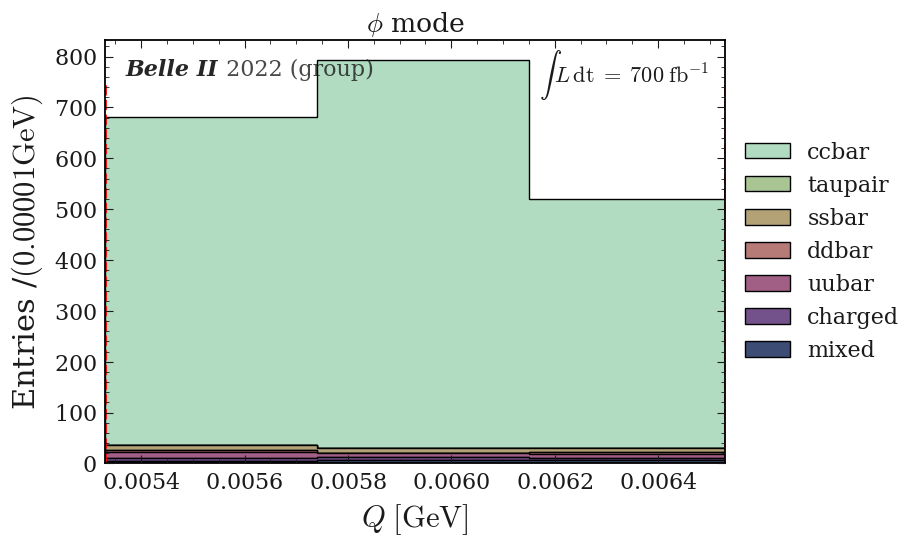

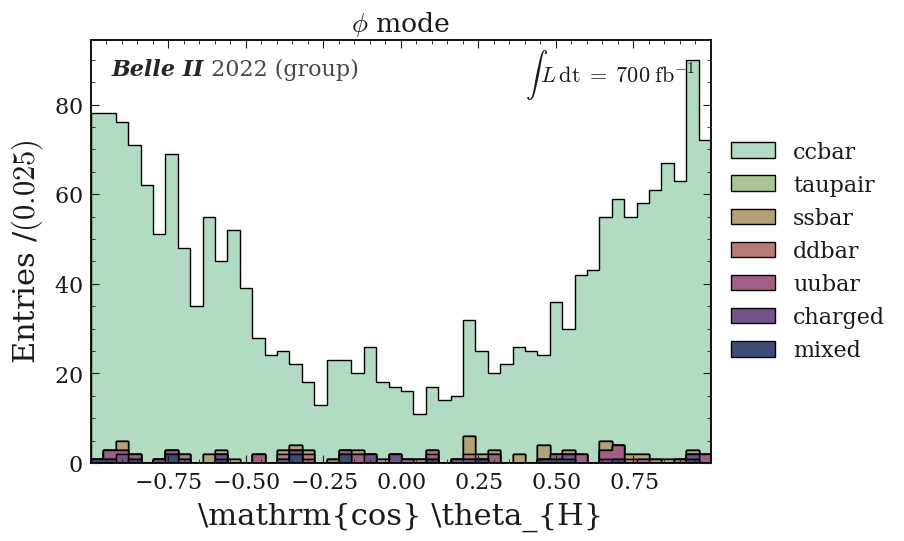

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


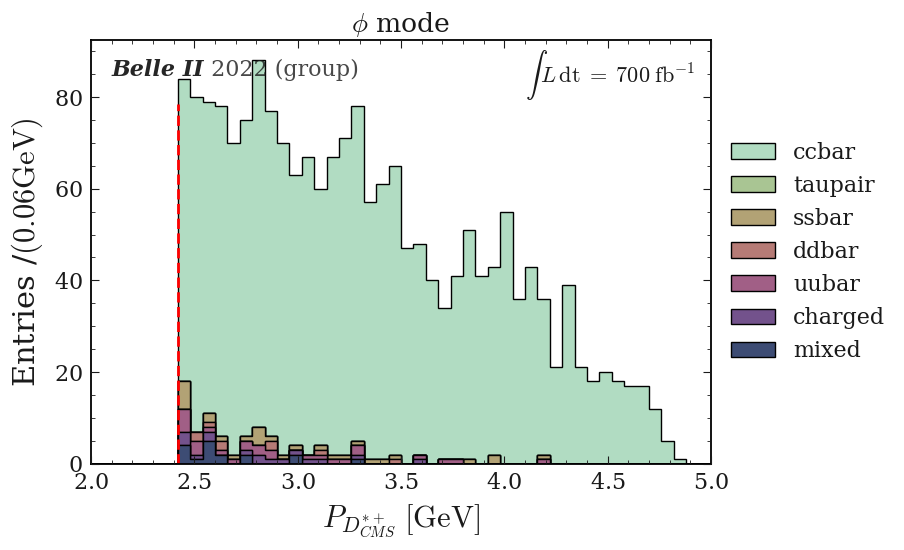

E_{\gamma}
$E_{\gamma} \; [\mathrm{GeV}]$


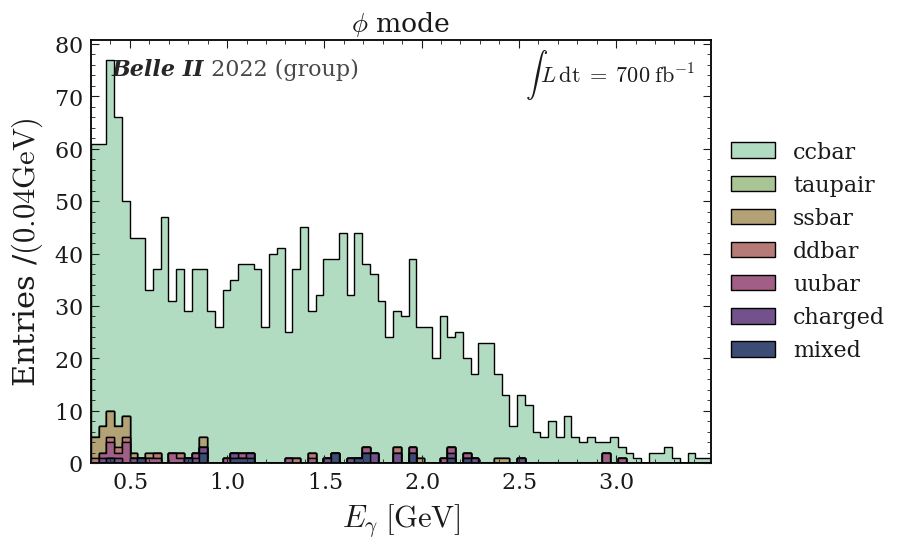

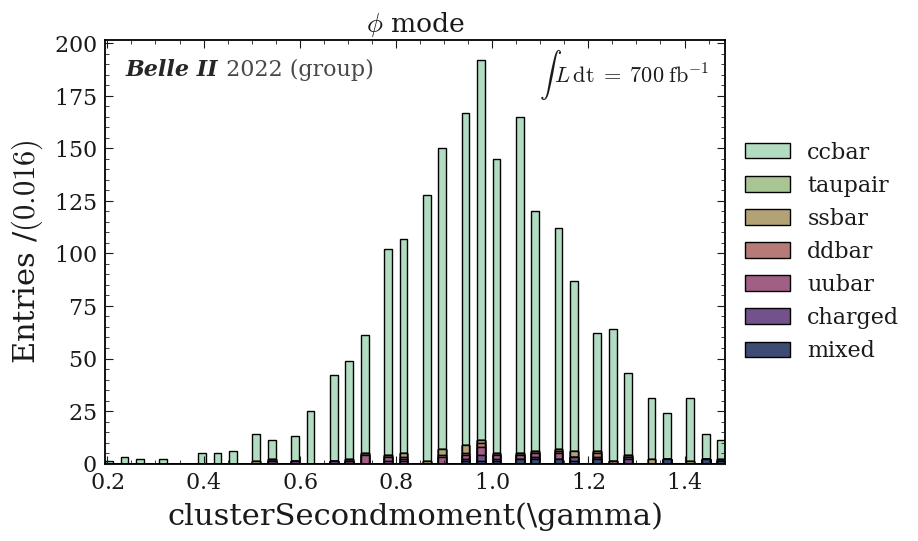

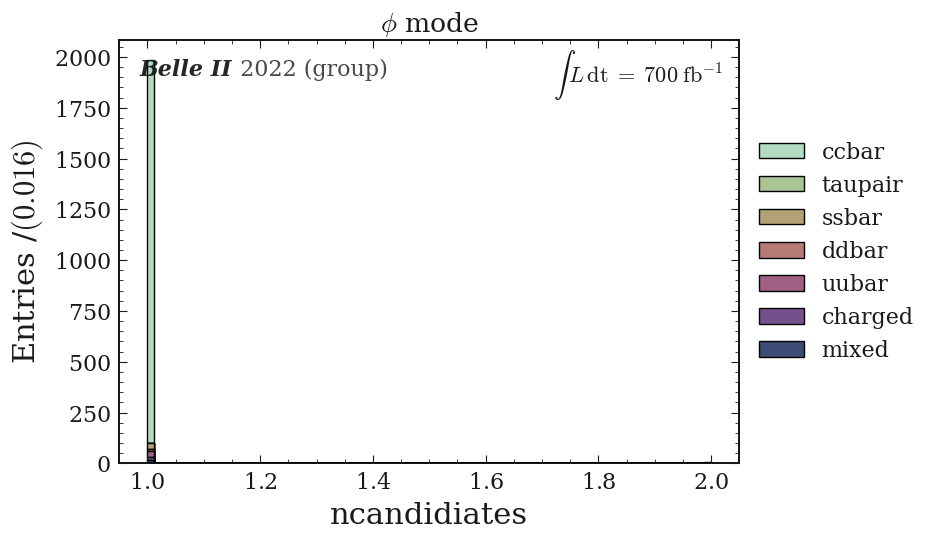

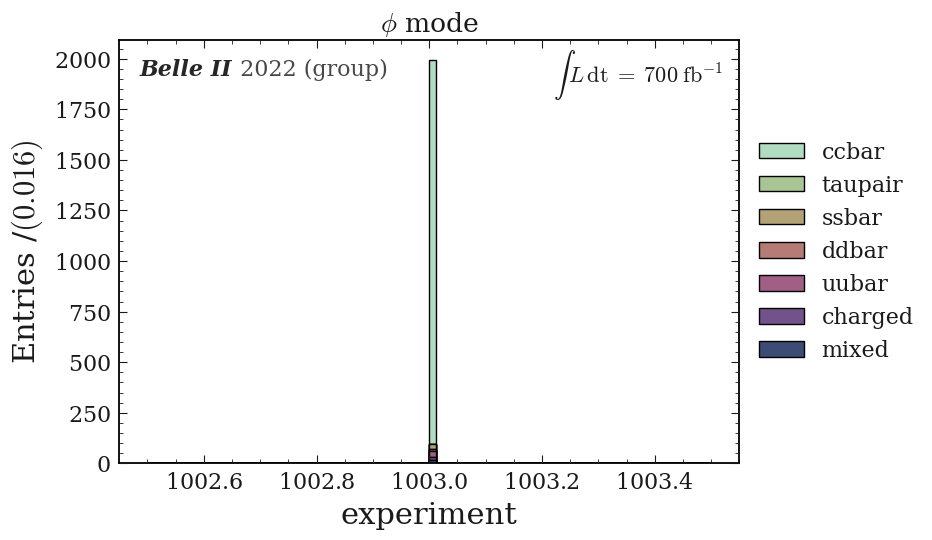

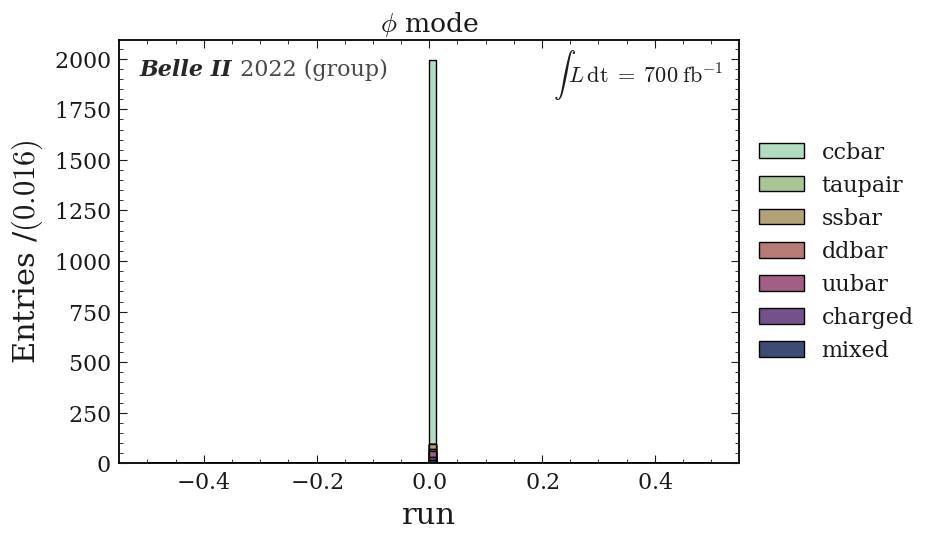

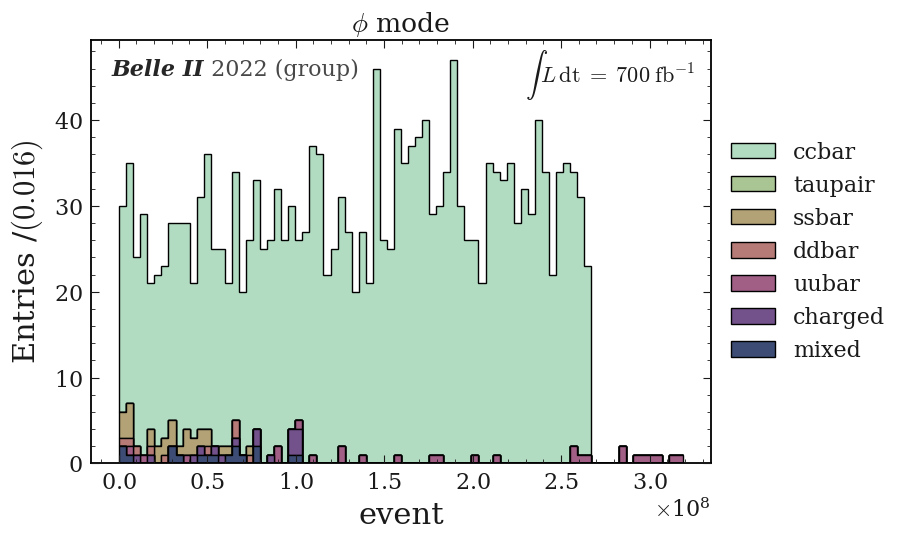

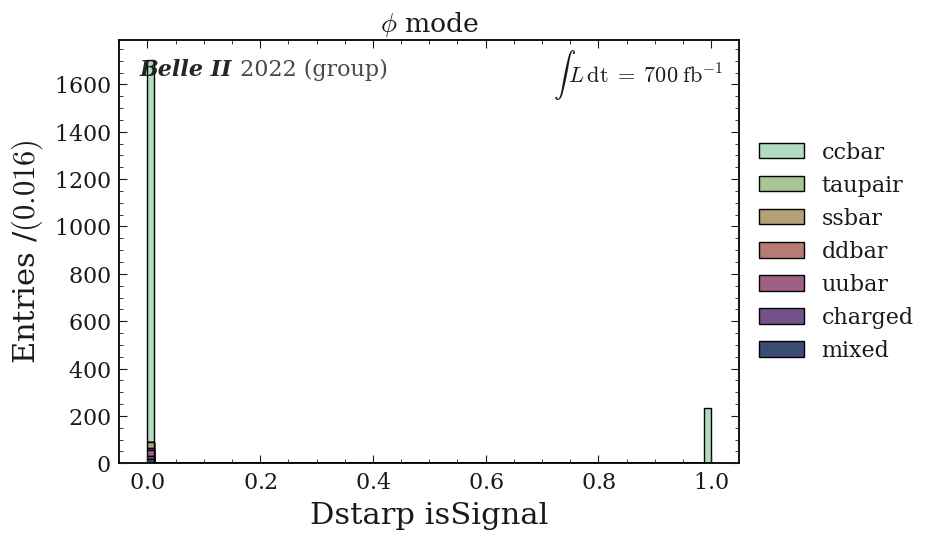

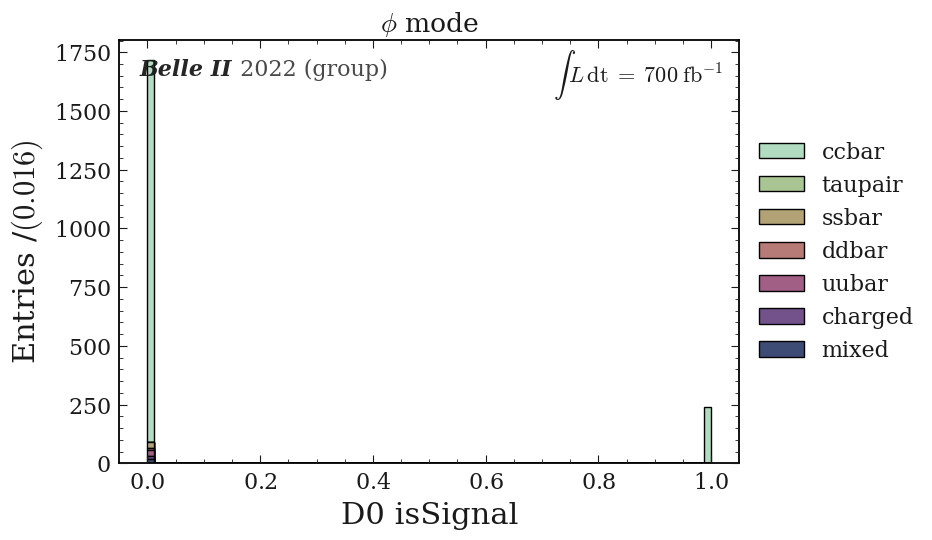

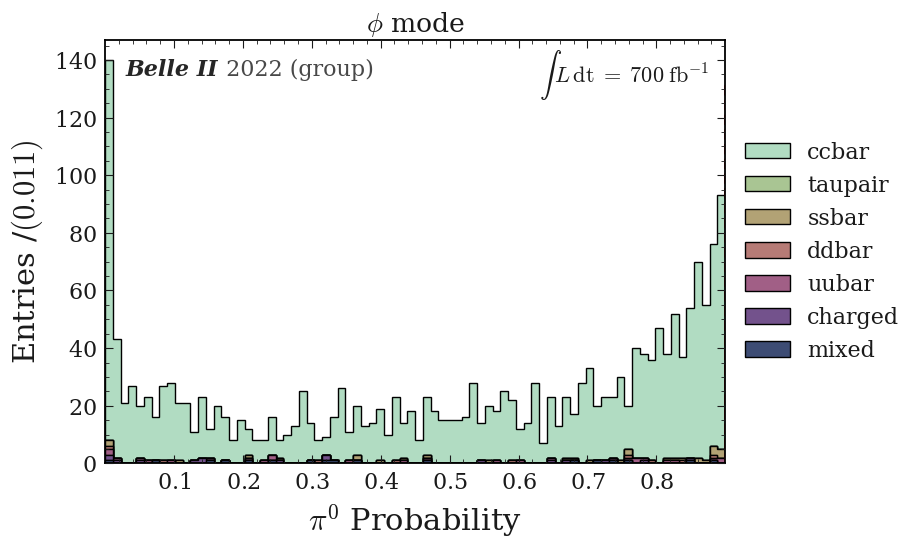

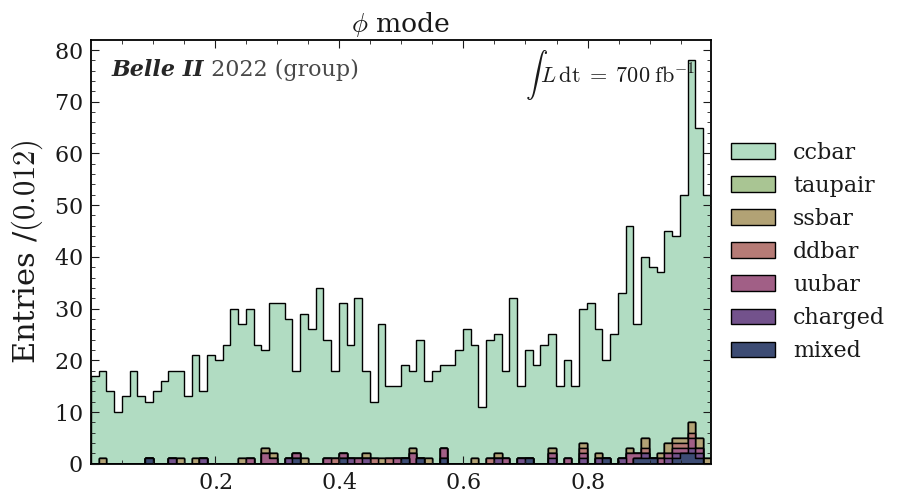

/home/jykim/workspace/DRAW/hist/draw_stack.py:319: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(data_merge_pd.min(), data_merge_pd.max())


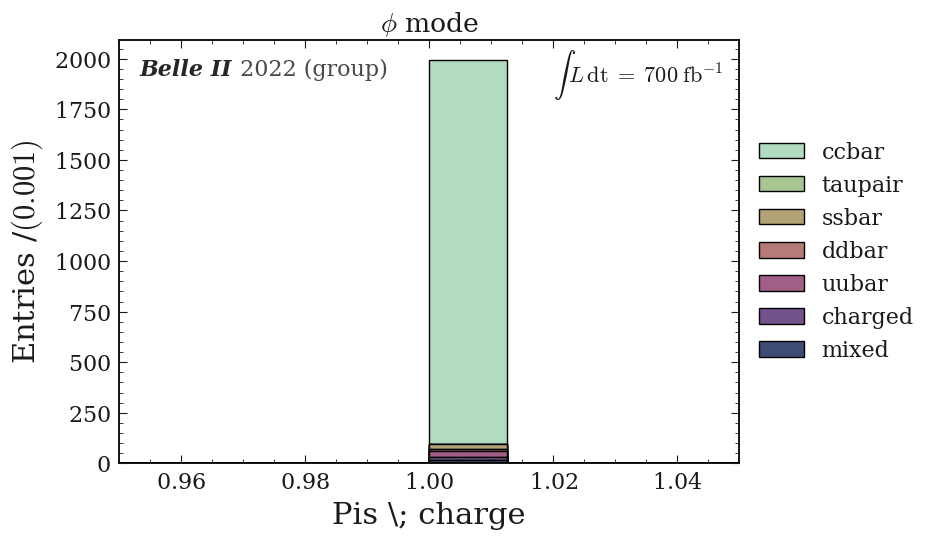

M(\phi)
$M(\phi) \; [\mathrm{GeV}]$


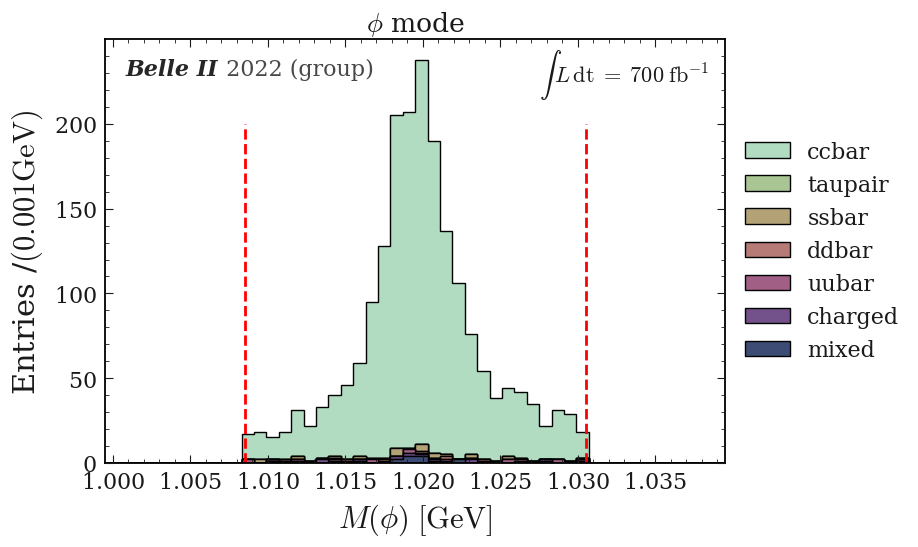

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [15]:
plot_title = r'$\phi$ mode'
var_unit_phi = read_yaml_to_dict("vars_name_units")

var_unit_phi = var_unit_phi['units']

var_name_phi = read_yaml_to_dict("vars_name_units")
var_name_phi = var_name_phi['name']


total_lumi="$700\; \mathrm{fb}^{-1}$"

draw_stack_no_signal(figname="test",df=pd_phi_D0,bins=80, vector='phi', var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi)            


(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


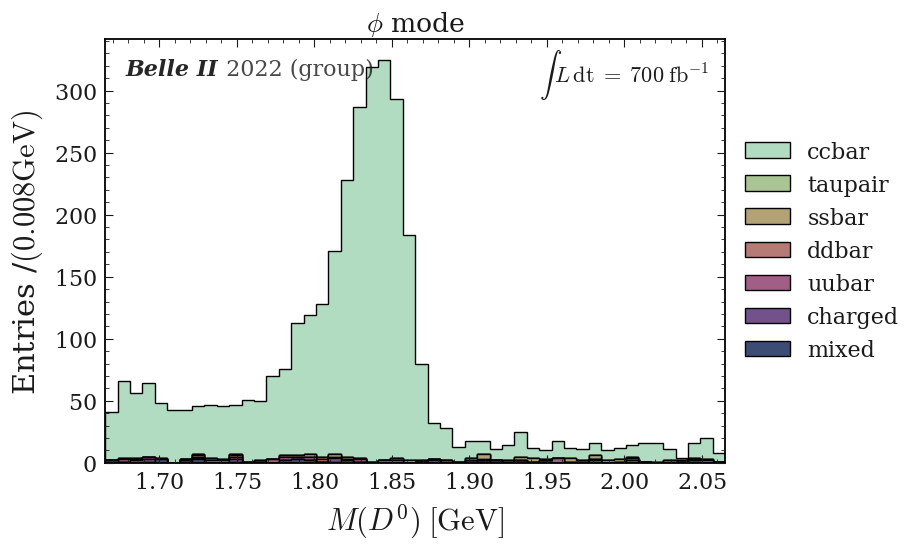

Q
$Q \; [\mathrm{GeV}]$


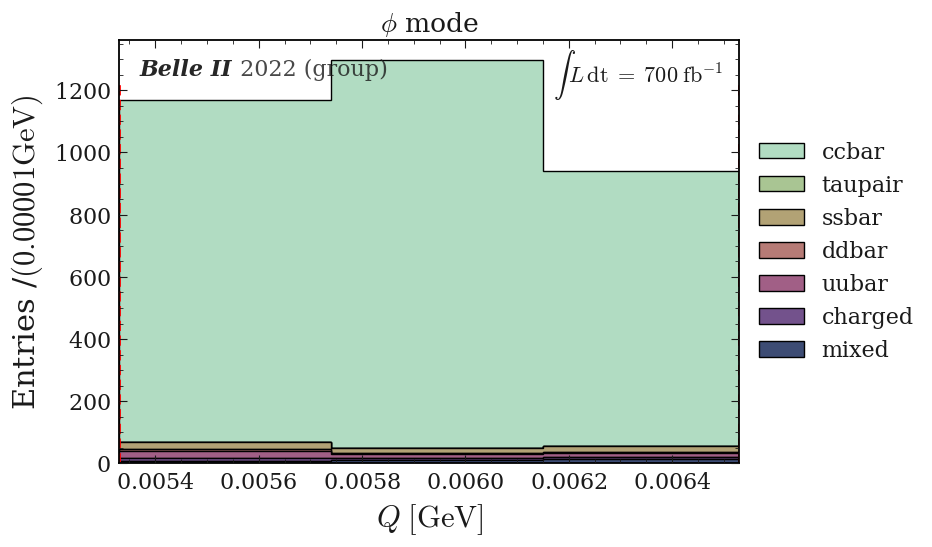

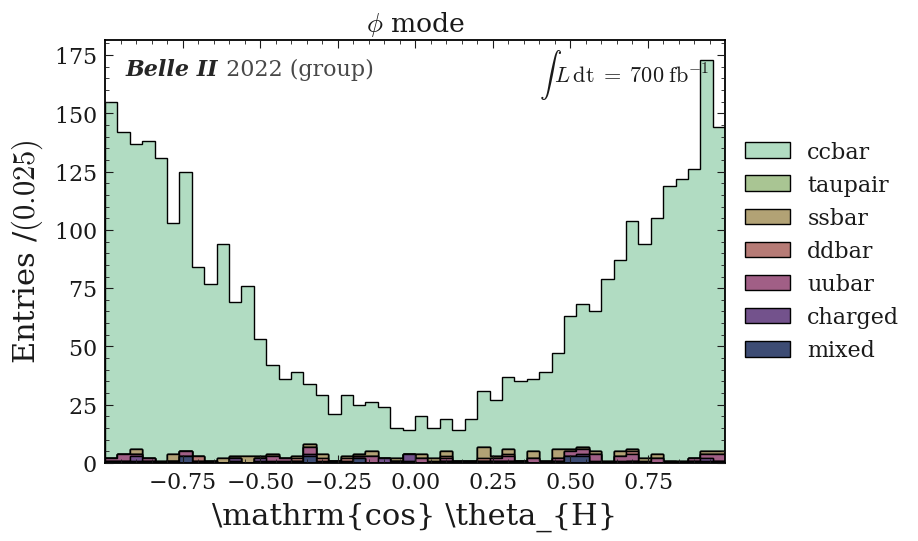

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


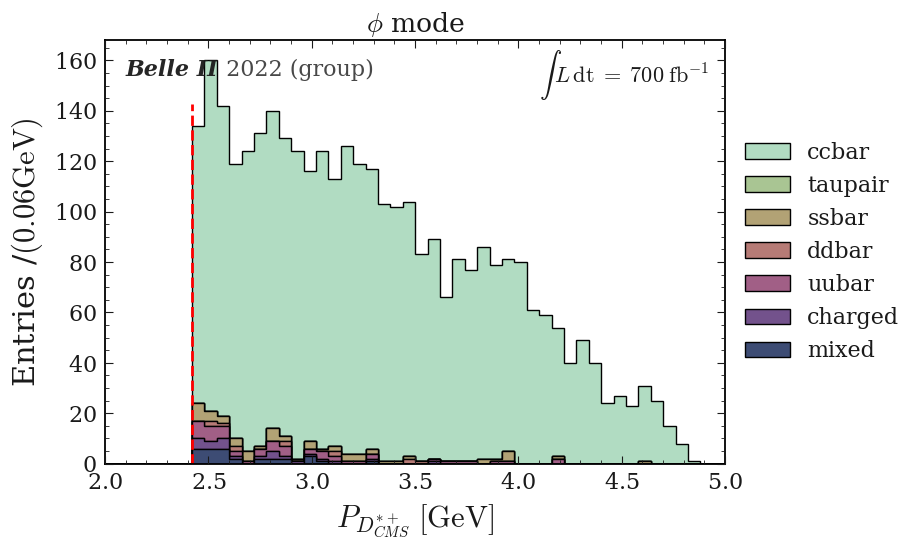

E_{\gamma}
$E_{\gamma} \; [\mathrm{GeV}]$


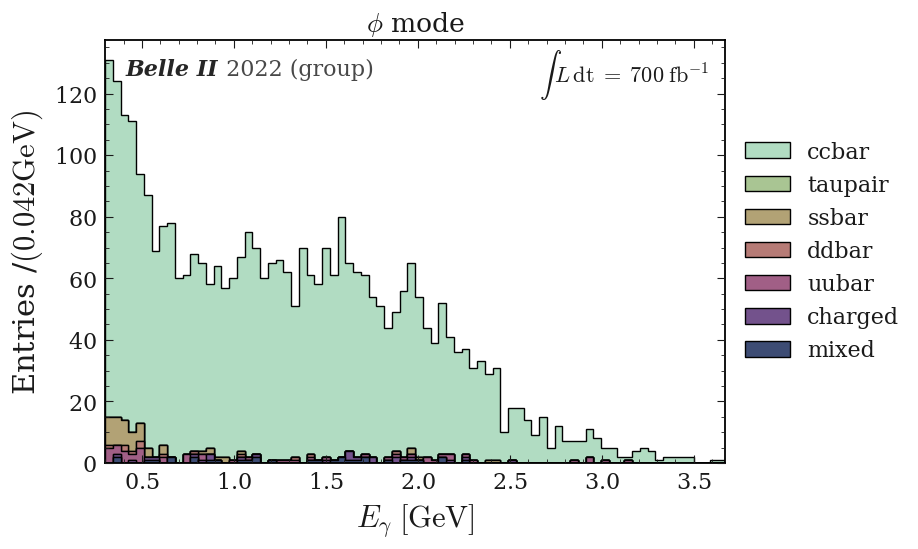

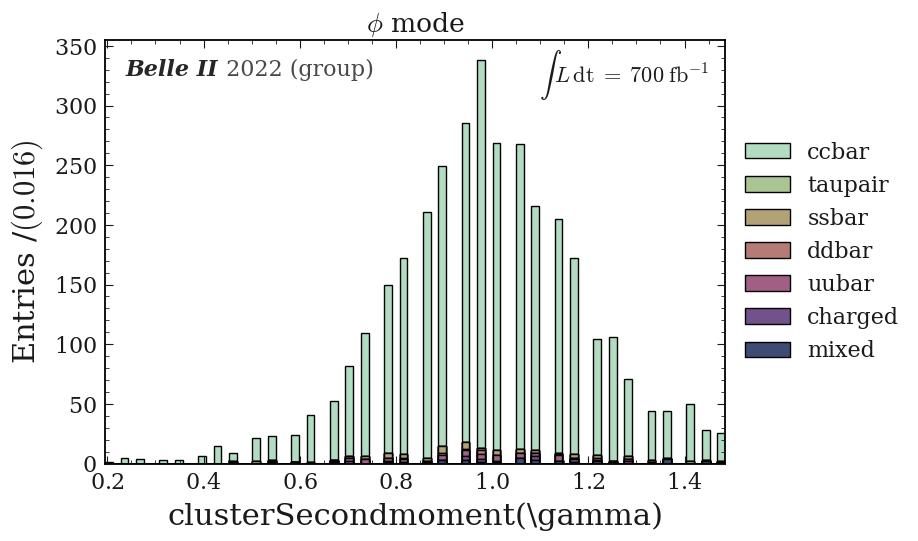

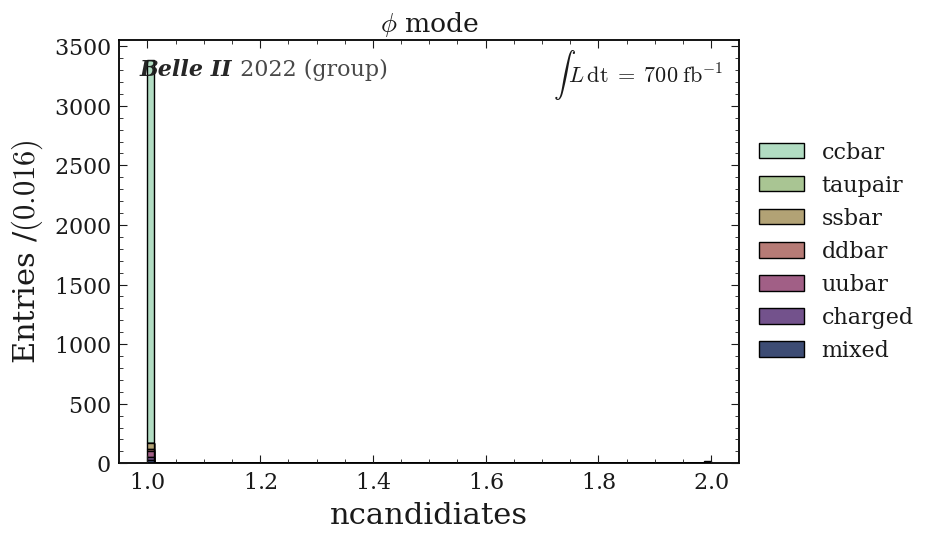

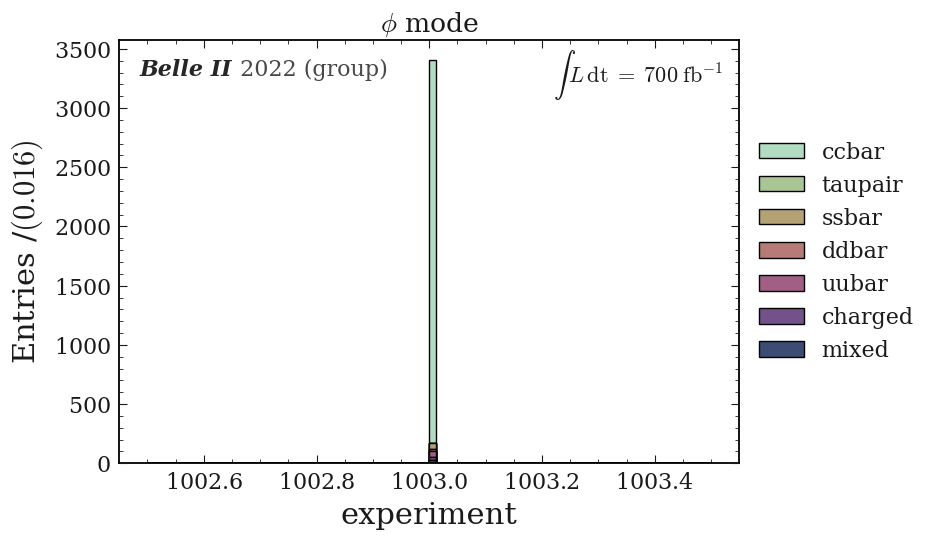

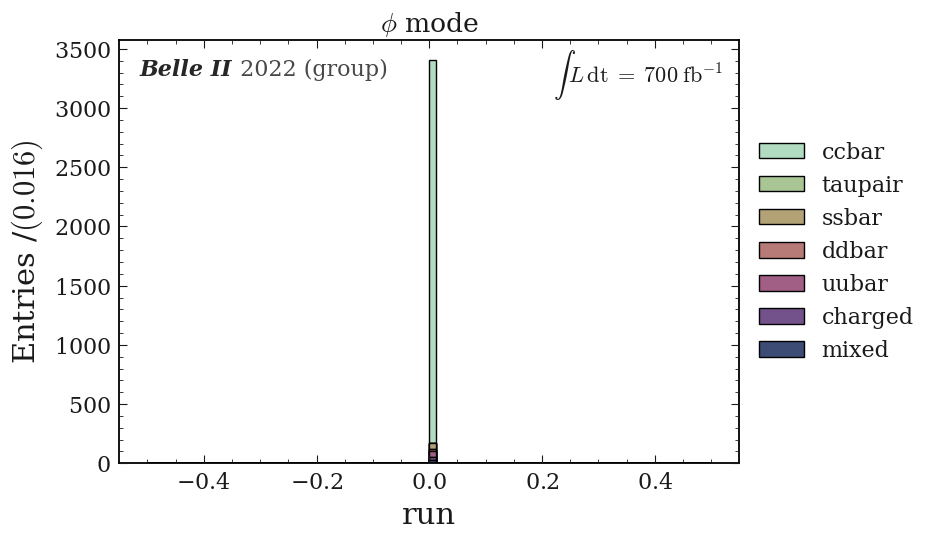

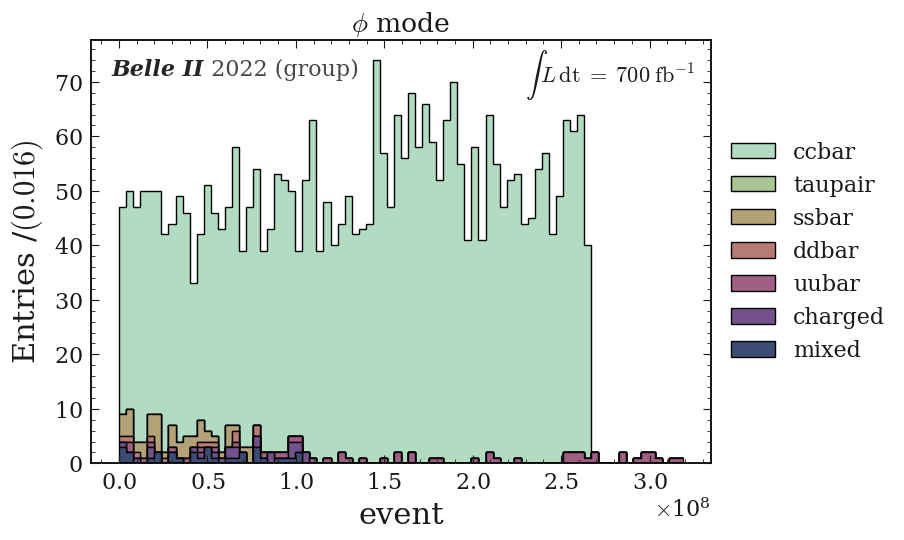

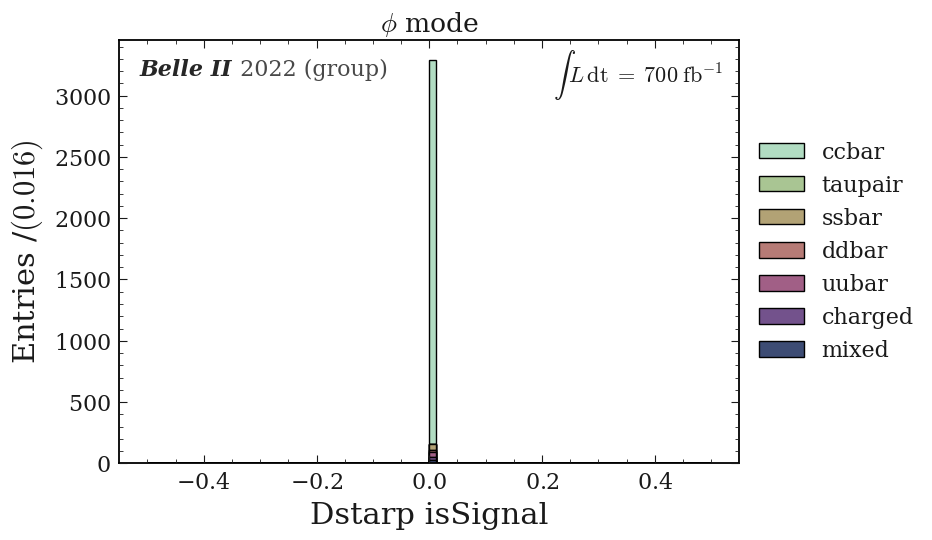

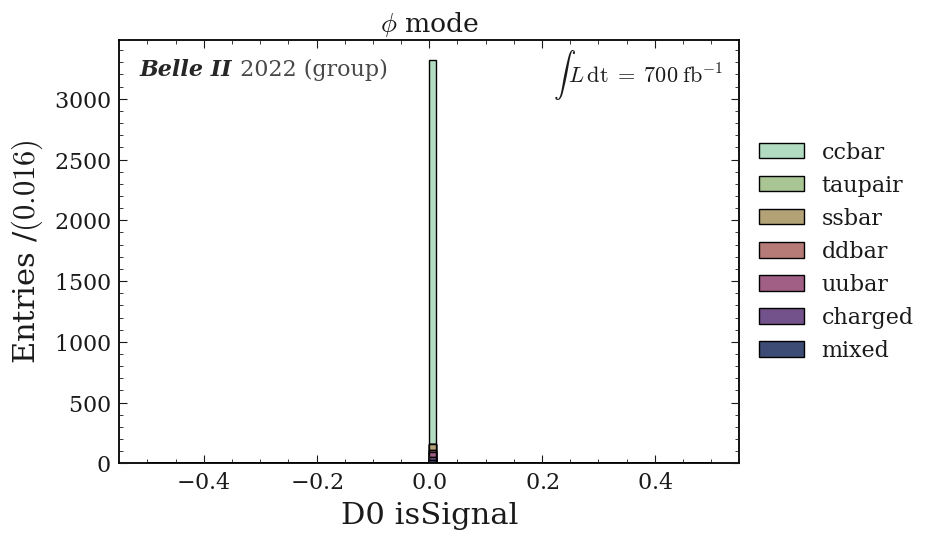

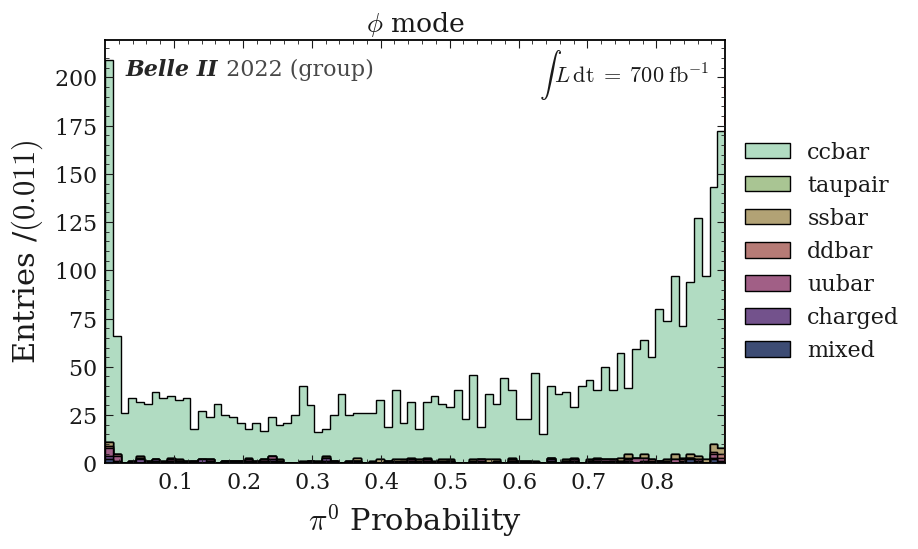

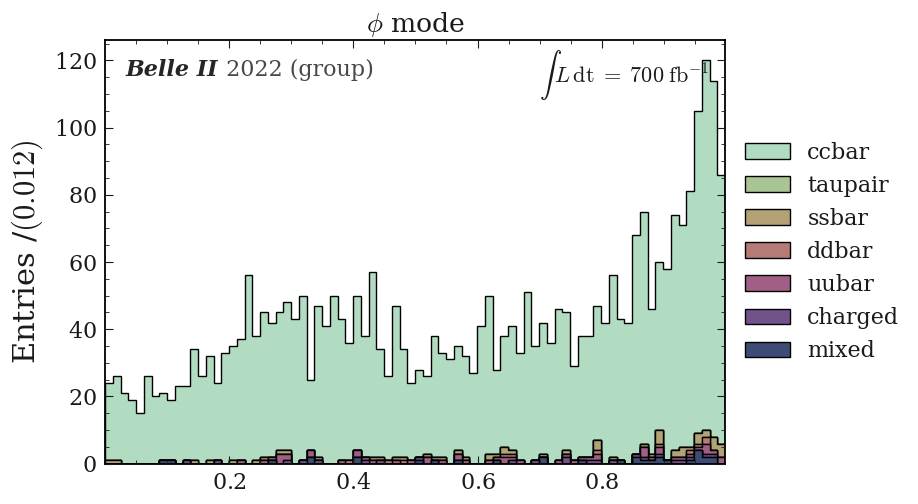

M(\phi)
$M(\phi) \; [\mathrm{GeV}]$


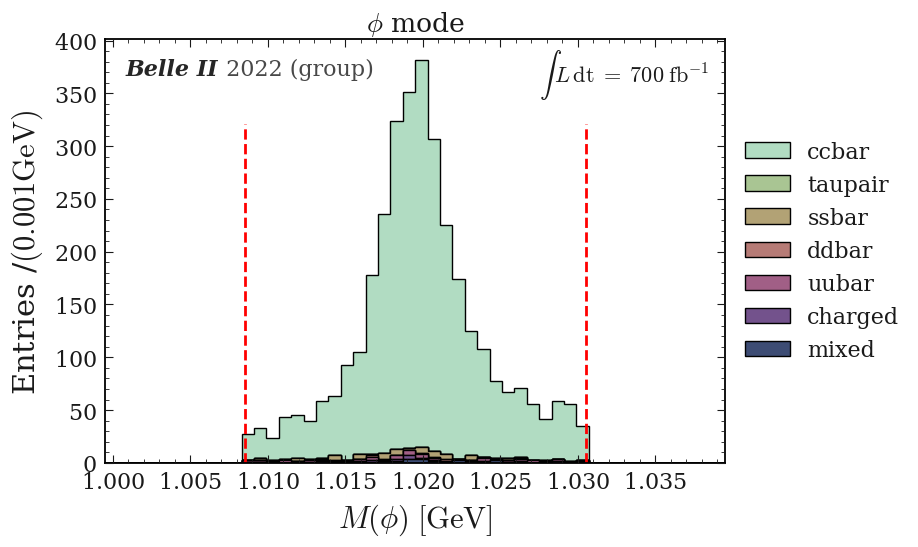

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [23]:
plot_title = r'$\phi$ mode'
var_unit_phi = read_yaml_to_dict("vars_name_units")

var_unit_phi = var_unit_phi['units']

var_name_phi = read_yaml_to_dict("vars_name_units")
var_name_phi = var_name_phi['name']


total_lumi="$700\; \mathrm{fb}^{-1}$"

draw_stack_no_signal(figname="test",df=pd_phi,bins=80, vector='phi', var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi)            


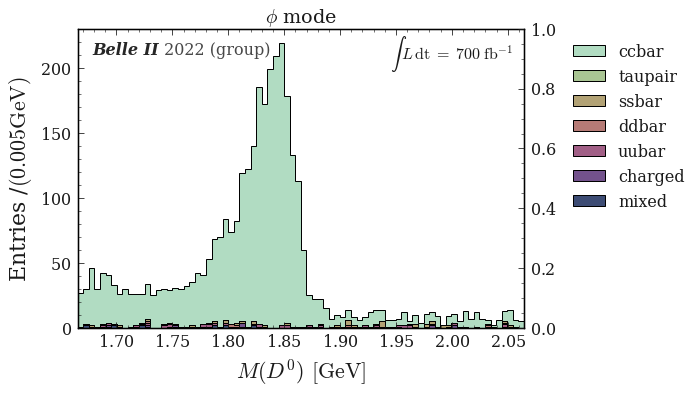

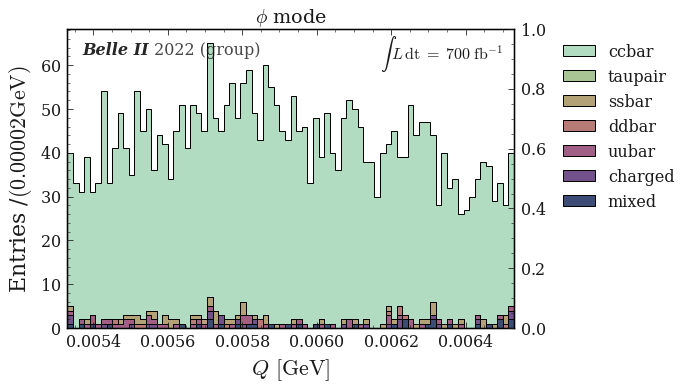

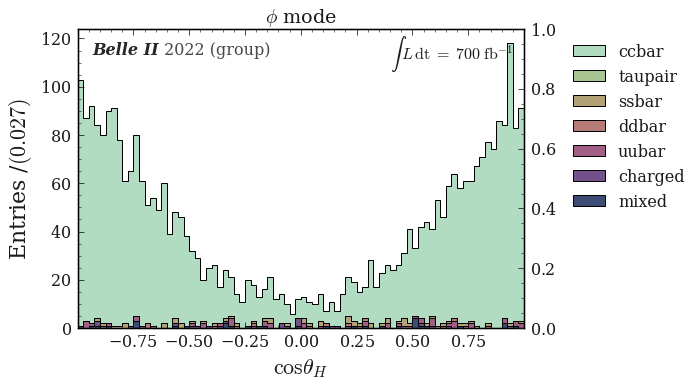

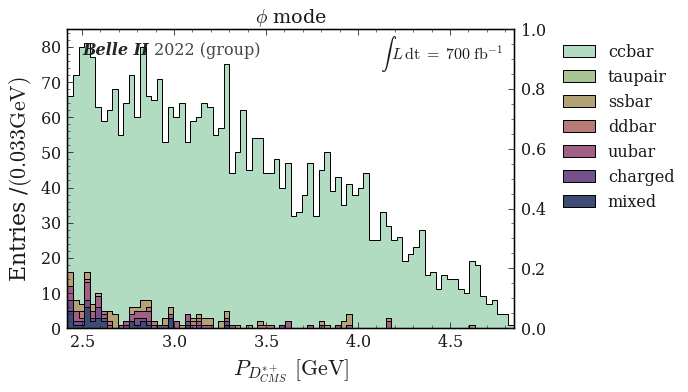

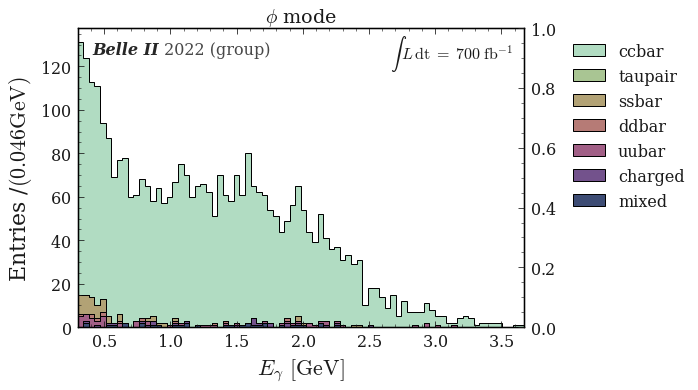

...

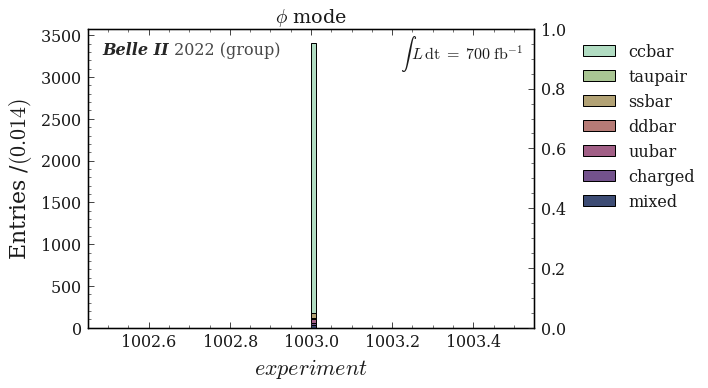

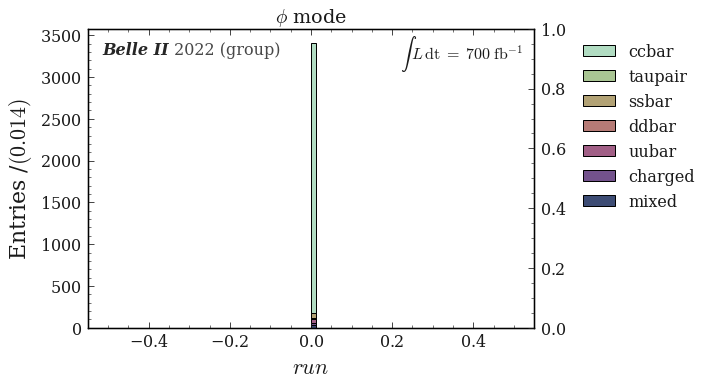

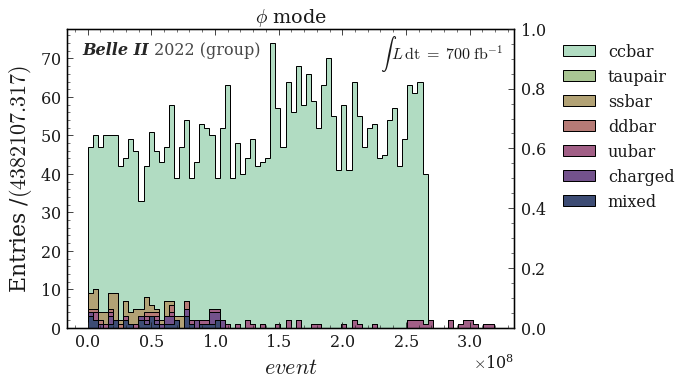

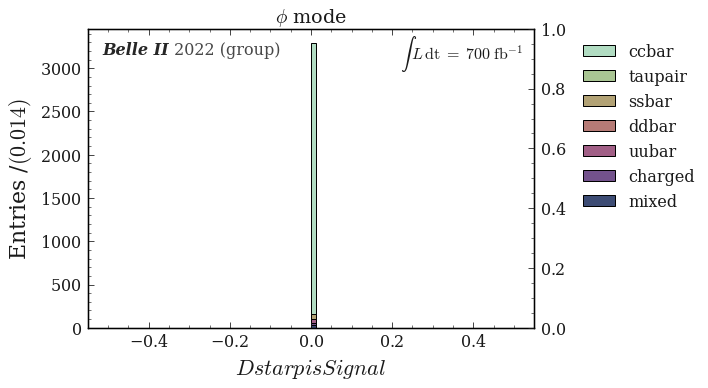

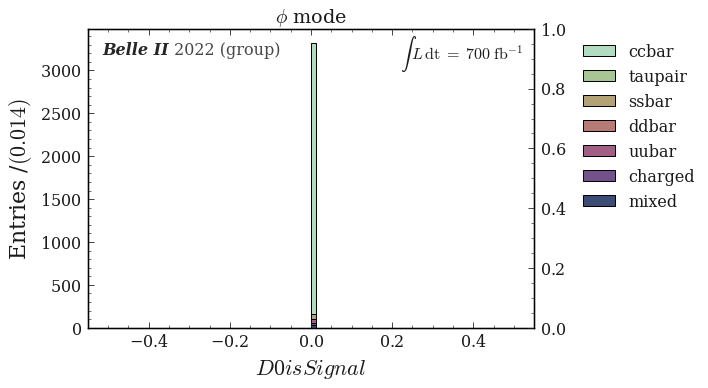

ValueError: 
$$
^
Expected end of text, found '$'  (at char 0), (line:1, col:1)

<Figure size 576x396 with 2 Axes>

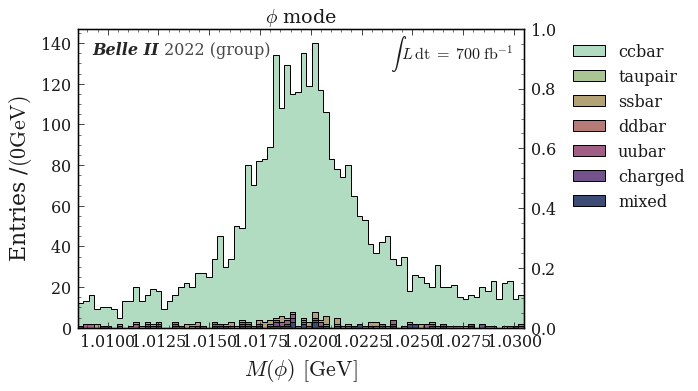

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 576x396 with 0 Axes>

In [13]:
plot_title = r'$\phi$ mode'
var_unit_phi = read_yaml_to_dict("vars_name_units")

var_unit_phi = var_unit_phi['units']

var_name_phi = read_yaml_to_dict("vars_name_units")
var_name_phi = var_name_phi['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"
draw_stack_no_signal(df=pd_phi[pd_phi['Pi0_Prob']<0.9],bins=80, vector='phi', var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi)            


## rho

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


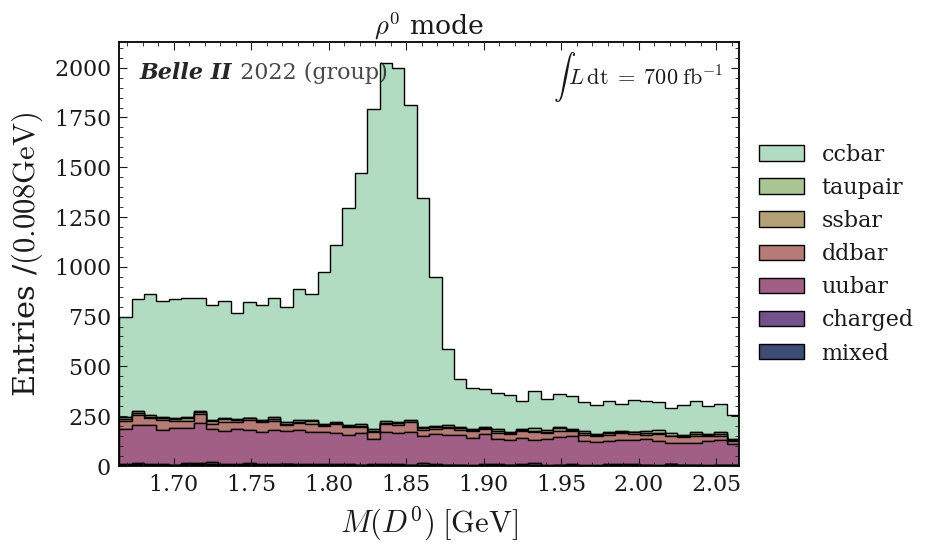

Q
$Q \; [\mathrm{GeV}]$


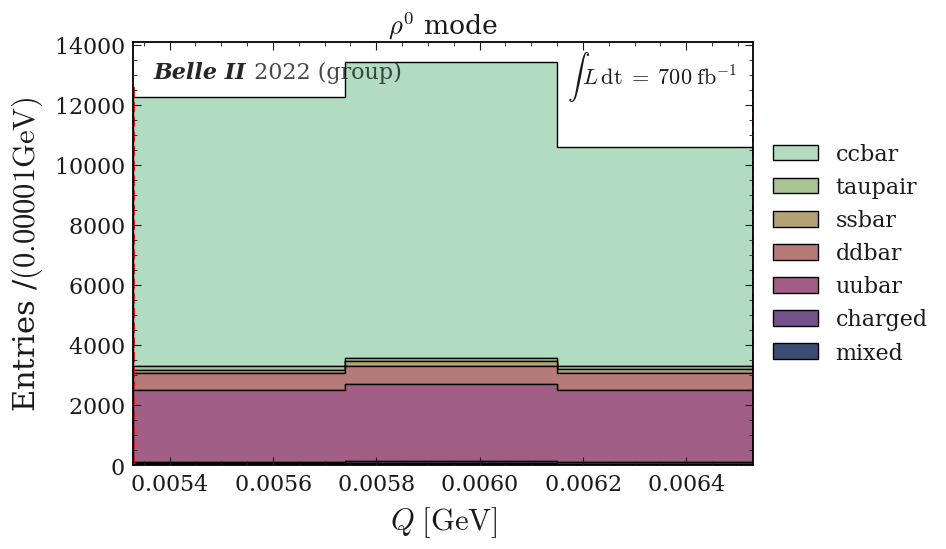

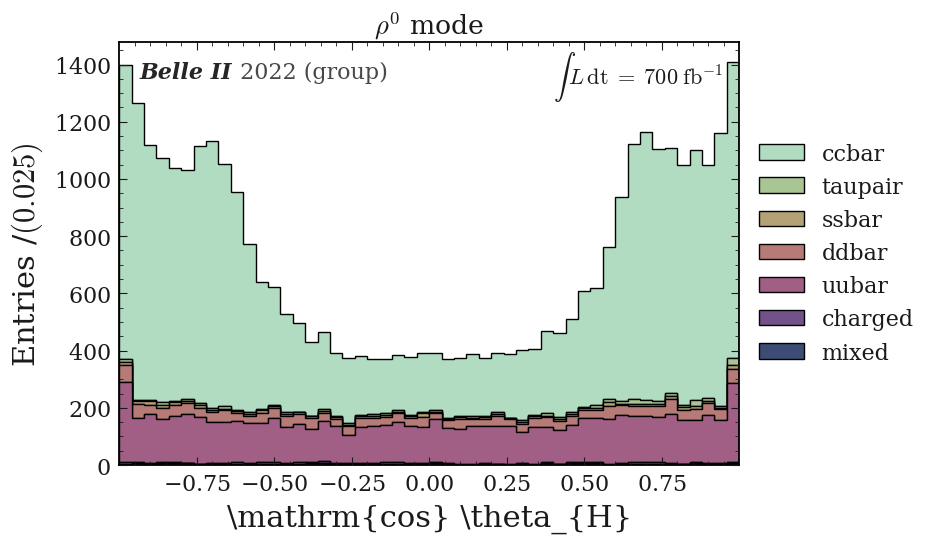

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


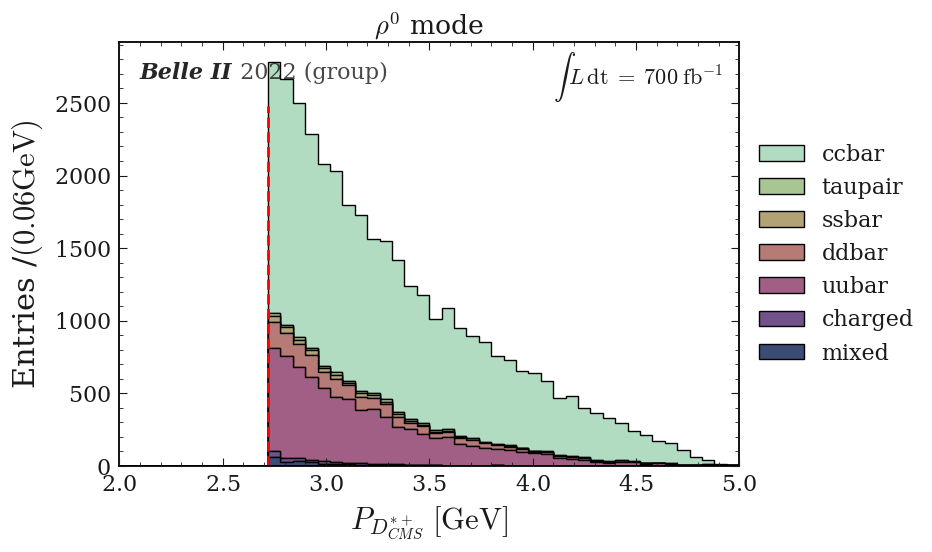

E_{\gamma}
$E_{\gamma} \; [\mathrm{GeV}]$


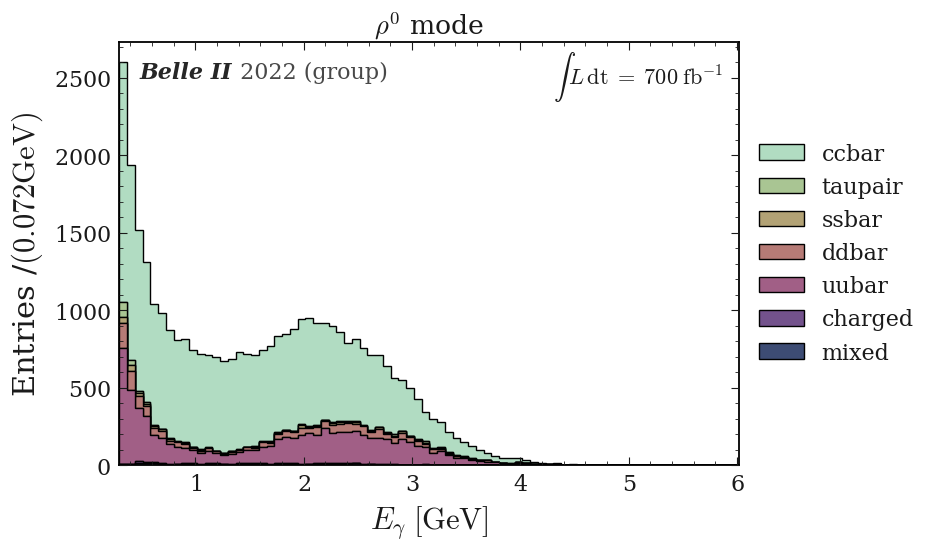

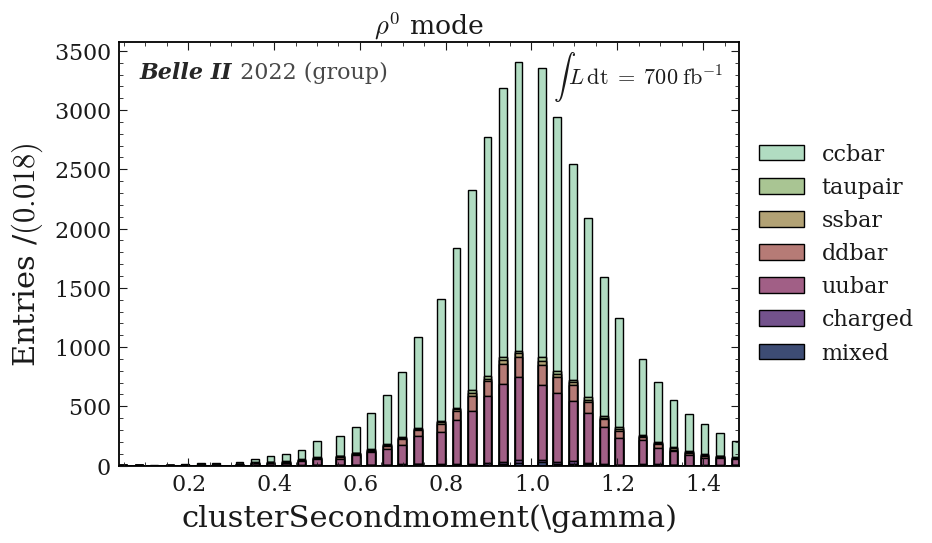

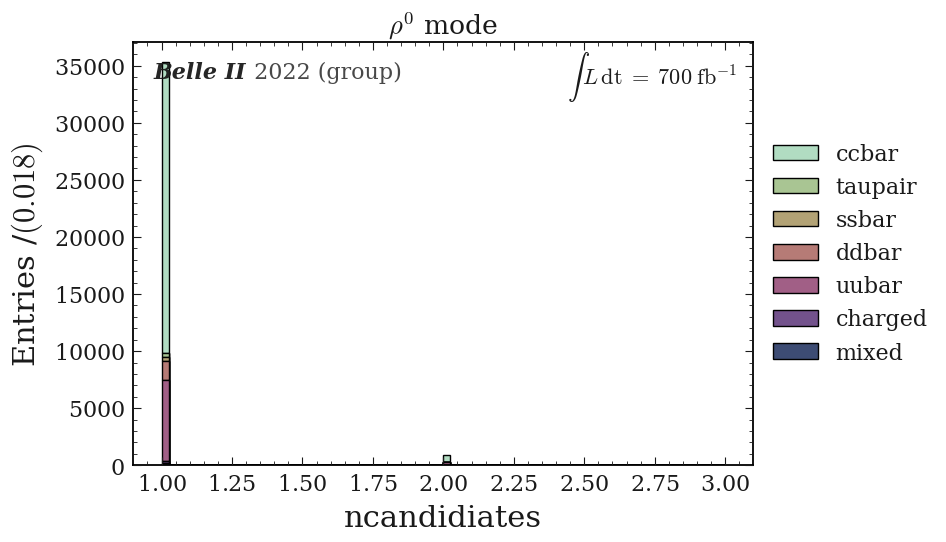

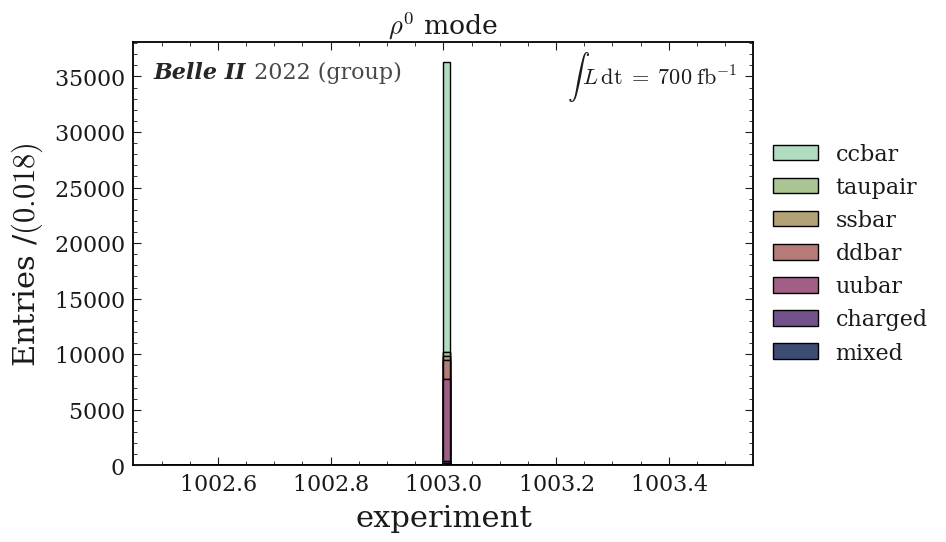

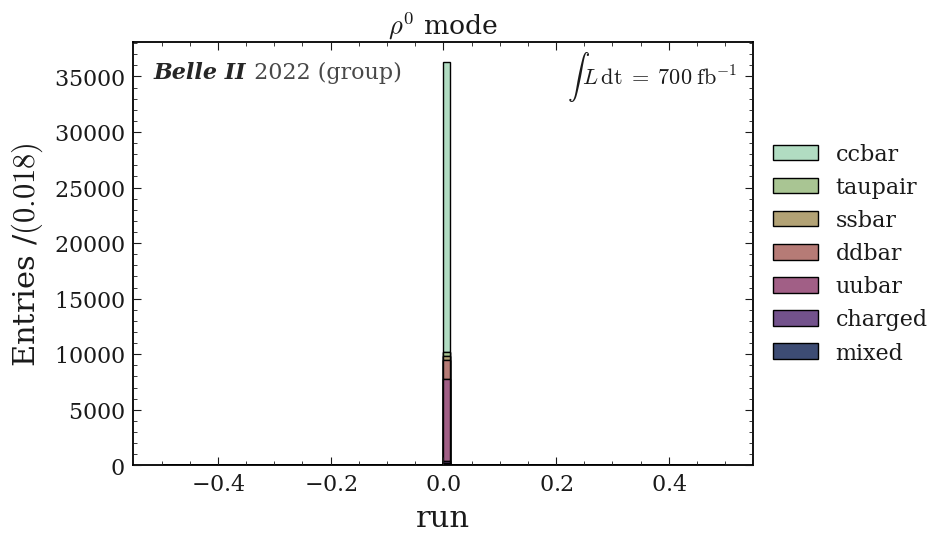

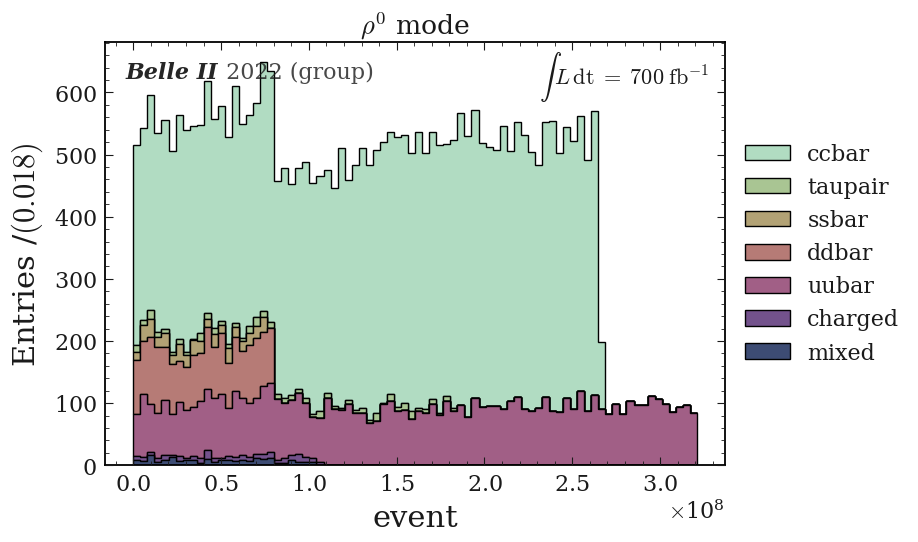

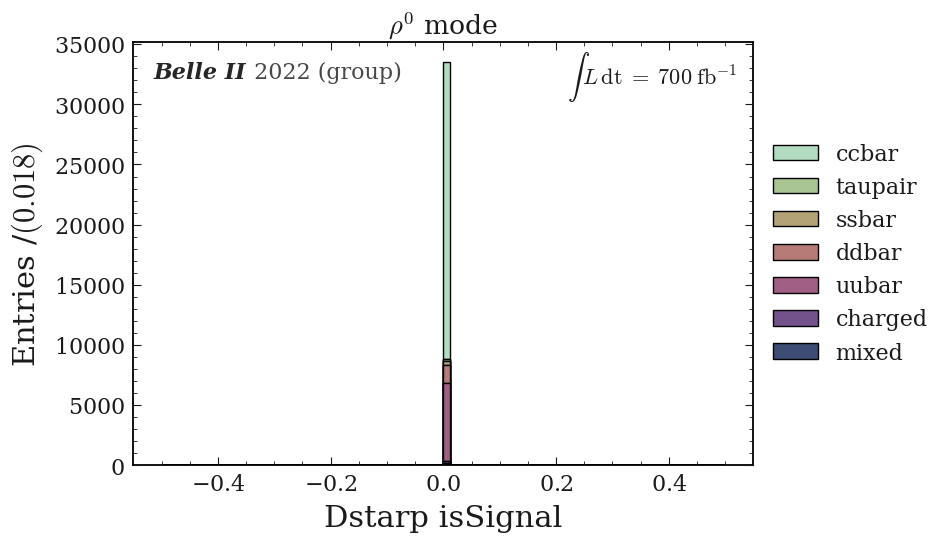

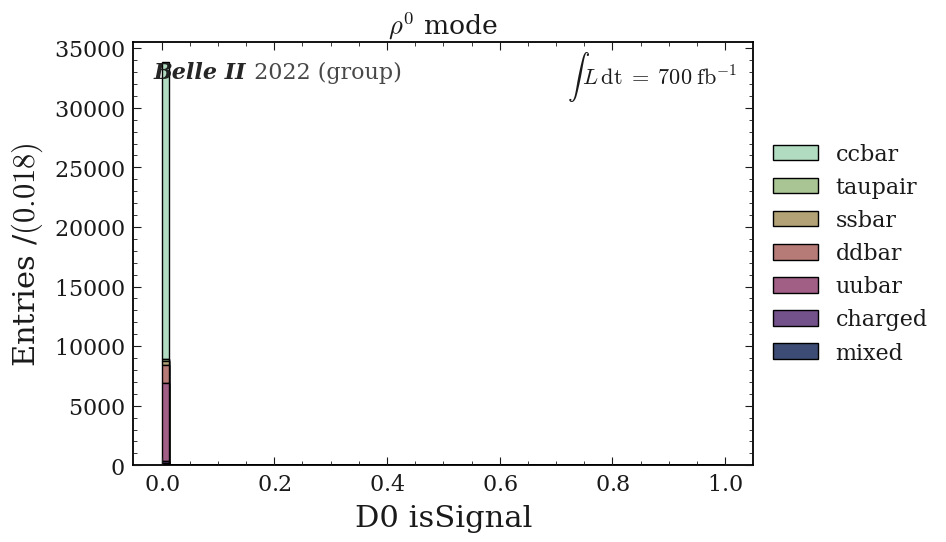

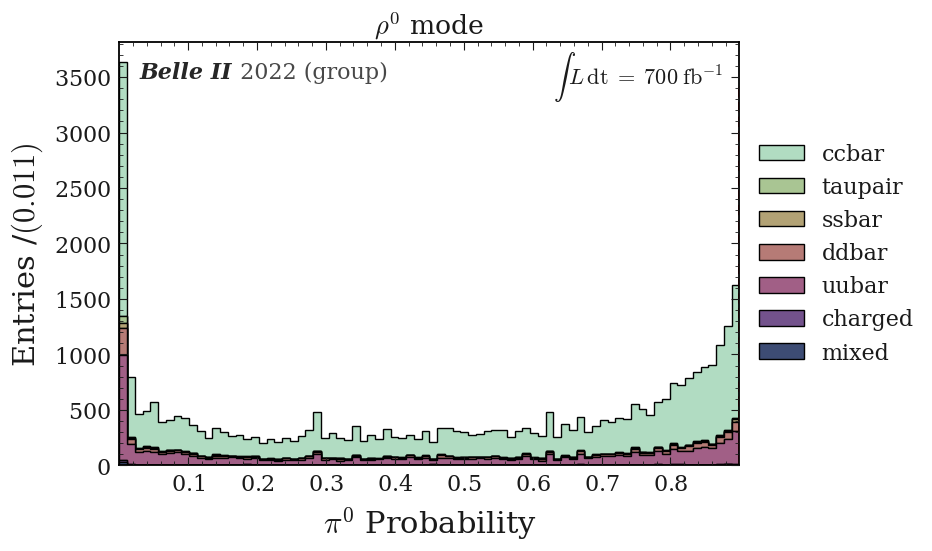

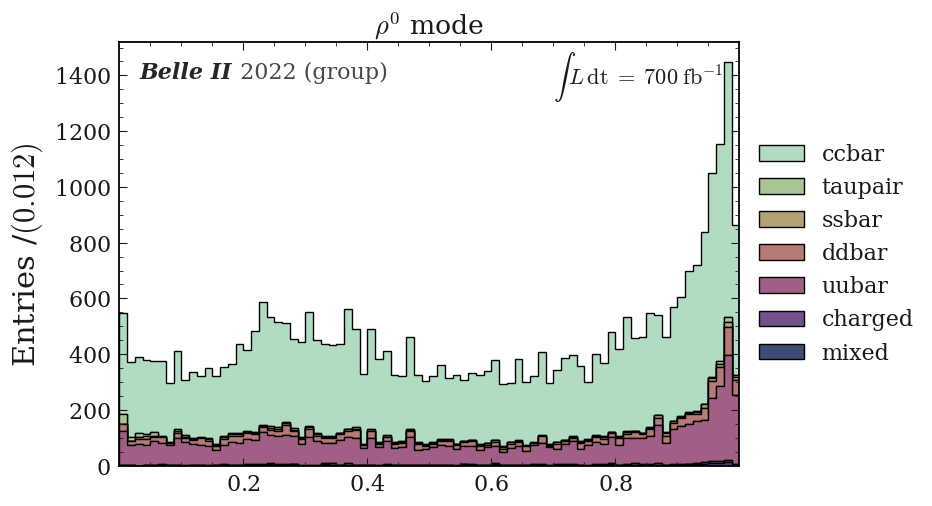

M(rho^0)
$M(\rho^0) \; [\mathrm{GeV}]$


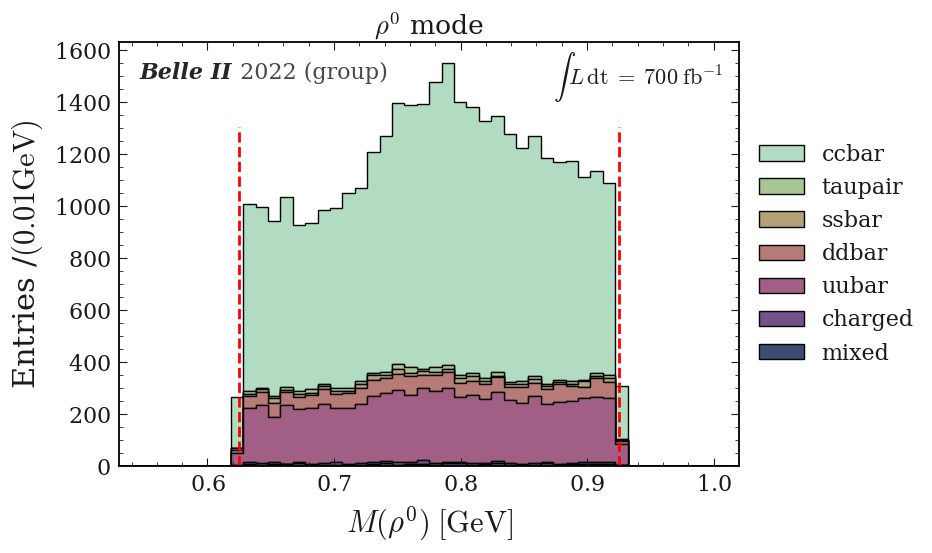

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [52]:
plot_title = r'$\rho^0$ mode'
var_unit= read_yaml_to_dict("vars_name_units")

var_unit= var_unit['units']

var_name= read_yaml_to_dict("vars_name_units")
var_name= var_name['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"
draw_stack_no_signal(figname="test",df=pd_rho,bins=80, vector='rho', var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            


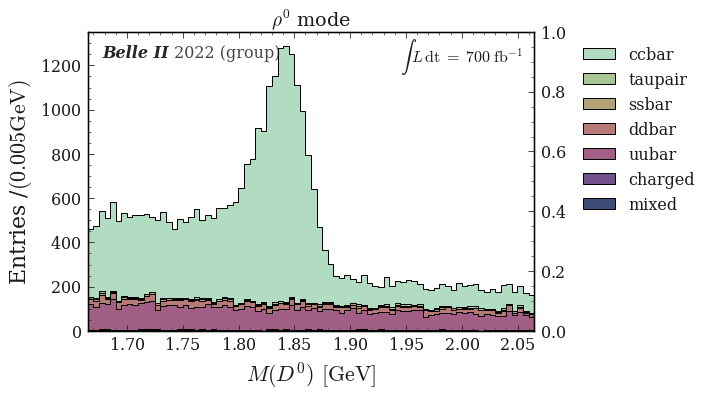

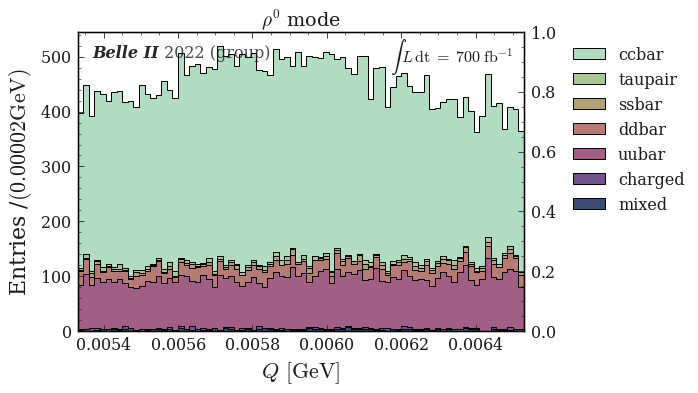

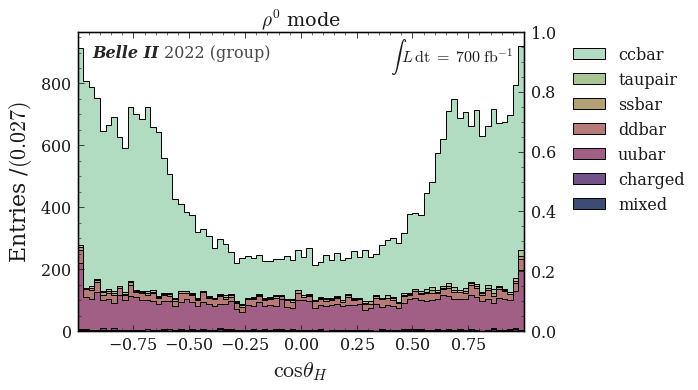

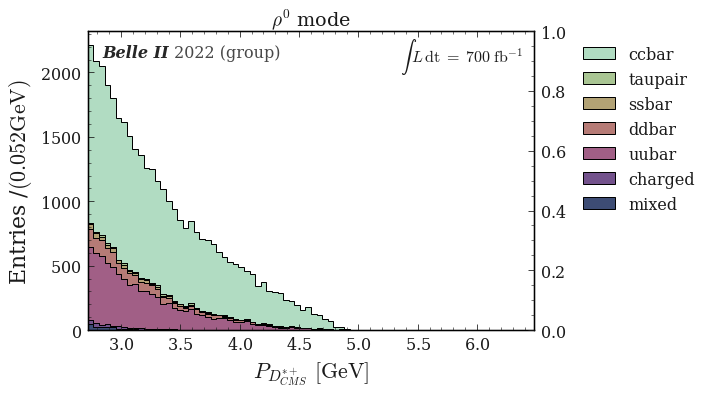

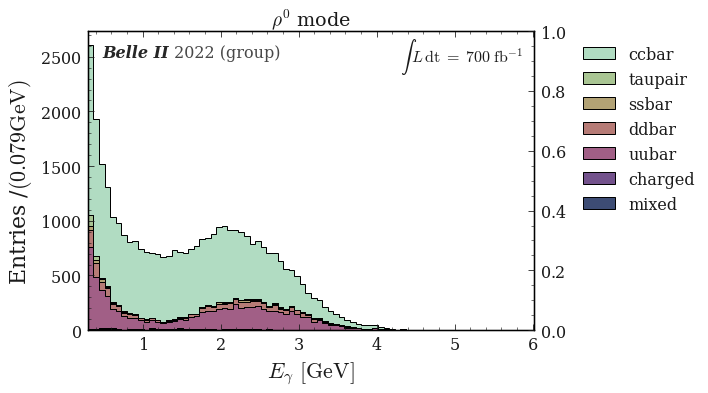

...

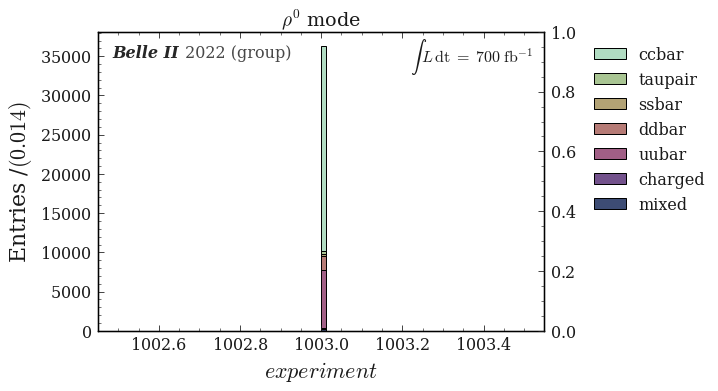

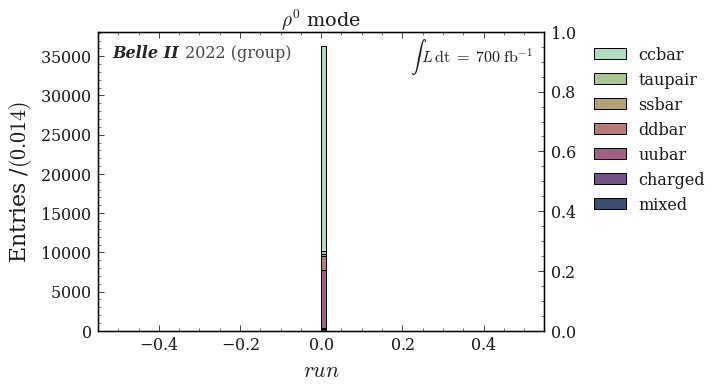

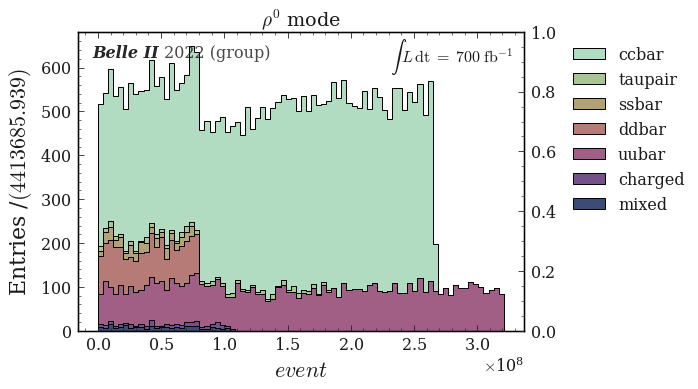

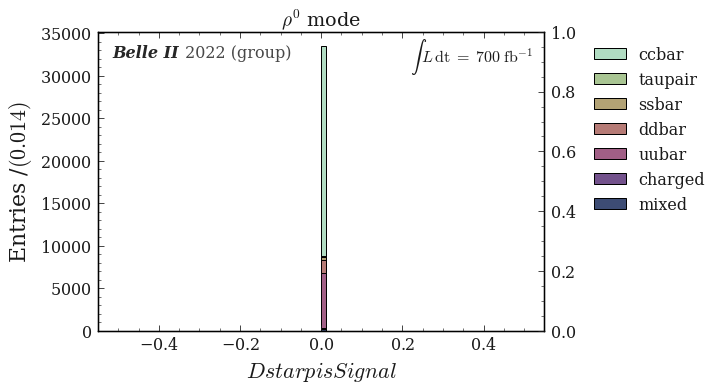

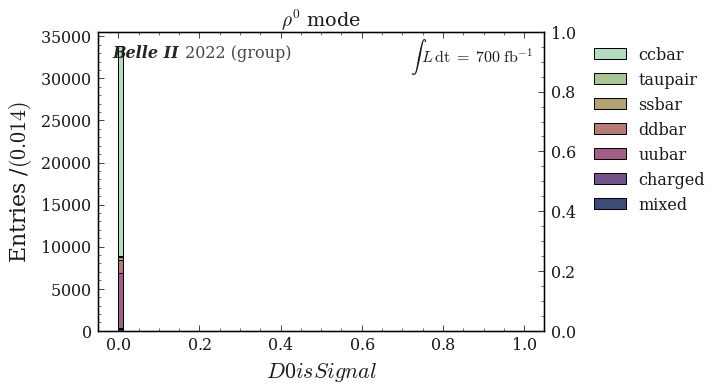

ValueError: 
$$
^
Expected end of text, found '$'  (at char 0), (line:1, col:1)

<Figure size 576x396 with 2 Axes>

ValueError: 
$M(ho^0)$ $[\mathrm{GeV}]$
^
Expected end of text, found '$'  (at char 0), (line:1, col:1)

<Figure size 576x396 with 2 Axes>

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 576x396 with 0 Axes>

In [39]:
plot_title = r'$\rho^0$ mode'
var_unit_phi = read_yaml_to_dict("vars_name_units")

var_unit_phi = var_unit_phi['units']

var_name_phi = read_yaml_to_dict("vars_name_units")
var_name_phi = var_name_phi['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"
draw_stack_no_signal(df=pd_rho[pd_rho['Pi0_Prob']<0.9 ],bins=80, vector='rho', var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi)            


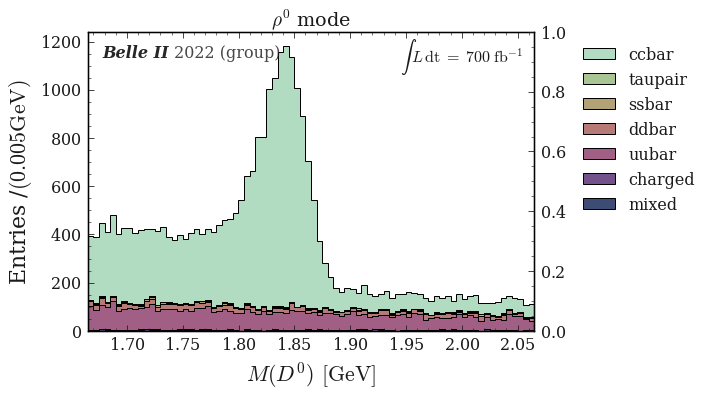

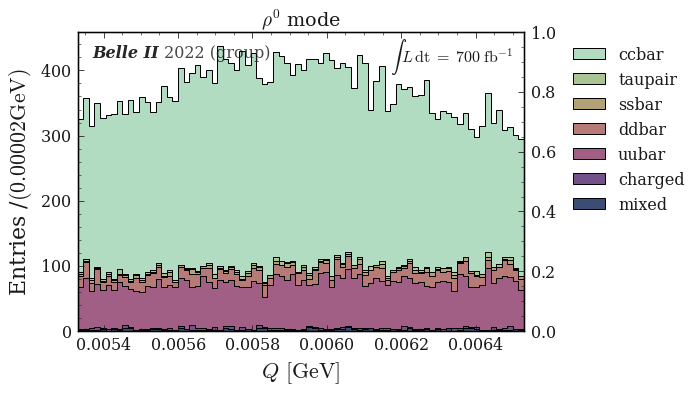

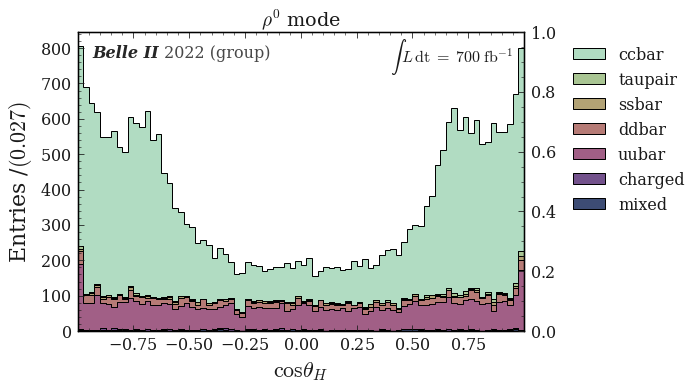

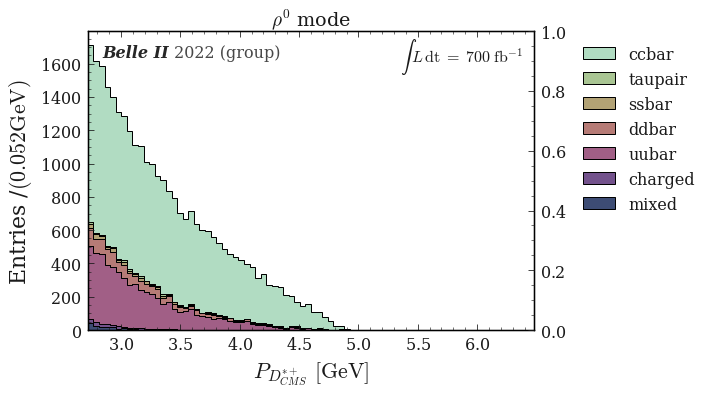

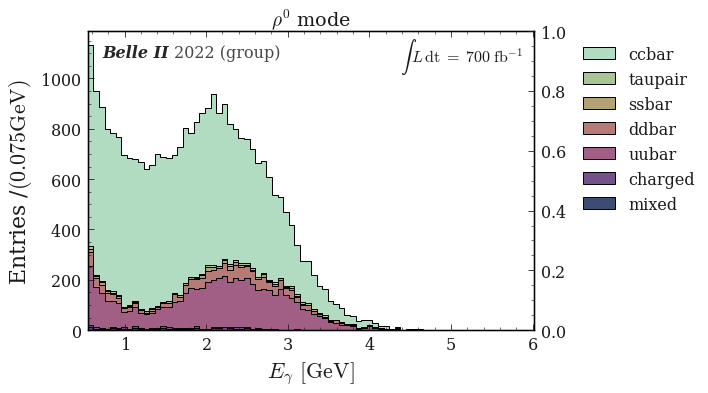

...

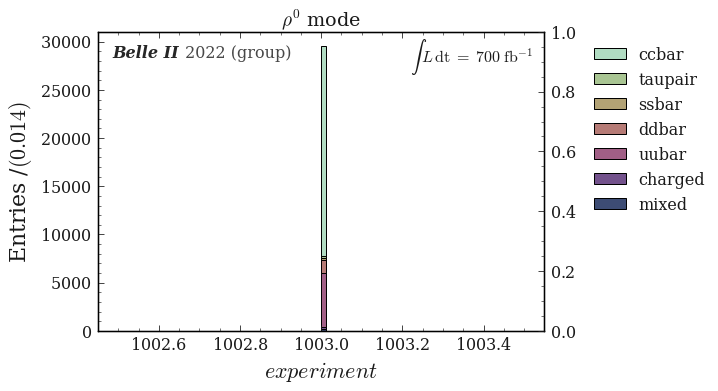

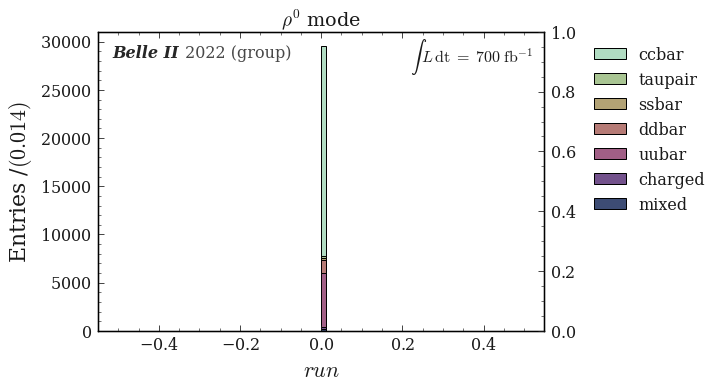

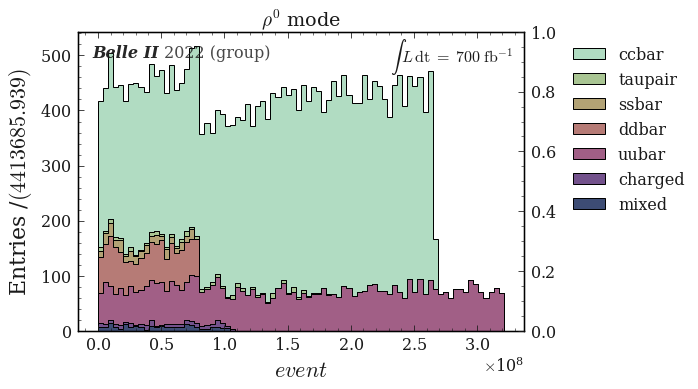

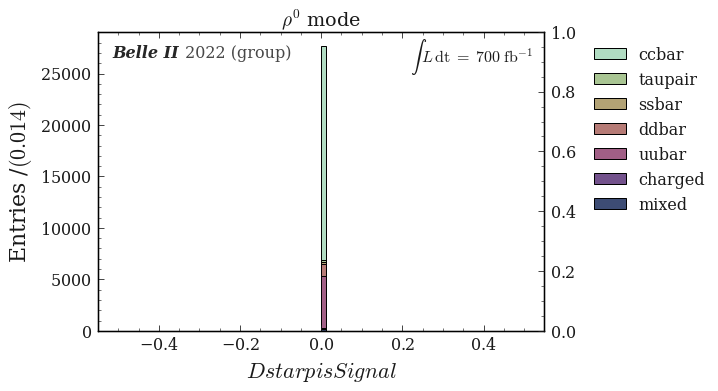

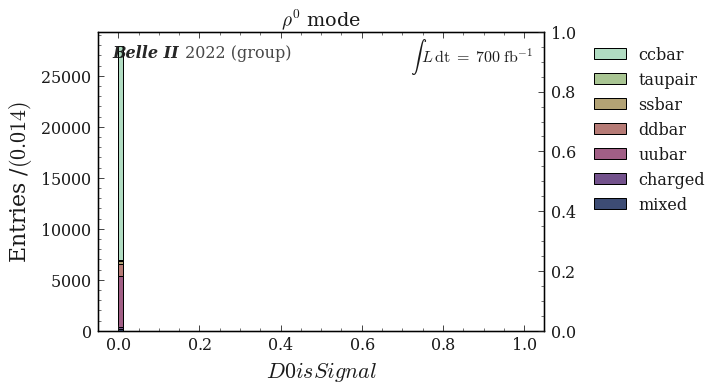

ValueError: 
$$
^
Expected end of text, found '$'  (at char 0), (line:1, col:1)

<Figure size 576x396 with 2 Axes>

ValueError: 
$M(ho^0)$ $[\mathrm{GeV}]$
^
Expected end of text, found '$'  (at char 0), (line:1, col:1)

<Figure size 576x396 with 2 Axes>

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 576x396 with 0 Axes>

In [52]:
plot_title = r'$\rho^0$ mode'
var_unit_phi = read_yaml_to_dict("vars_name_units")

var_unit_phi = var_unit_phi['units']

var_name_phi = read_yaml_to_dict("vars_name_units")
var_name_phi = var_name_phi['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"
draw_stack_no_signal(df=pd_rho[(pd_rho['Pi0_Prob']<0.9) &  (pd_rho['gamma_E']>0.55) ],bins=80, vector='rho', var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi)            


## antiKstar

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


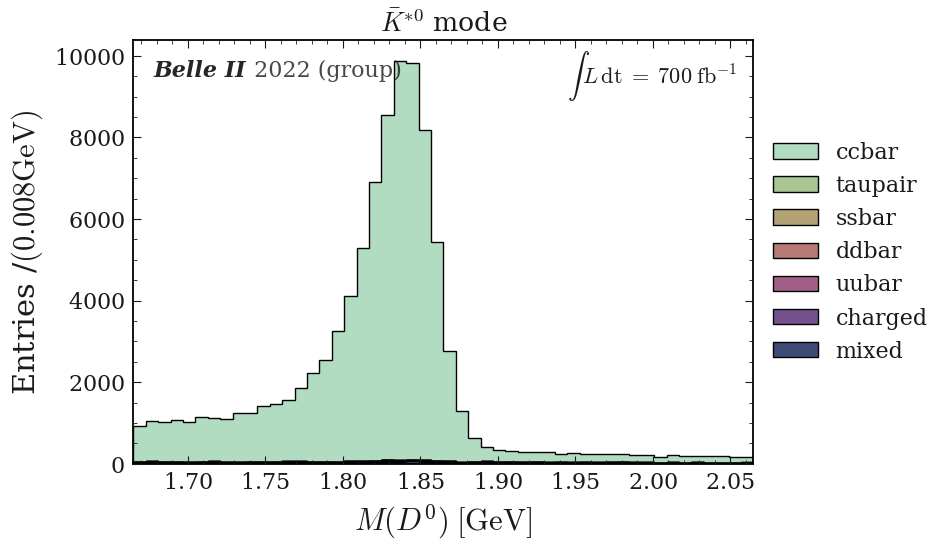

Q
$Q \; [\mathrm{GeV}]$


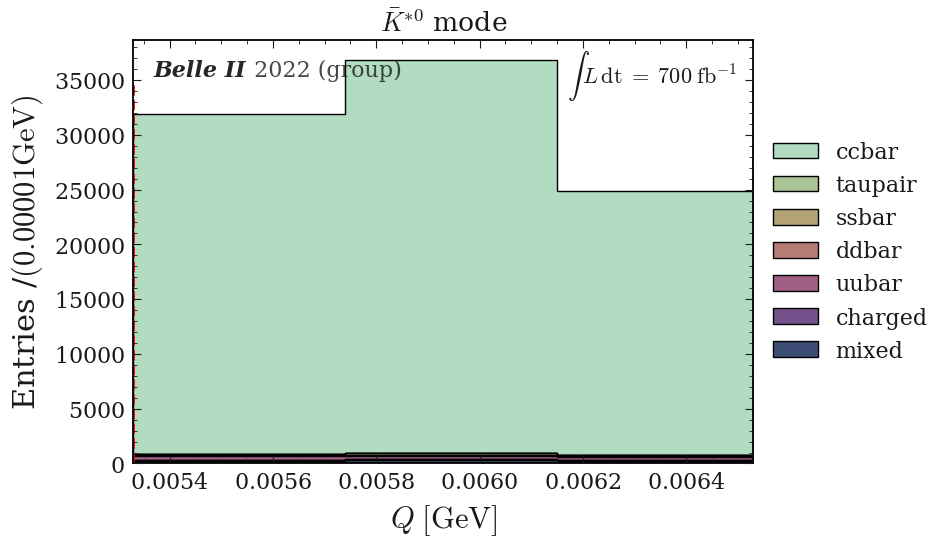

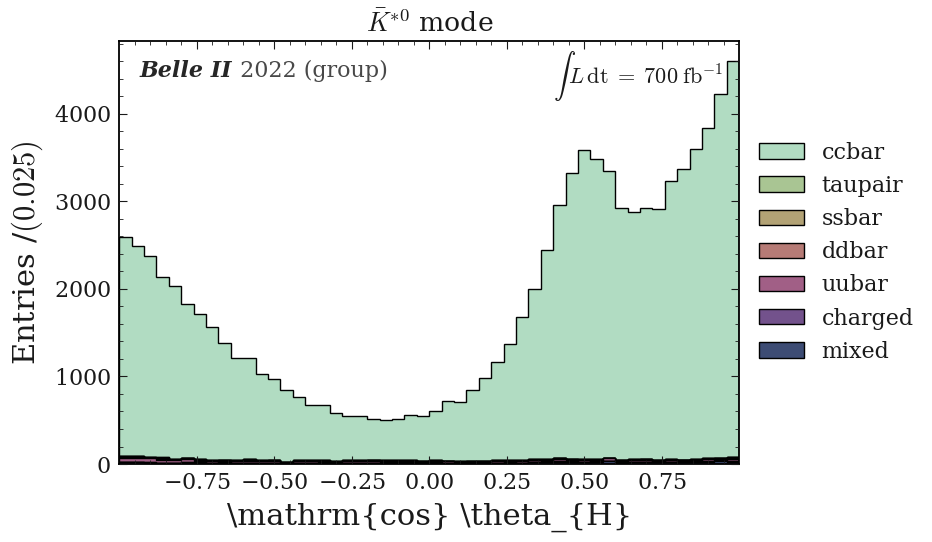

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


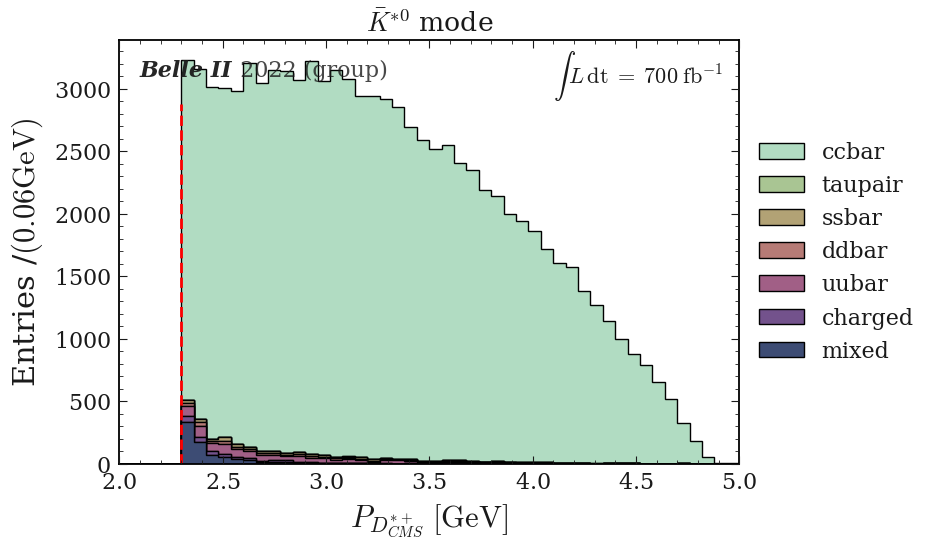

E_{\gamma}
$E_{\gamma} \; [\mathrm{GeV}]$


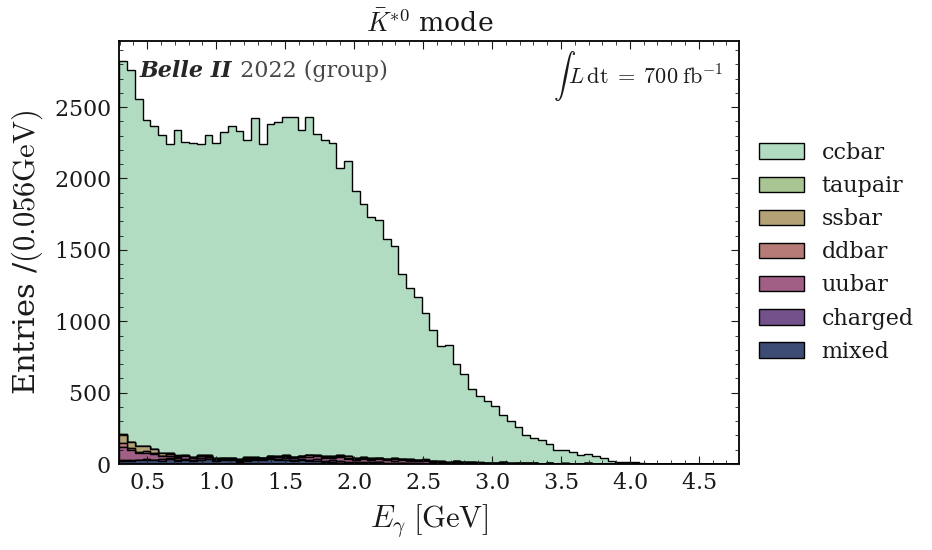

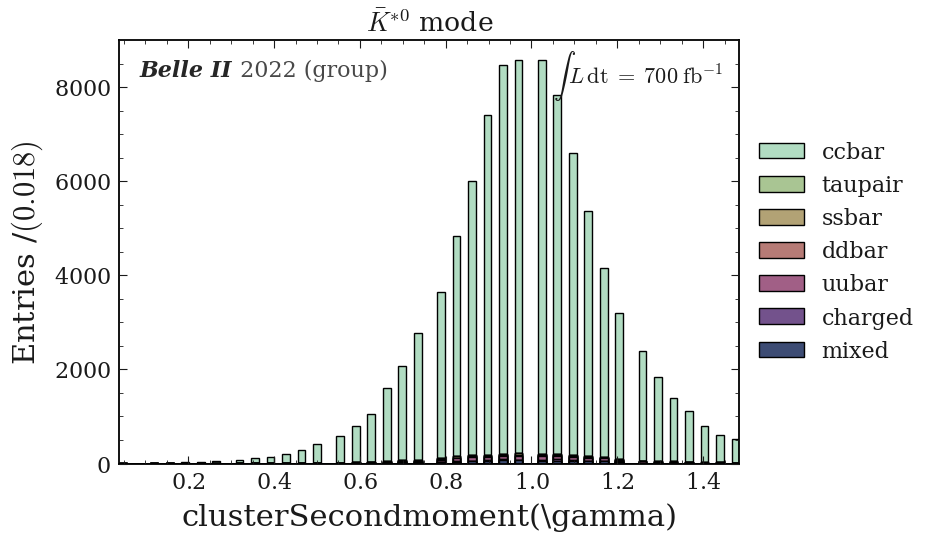

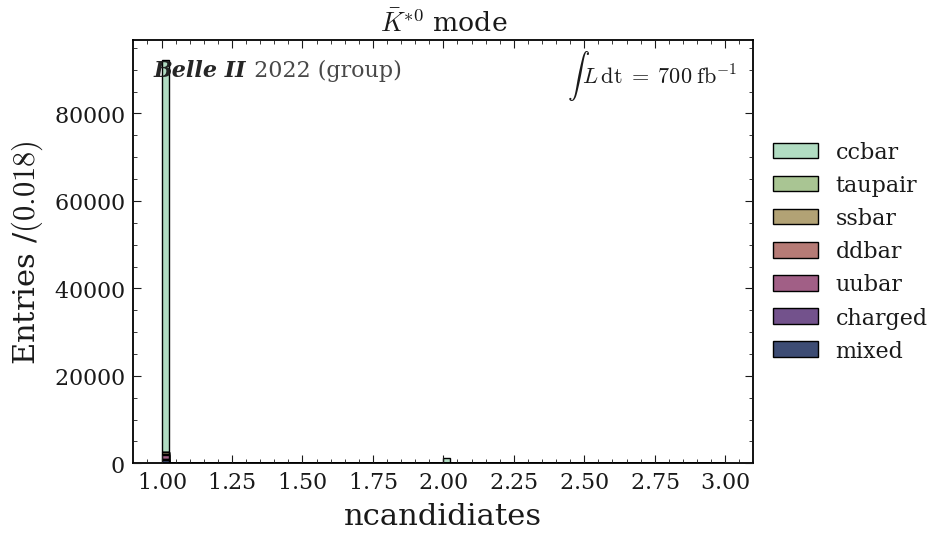

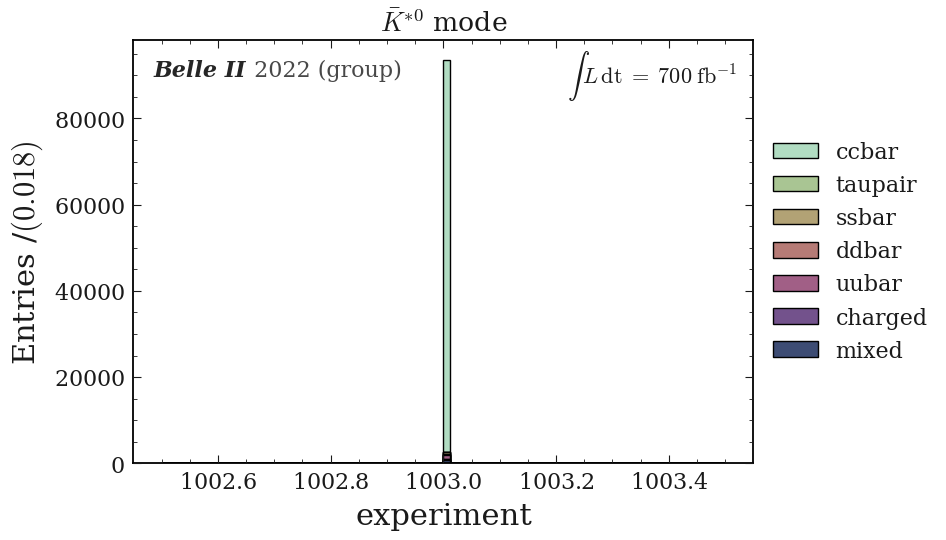

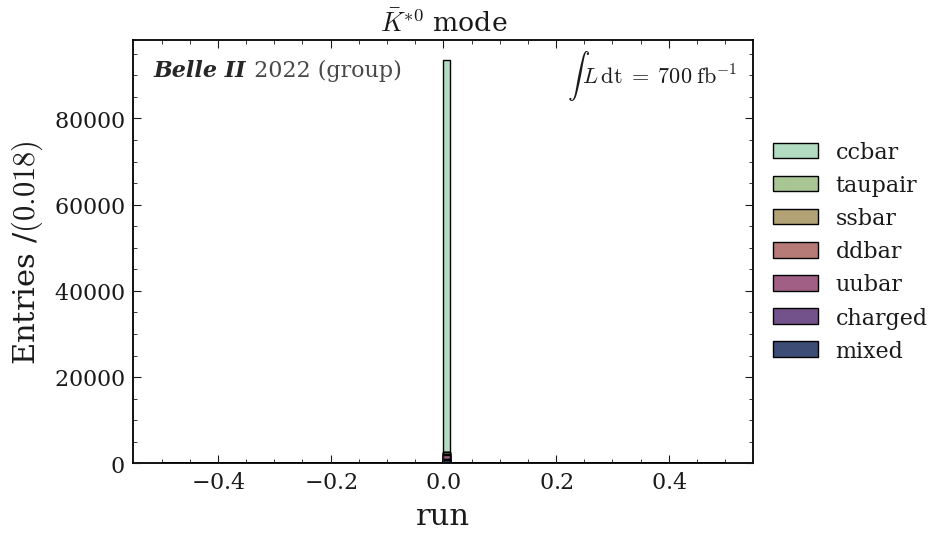

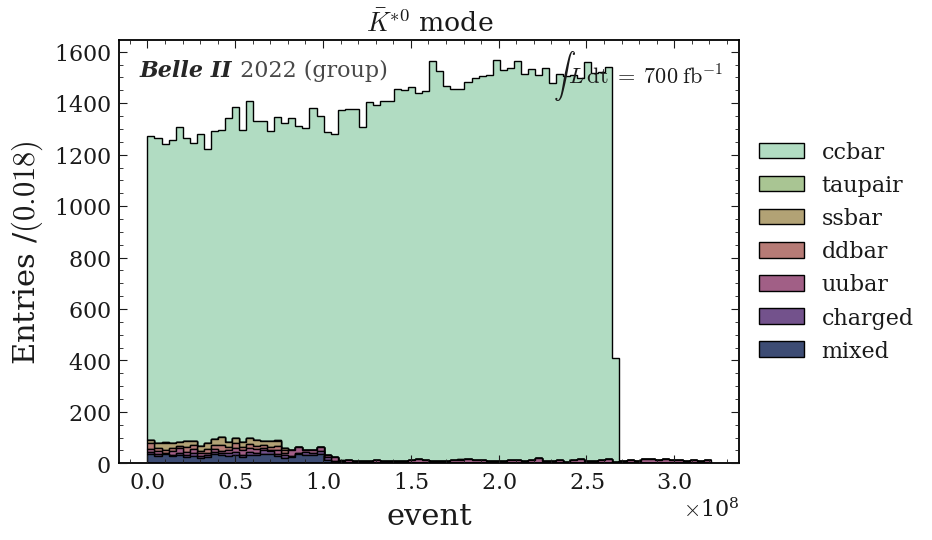

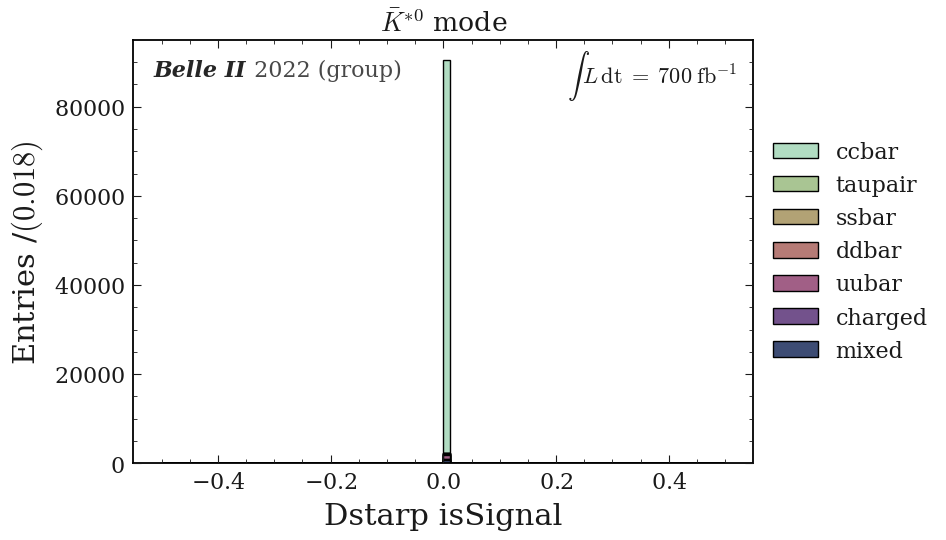

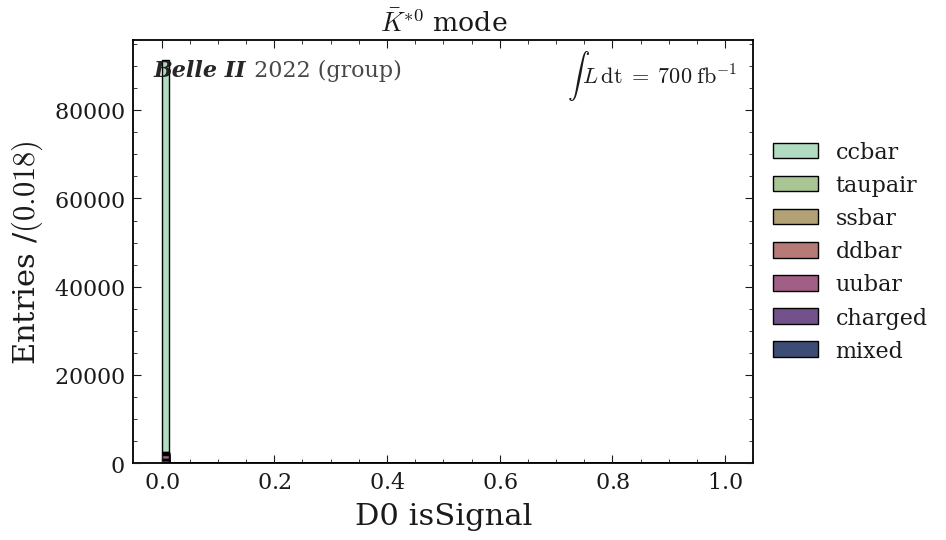

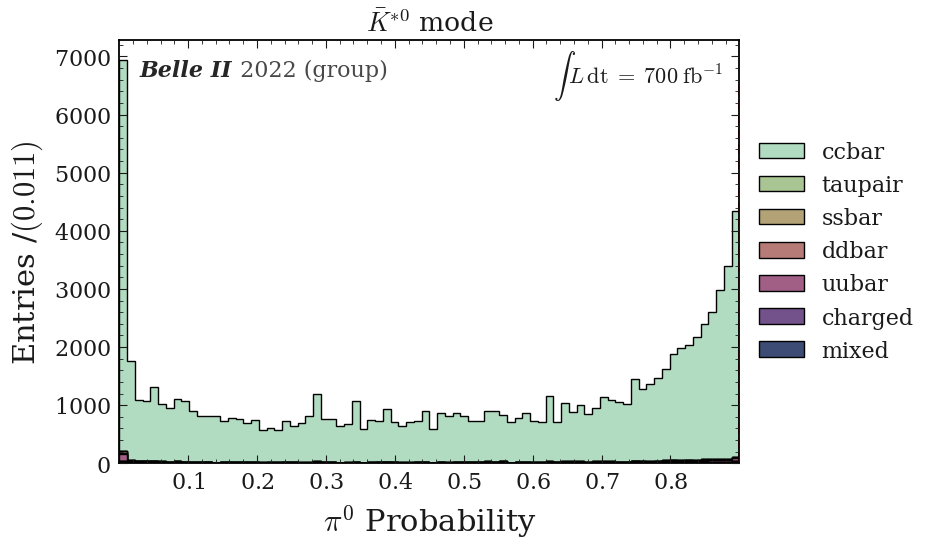

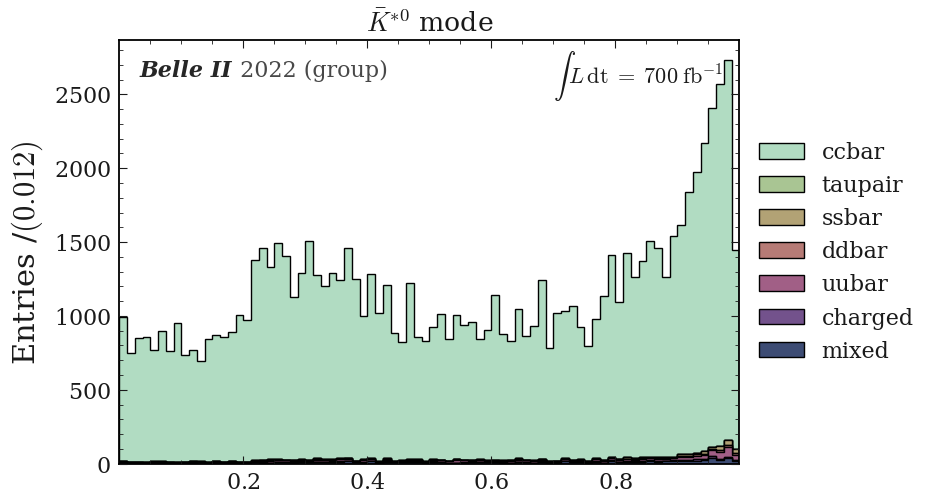

M(bar{K}^{*0})
$M(\bar{K}^{*0}) \; [\mathrm{GeV}]$


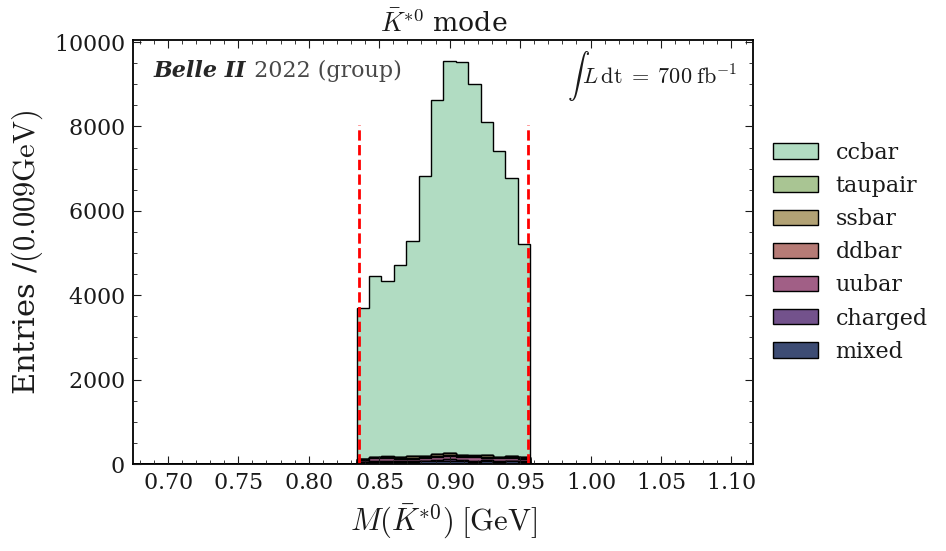

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [53]:
plot_title = r'$\bar{K}^{*0}$ mode'
var_unit = read_yaml_to_dict("vars_name_units")

var_unit = var_unit['units']

var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"
# draw_stack_no_signal(df=pd_antiKstar[pd_antiKstar['Pi0_Prob']<0.9 ],bins=80, vector='antiKstar', var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi)            

draw_stack_no_signal(figname="test",df=pd_antiKstar,bins=80, vector='antiKstar', var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            


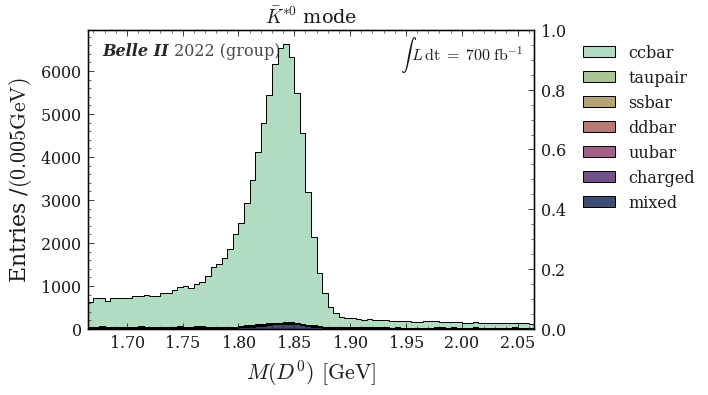

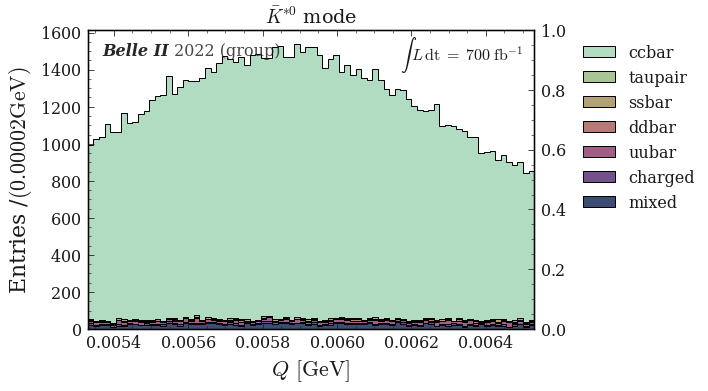

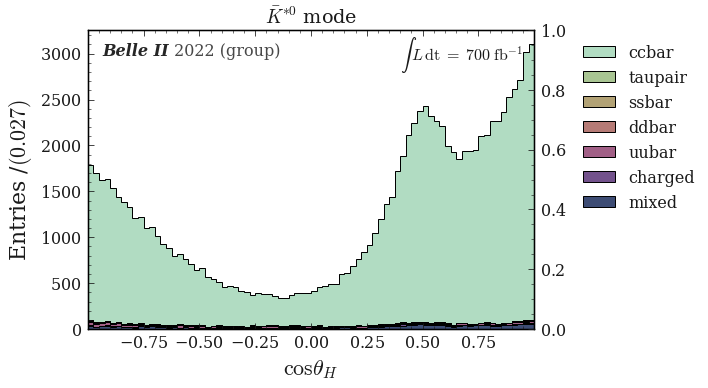

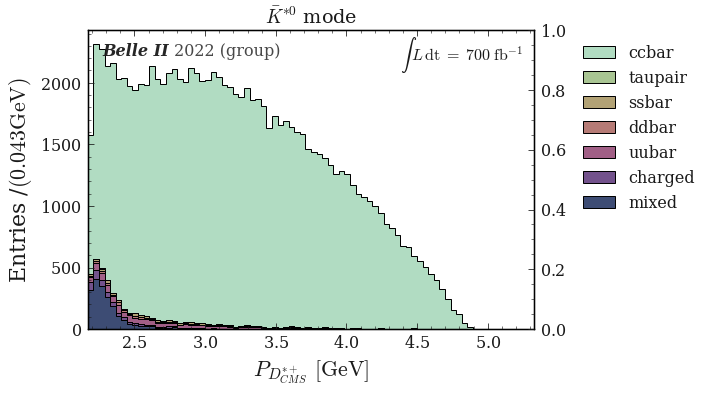

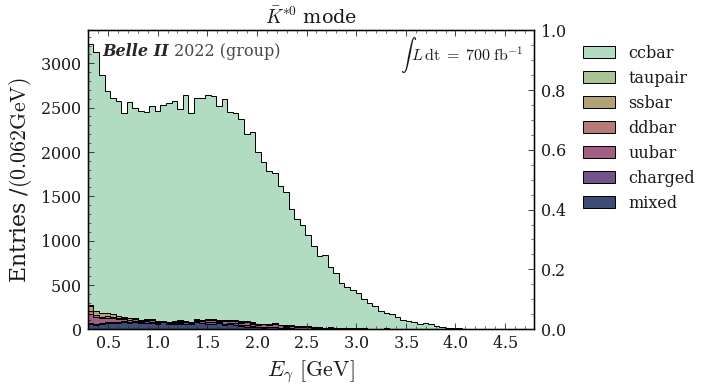

...

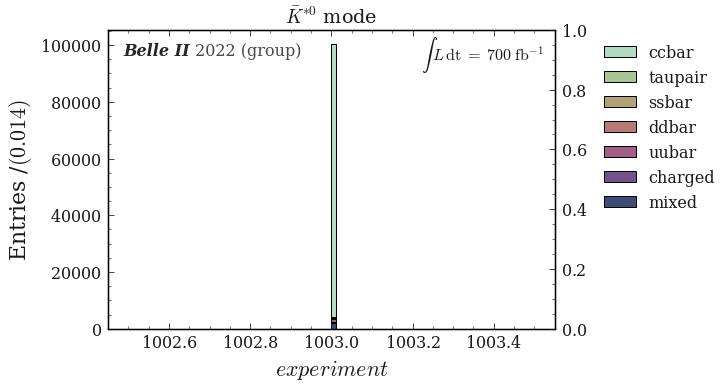

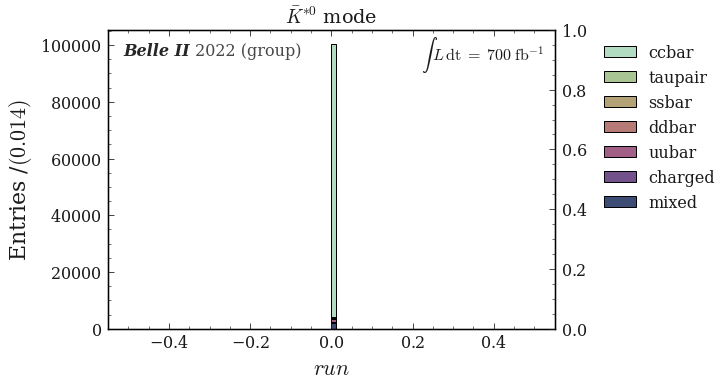

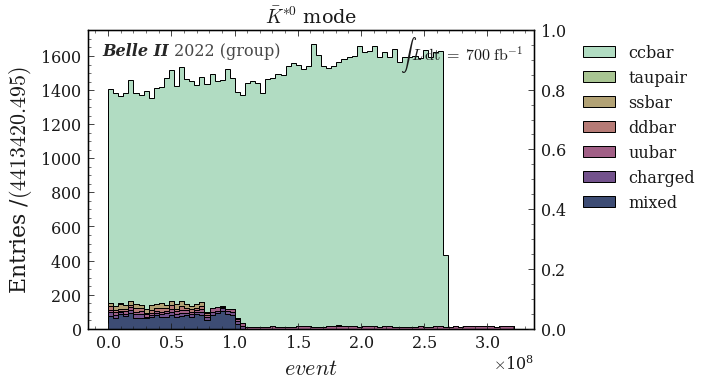

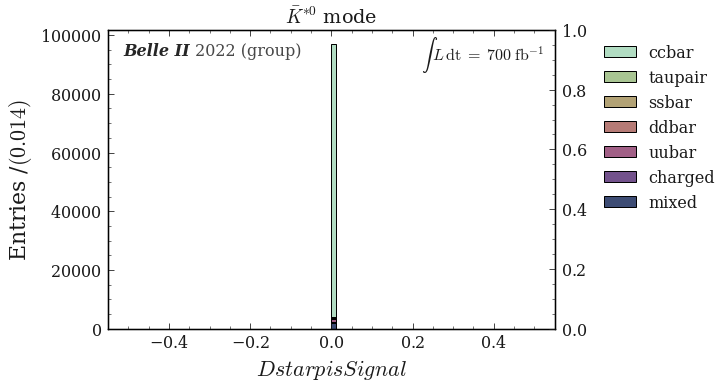

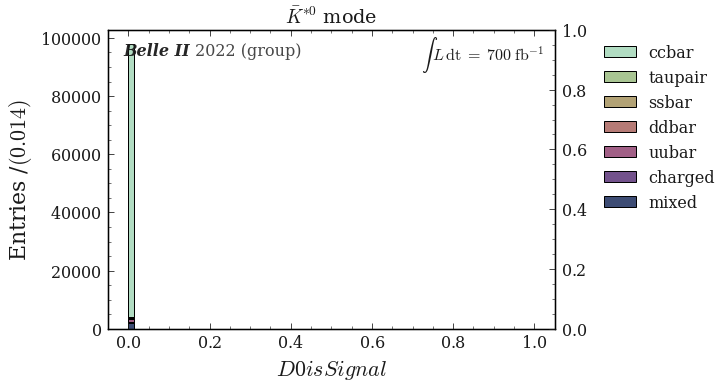

ValueError: 
$$
^
Expected end of text, found '$'  (at char 0), (line:1, col:1)

<Figure size 576x396 with 2 Axes>

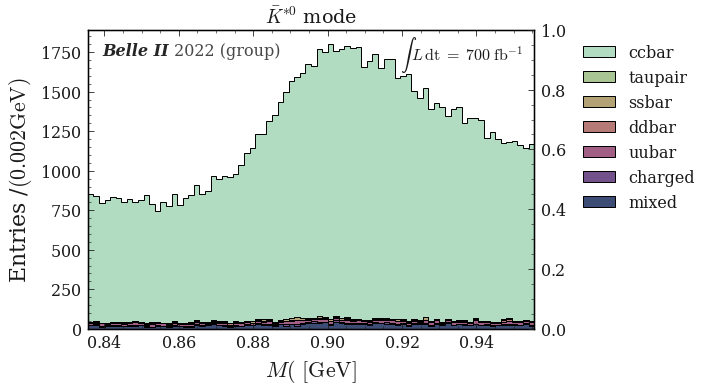

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 576x396 with 0 Axes>

In [16]:
plot_title = r'$\bar{K}^{*0}$ mode'
var_unit_phi = read_yaml_to_dict("vars_name_units")

var_unit_phi = var_unit_phi['units']

var_name_phi = read_yaml_to_dict("vars_name_units")
var_name_phi = var_name_phi['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"
# draw_stack_no_signal(df=pd_antiKstar[pd_antiKstar['Pi0_Prob']<0.9 ],bins=80, vector='antiKstar', var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi)            

draw_stack_no_signal(df=pd_antiKstar[(pd_antiKstar['Pi0_Prob']<0.9) & (pd_antiKstar['antiKstar_InvM']<0.89555+0.06) & (pd_antiKstar['antiKstar_InvM']>0.89555-0.06)],bins=80, vector='antiKstar', var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi)            


## omega

(1.665,2.065,51)
M(D^0)
$M(D^0) \; [\mathrm{GeV}]$


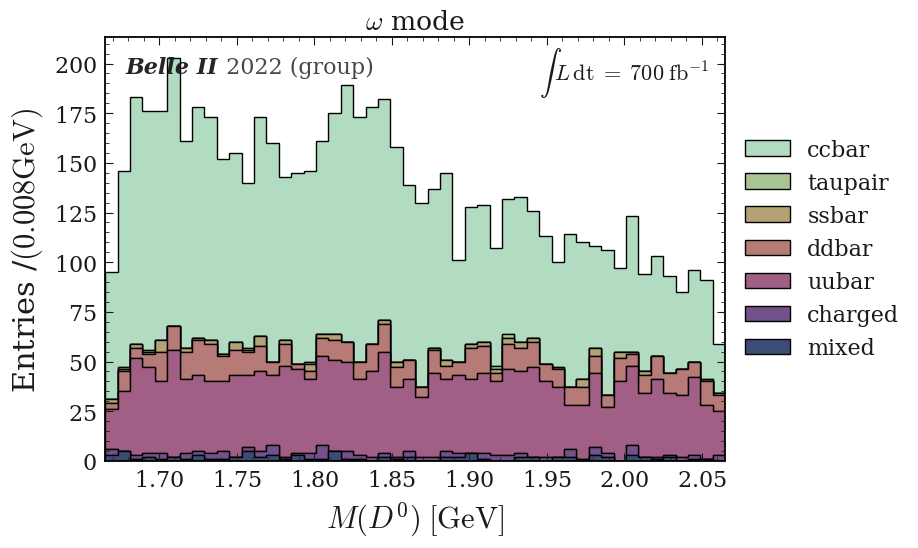

Q
$Q \; [\mathrm{GeV}]$


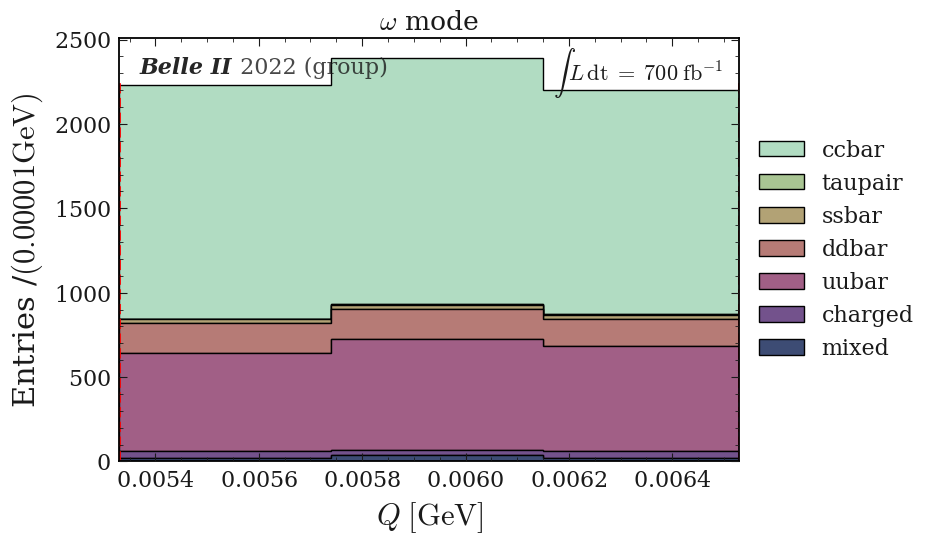

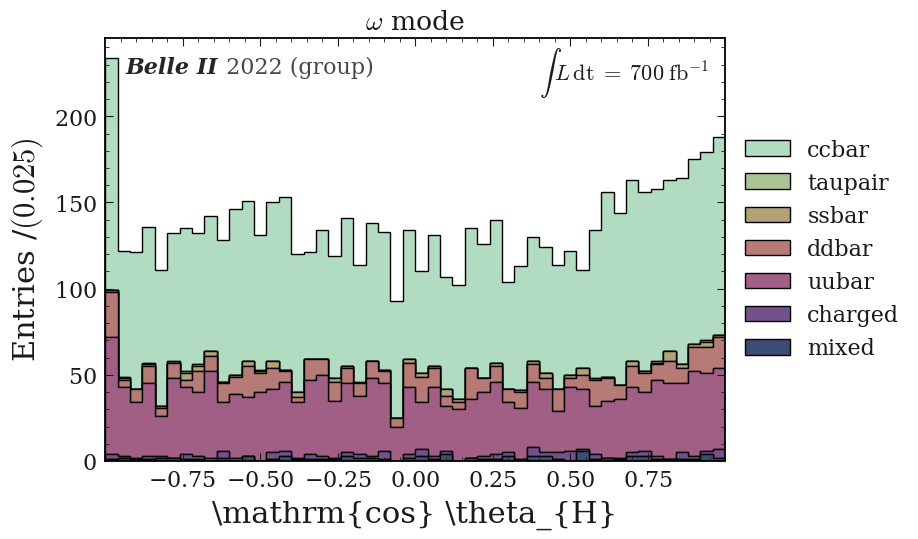

[2.   2.06 2.12 2.18 2.24 2.3  2.36 2.42 2.48 2.54 2.6  2.66 2.72 2.78
 2.84 2.9  2.96 3.02 3.08 3.14 3.2  3.26 3.32 3.38 3.44 3.5  3.56 3.62
 3.68 3.74 3.8  3.86 3.92 3.98 4.04 4.1  4.16 4.22 4.28 4.34 4.4  4.46
 4.52 4.58 4.64 4.7  4.76 4.82 4.88 4.94 5.  ]
P_{D^{*+}_{CMS}}
$P_{D^{*+}_{CMS}} \; [\mathrm{GeV}]$


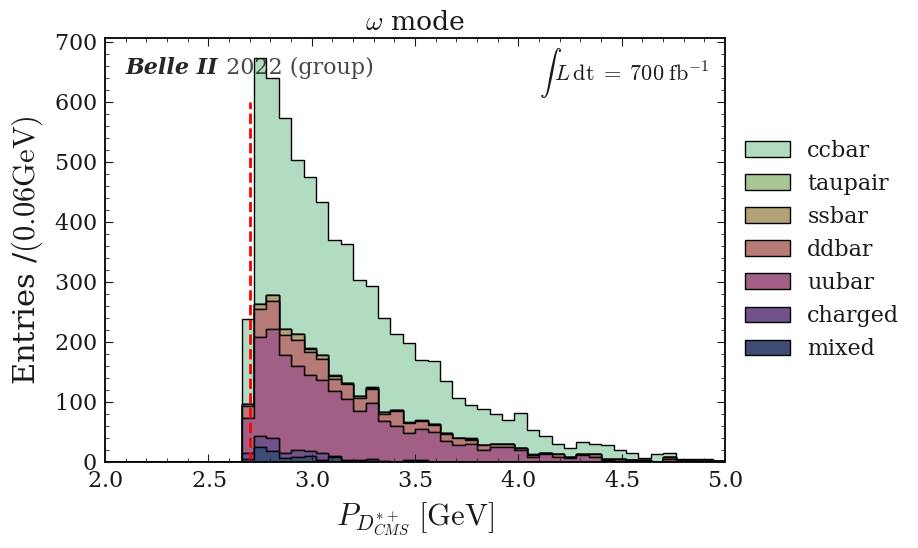

E_{\gamma}
$E_{\gamma} \; [\mathrm{GeV}]$


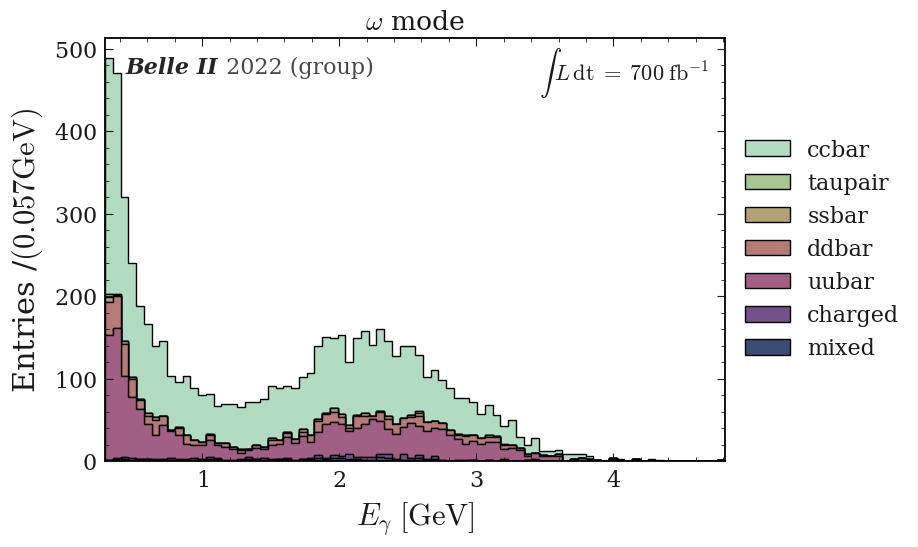

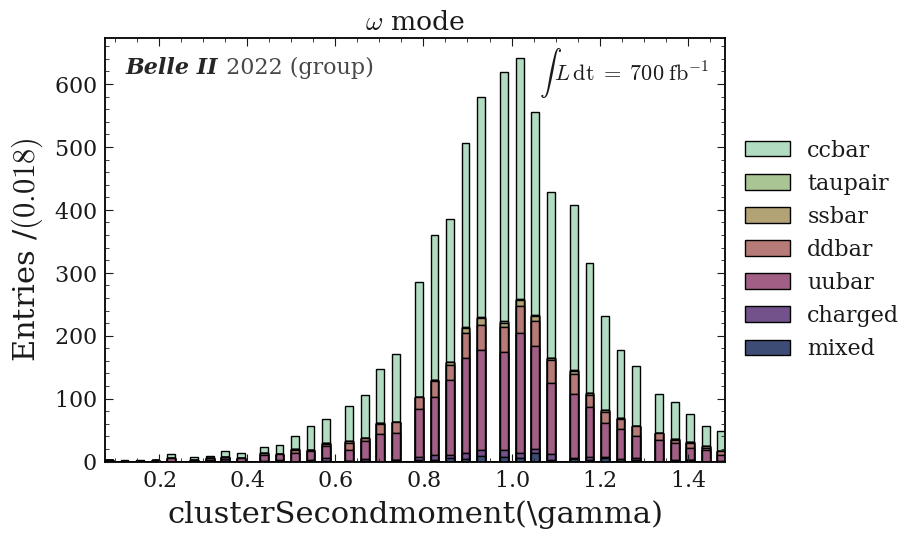

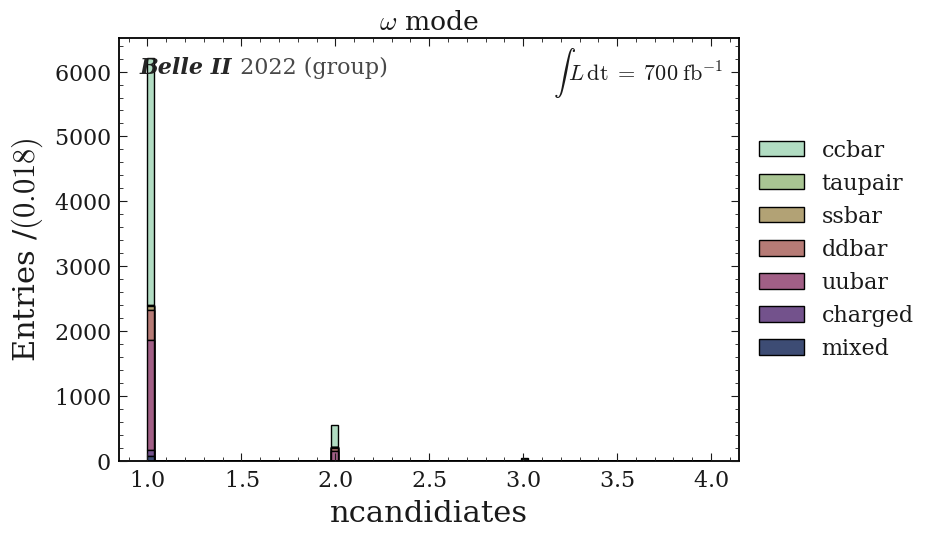

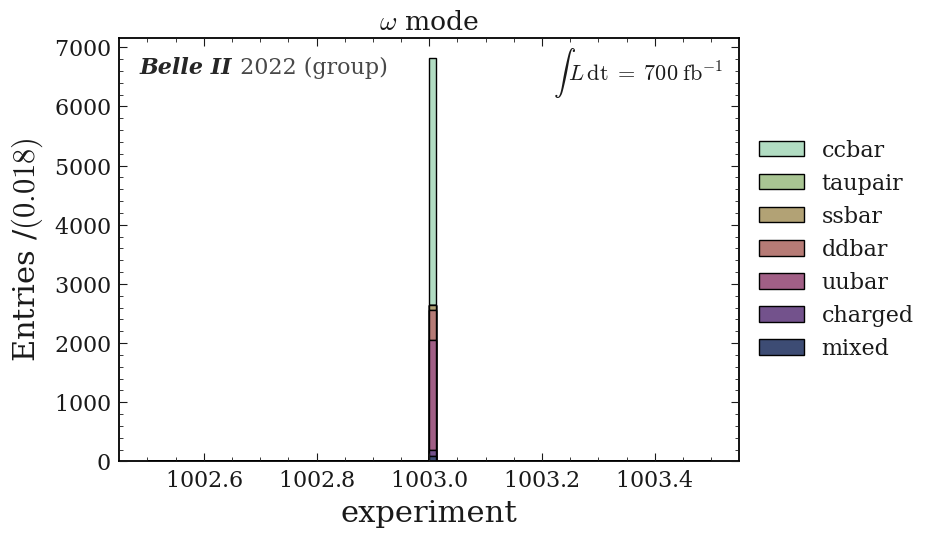

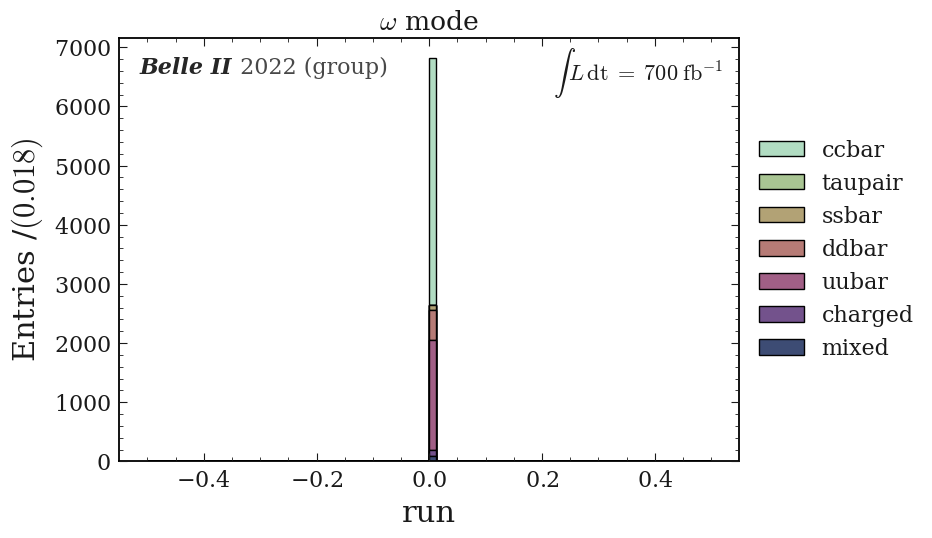

...

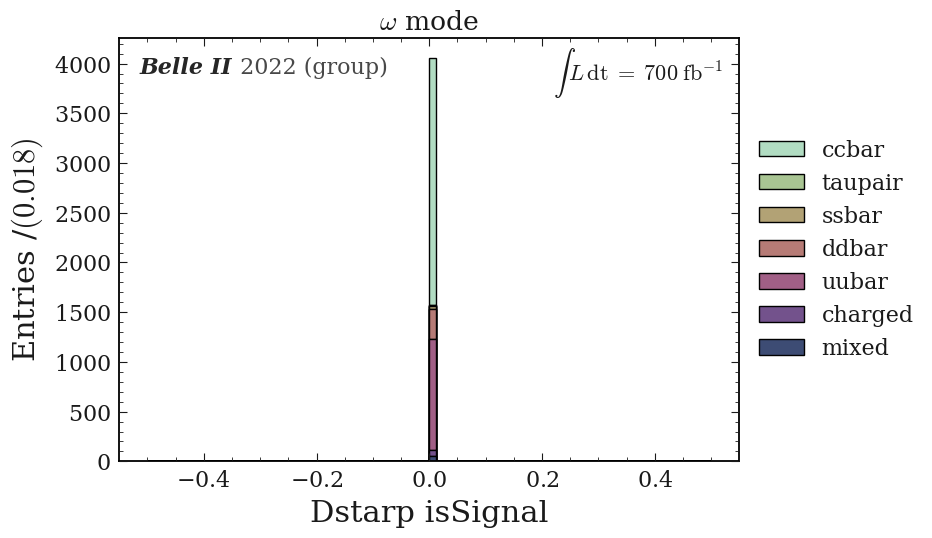

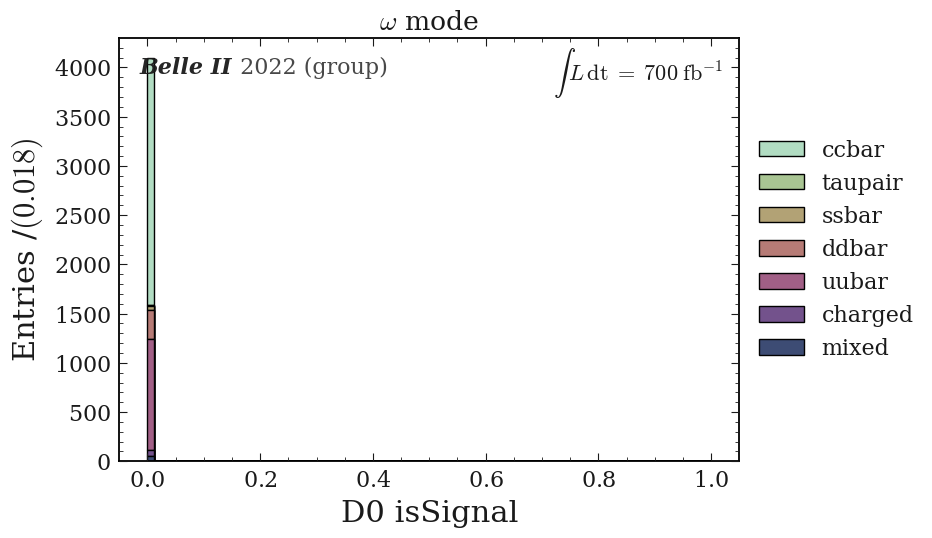

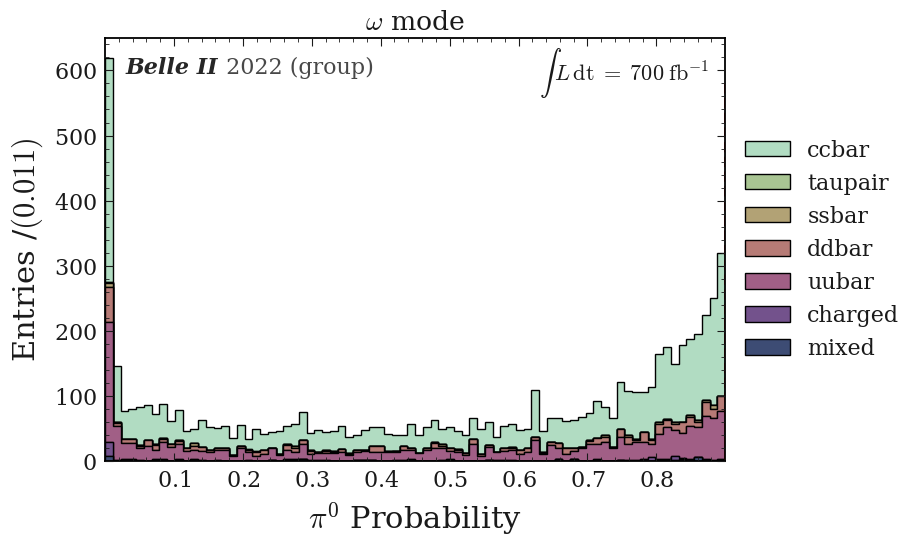

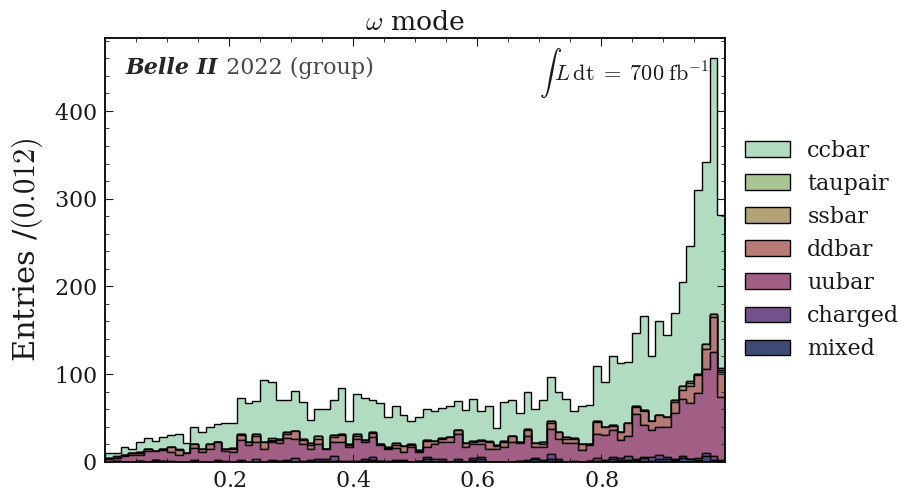

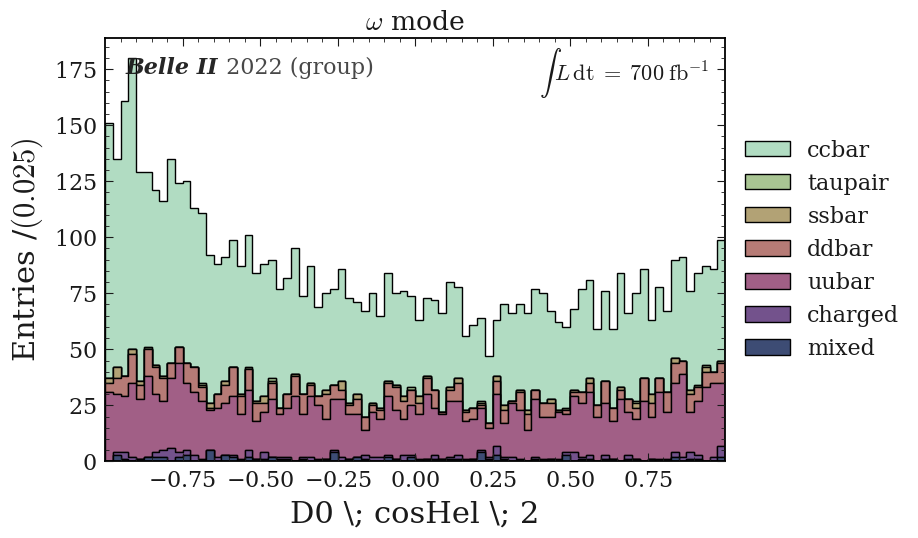

M(\omega)
$M(\omega) \; [\mathrm{GeV}]$


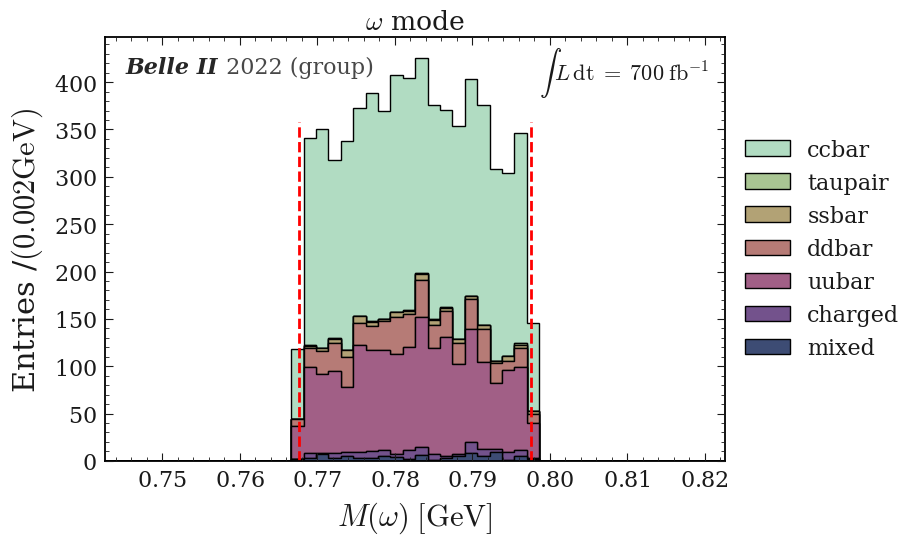

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 800x550 with 0 Axes>

In [54]:
plot_title = r'$\omega$ mode'
var_unit = read_yaml_to_dict("vars_name_units")

var_unit = var_unit['units']

var_name = read_yaml_to_dict("vars_name_units")
var_name = var_name['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"
draw_stack_no_signal(figname="test",df=pd_omega,bins=80, vector='omega', var_name=var_name,var_unit=var_unit, plot_title=plot_title,total_lumi=total_lumi)            


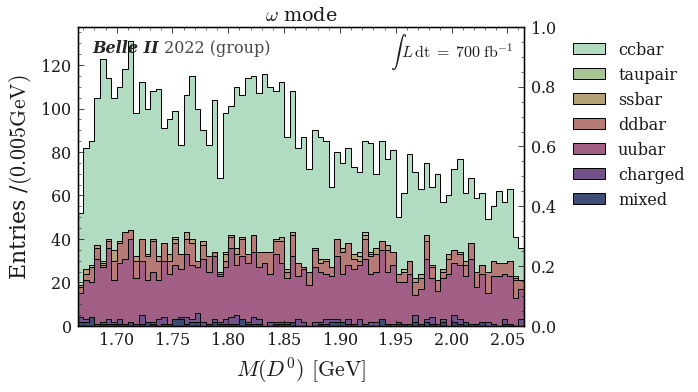

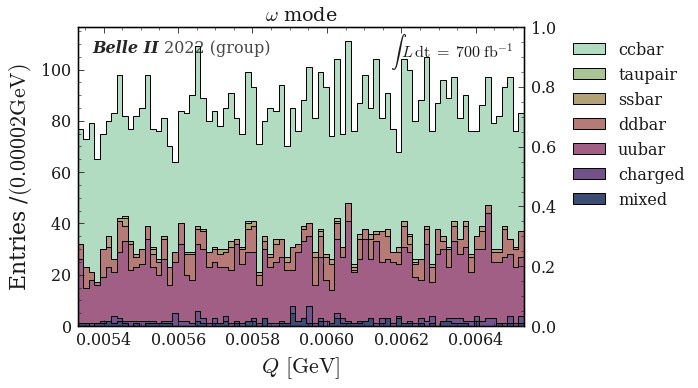

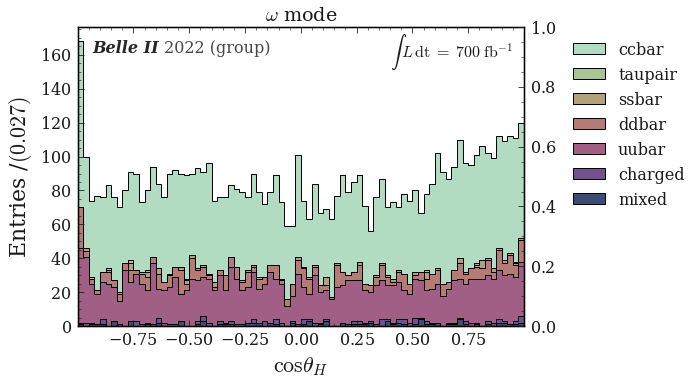

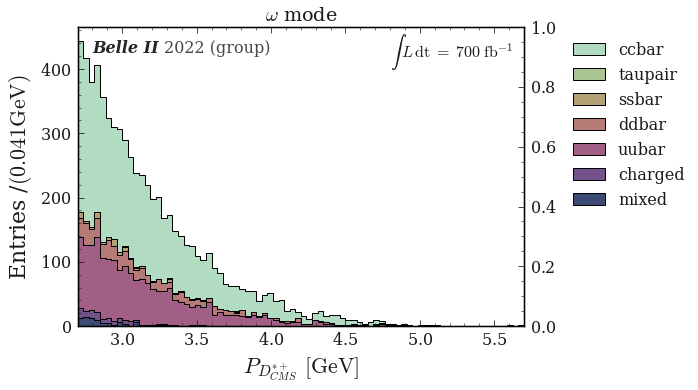

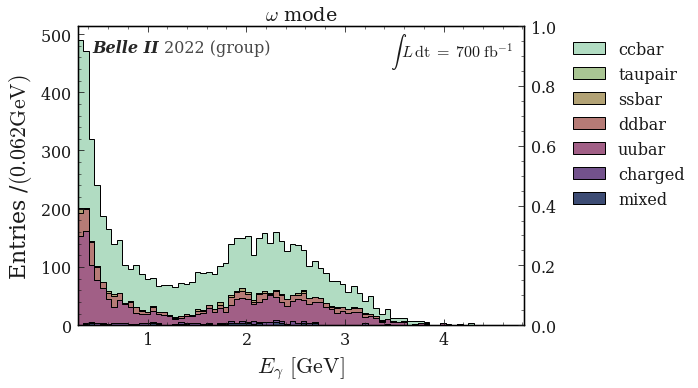

...

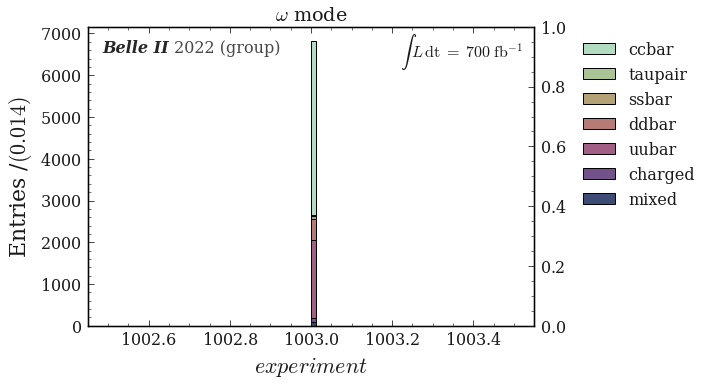

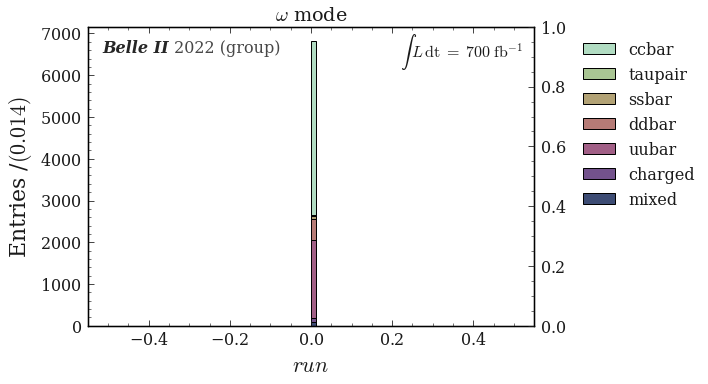

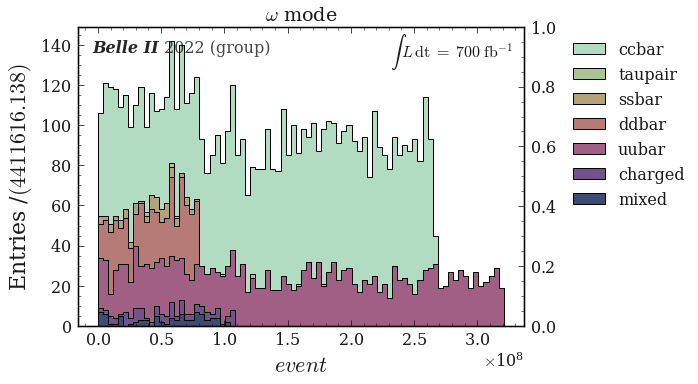

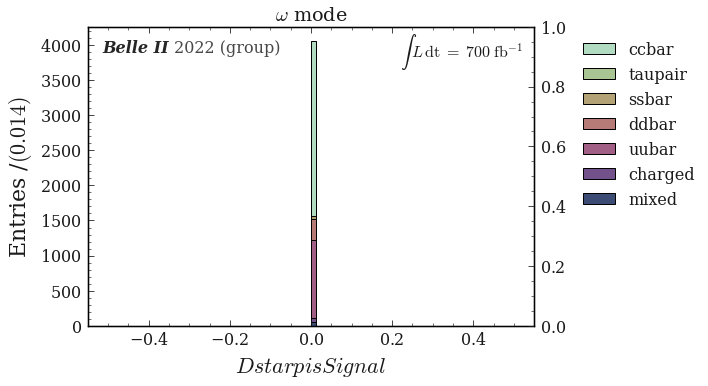

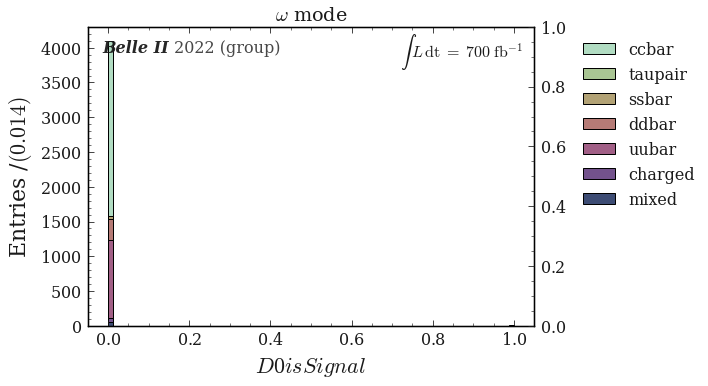

ValueError: 
$$
^
Expected end of text, found '$'  (at char 0), (line:1, col:1)

<Figure size 576x396 with 2 Axes>

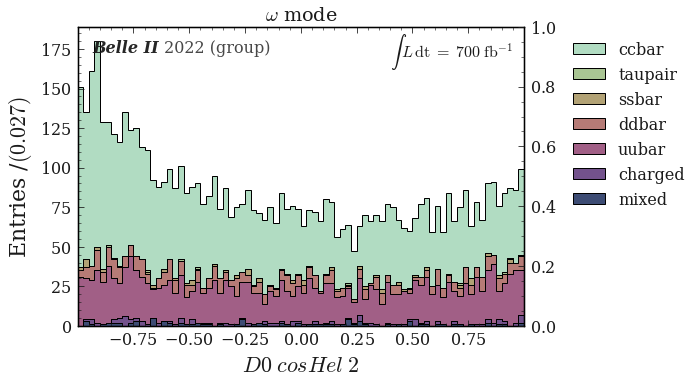

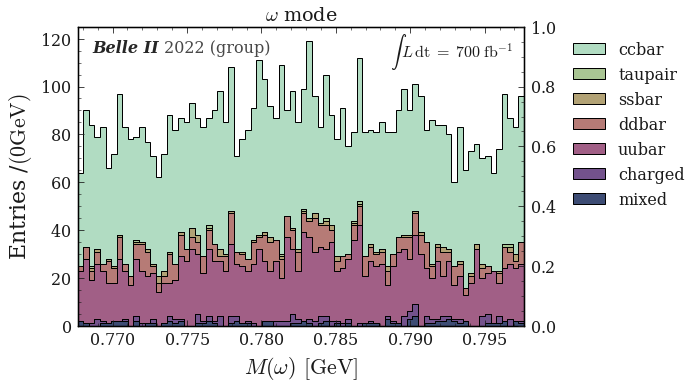

dict_keys(['phi', 'rho', 'antiKstar', 'omega'])


<Figure size 576x396 with 0 Axes>

In [18]:
plot_title = r'$\omega$ mode'
var_unit_phi = read_yaml_to_dict("vars_name_units")

var_unit_phi = var_unit_phi['units']

var_name_phi = read_yaml_to_dict("vars_name_units")
var_name_phi = var_name_phi['name']

total_lumi="$700\; \mathrm{fb}^{-1}$"
draw_stack_no_signal(df=pd_omega[pd_omega['Pi0_Prob']<0.9],bins=80, vector='omega', var_name=var_name_phi,var_unit=var_unit_phi, plot_title=plot_title,total_lumi=total_lumi)            
